## Data Sci Eng Methods
## Assignment 4 – Combine Data Cleaning, Feature Selection, Modeling, and Interpretability into one report

## Abstract
## Combine Data Cleaning, Feature Selection, Modeling, and Interpretability into one report

### The focus is readability and clarity.

 
##### The following must be answered:

1. What is the question?
2. What did you do?
3. How well did it work?
4. What did you learn?

## Data Description

##### 1. hotel : Hotel(There is only two categories one is resort hotel and other is city hotel)

##### 2. is_canceled : The value represents 1 if the booking is canceled or it represents 0 .

##### 3. lead_time :It is the number of days between the time a guest books their room and the time they are scheduled to arive at the hotel.

##### 4. arrival_date_year : It indicates the year in which the guest will arrive to the hotel.

##### 5. arrival_date_month : It indicates the month in which guest will arrive to the hotel.

##### 6. arrival_date_week_number : This indicates the week number in which the guest will arrive to the hotel

##### 7. arrival_date_day_of_month : This indicates the day of the month in which the guest will arrive to the hotel.

##### 8. stays_in_weekend_nights : Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel

##### 9. stays_in_week_nights : Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel

##### 10. adults : Number of adults

##### 11. children : Number of children

##### 12. babies : Number of babies

##### 13. meal : Type of meal booked . Categories are presented in standard hospitality meal packages:

##### (BB:"Bed & Breakfast"; HB:"Bed,Breakfast & Dinner ; FB: "Bed & All meals(Breakfast,Lunch & Dinner)

##### 14. country : Country of origin.

##### 15. market_segment : Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”

##### 16. distribution_channel : Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”

##### 17. is_repeated_guest : The value represents 1 if the booking name was from a repeated guest or it represents 0 .

##### 18 .previous_cancellations : Number of previous bookings that were cancelled by the customer prior to the current booking

##### 19. previous_bookings_not_canceled : Number of previous bookings not cancelled by the customer prior to the current booking

##### 20. reserved_room_type : Code of room type reserved. Code is presented instead of designation for anonymity reasons.

##### 21. assigned_room_type : Code for the type of room assigned to the booking.

##### 22. booking_changes : Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation

##### 23. deposit_type : Indication on if the customer made a deposit to guarantee the booking.

##### 24. agent : ID of the travel agency that made the booking

##### 25. company : ID of the company/entity that made the booking or responsible for paying the booking.

##### 26. days_in_waiting_list : Number of days the booking was in the waiting list before it was confirmed to the customer

##### 27. customer_type : Type of booking, assuming one of four categories

##### 28. adr : Average Daily Rate (ADR) measures the average rental revenue earned for an occupied room per day .

##### "The operating performance of a hotel or other lodging business can be determined by using the ADR."

##### 29. required_car_parking_spaces : Number of car parking spaces required by the customer

##### 30. total_of_special_requests: Number of special requests made by the customer (e.g. twin bed or high floor)

##### 31. reservation_status : Reservation last status, assuming one of three categories

##### Canceled – booking was canceled by the customer

##### Check-Out – customer has checked in but already departed

##### No-Show – customer did not check-in and did inform the hotel of the reason why

##### 32. reservation_status_date : Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to  understand when was the booking canceled or when did the customer checked-out of the hotel

In [ ]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter

import csv
import json
import logging
import optparse
import os
import random
import sys
import time
from datetime import datetime
from distutils.util import strtobool

# Importing all the libararies required for the assignment
import h2o
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import psutil
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch
from matplotlib.pyplot import figure
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import pydot
import graphviz
import matplotlib.image as mpimg

sns.set(rc={"figure.figsize": (16, 8)})

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

# Model Interpretation
!pip install shap
import shap
from sklearn.model_selection import train_test_split

In [ ]:
# Reading CSV file into Pandas DataFrame
data=pd.read_csv("https://raw.githubusercontent.com/namandiwan10/data-science-assignments/main/hotel_bookings.csv")

In [ ]:
#Viewing data which is inside the csv file 
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
#Viewing Data types of all columns of the dataset
for dtype in data.dtypes.iteritems():
    print(dtype)

('hotel', dtype('O'))
('is_canceled', dtype('int64'))
('lead_time', dtype('int64'))
('arrival_date_year', dtype('int64'))
('arrival_date_month', dtype('O'))
('arrival_date_week_number', dtype('int64'))
('arrival_date_day_of_month', dtype('int64'))
('stays_in_weekend_nights', dtype('int64'))
('stays_in_week_nights', dtype('int64'))
('adults', dtype('int64'))
('children', dtype('float64'))
('babies', dtype('int64'))
('meal', dtype('O'))
('country', dtype('O'))
('market_segment', dtype('O'))
('distribution_channel', dtype('O'))
('is_repeated_guest', dtype('int64'))
('previous_cancellations', dtype('int64'))
('previous_bookings_not_canceled', dtype('int64'))
('reserved_room_type', dtype('O'))
('assigned_room_type', dtype('O'))
('booking_changes', dtype('int64'))
('deposit_type', dtype('O'))
('agent', dtype('float64'))
('company', dtype('float64'))
('days_in_waiting_list', dtype('int64'))
('customer_type', dtype('O'))
('adr', dtype('float64'))
('required_car_parking_spaces', dtype('int64'))

In [ ]:
# getting number of rows and columns
data.shape

(119390, 32)

## What are the data types ? (both numerical and categorical listed below)

In [ ]:
# getting the data type and count of all the features along with numerical as well as categorical features
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

## Numeric Features

In [ ]:
# general distribution of all the features (numerical data only)
data.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,119390.0,0.370416,0.482918,0.00,0.00,0.000,1.0,1.0
lead_time,119390.0,104.011416,106.863097,0.00,18.00,69.000,160.0,737.0
arrival_date_year,119390.0,2016.156554,0.707476,2015.00,2016.00,2016.000,2017.0,2017.0
arrival_date_week_number,119390.0,27.165173,13.605138,1.00,16.00,28.000,38.0,53.0
arrival_date_day_of_month,119390.0,15.798241,8.780829,1.00,8.00,16.000,23.0,31.0
stays_in_weekend_nights,119390.0,0.927599,0.998613,0.00,0.00,1.000,2.0,19.0
stays_in_week_nights,119390.0,2.500302,1.908286,0.00,1.00,2.000,3.0,50.0
adults,119390.0,1.856403,0.579261,0.00,2.00,2.000,2.0,55.0
children,119386.0,0.103890,0.398561,0.00,0.00,0.000,0.0,10.0
babies,119390.0,0.007949,0.097436,0.00,0.00,0.000,0.0,10.0


## Categorical Features

In [ ]:
#Getting categorical data and its count
data.describe(include = "object").T

,count,unique,top,freq
hotel,119390,2,City Hotel,79330
arrival_date_month,119390,12,August,13877
meal,119390,5,BB,92310
country,118902,177,PRT,48590
market_segment,119390,8,Online TA,56477
distribution_channel,119390,5,TA/TO,97870
reserved_room_type,119390,10,A,85994
assigned_room_type,119390,12,A,74053
deposit_type,119390,3,No Deposit,104641
customer_type,119390,4,Transient,89613


## Data Cleaning

## Are there any missing values ?

In [ ]:
# checking null values for all the columns
data.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

## Which independent variables have missing data? How much? 

In [ ]:
# calculate the percentage of missing values for each column
missing_values_percentage = (data.isnull().sum() / data.shape[0]) * 100

# print the columns with missing values and their percentage
print(missing_values_percentage[missing_values_percentage > 0])

children     0.003350
country      0.408744
agent       13.686238
company     94.306893
dtype: float64


##### We observe that there are missing values in agent (13.68% data missing), company(94.3% data missing) and country(0.408% data missing) columns, so we will remove these missing vlaues

In [ ]:
for col in data.columns:
    print("Column:",col, "\n\n", data[col].value_counts(),"\n")

Column: hotel 

 City Hotel      79330
Resort Hotel    40060
Name: hotel, dtype: int64 

Column: is_canceled 

 0    75166
1    44224
Name: is_canceled, dtype: int64 

Column: lead_time 

 0      6345
1      3460
2      2069
3      1816
4      1715
       ... 
400       1
370       1
532       1
371       1
463       1
Name: lead_time, Length: 479, dtype: int64 

Column: arrival_date_year 

 2016    56707
2017    40687
2015    21996
Name: arrival_date_year, dtype: int64 

Column: arrival_date_month 

 August       13877
July         12661
May          11791
October      11160
April        11089
June         10939
September    10508
March         9794
February      8068
November      6794
December      6780
January       5929
Name: arrival_date_month, dtype: int64 

Column: arrival_date_week_number 

 33    3580
30    3087
32    3045
34    3040
18    2926
21    2854
28    2853
17    2805
20    2785
29    2763
42    2756
31    2741
41    2699
15    2689
27    2664
25    2663
38    2661
2

In [ ]:
#lets create a fuction that returns the percentage of missing values(null) = (sum of null rows)*100/ (total number of rows)
def percent_missing(data):
    percent_nan = 100* data.isnull().sum() / len(data)
    percent_nan = percent_nan[percent_nan>0].sort_values()
    return percent_nan

In [ ]:
# lets name percent_missing(df) data by percent_nan
percent_nan = percent_missing(data)

<AxesSubplot:>

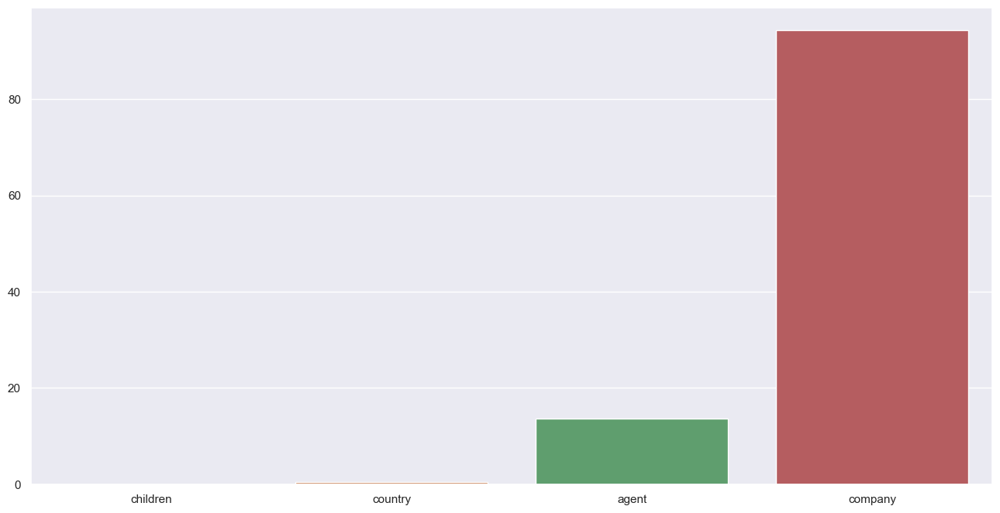

In [ ]:
sns.barplot(x=percent_nan.index,y=percent_nan)

##### We observe that more than 90% of the values of company column are missing

In [ ]:
#dropping company column since 94% rows are missing
data = data.drop(['company'],axis=1)

<AxesSubplot:>

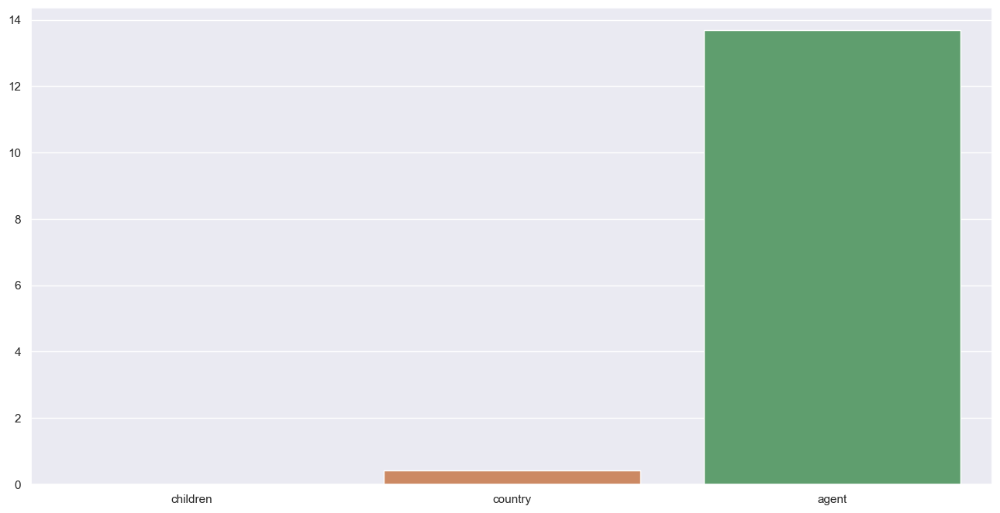

In [ ]:
percent_nan = percent_missing(data)
sns.barplot(x=percent_nan.index,y=percent_nan)

##### We observe that for agent column around 14% of the values are missing

##### Now we will remove missing values from children and country

In [ ]:
# So we drop the column 'agent'
data = data.drop("agent", axis=1)

<AxesSubplot:>

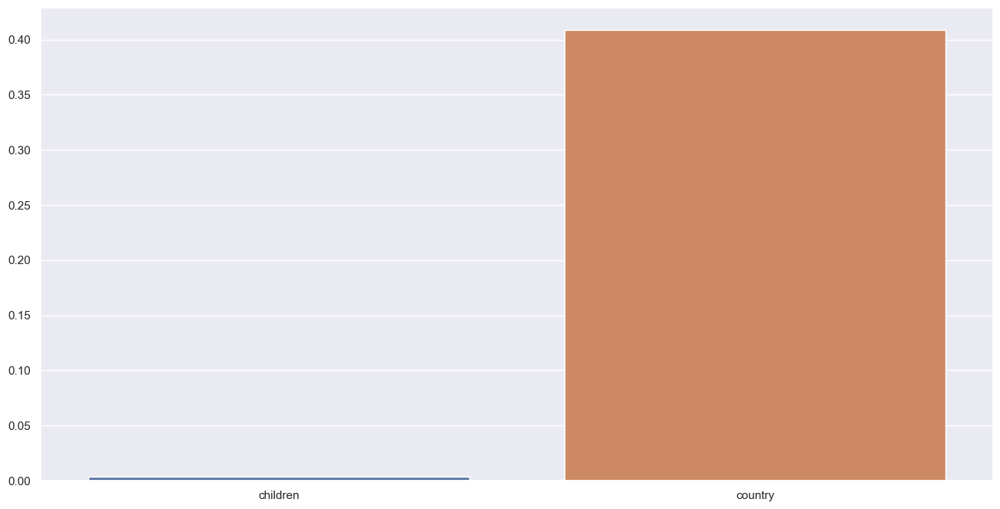

In [ ]:
percent_nan = percent_missing(data)
sns.barplot(x=percent_nan.index,y=percent_nan)

In [ ]:
# making children column as null
data[data['children'].isnull()]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
40600,City Hotel,1,2,2015,August,32,3,1,0,2,...,B,0,No Deposit,0,Transient-Party,12.0,0,1,Canceled,2015-08-01
40667,City Hotel,1,1,2015,August,32,5,0,2,2,...,B,0,No Deposit,0,Transient-Party,12.0,0,1,Canceled,2015-08-04
40679,City Hotel,1,1,2015,August,32,5,0,2,3,...,B,0,No Deposit,0,Transient-Party,18.0,0,2,Canceled,2015-08-04
41160,City Hotel,1,8,2015,August,33,13,2,5,2,...,B,0,No Deposit,0,Transient-Party,76.5,0,1,Canceled,2015-08-09


In [ ]:
# making country column as null
data[data['country'].isnull()]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
30,Resort Hotel,0,118,2015,July,27,1,4,10,1,...,A,2,No Deposit,0,Transient,62.0,0,2,Check-Out,2015-07-15
4127,Resort Hotel,1,0,2016,February,8,15,0,0,0,...,P,0,No Deposit,0,Transient,0.0,0,0,Canceled,2016-02-15
7092,Resort Hotel,1,8,2016,July,30,21,0,1,1,...,A,0,No Deposit,0,Transient,73.0,0,2,Canceled,2016-07-20
7860,Resort Hotel,1,39,2016,August,36,30,0,5,2,...,A,0,No Deposit,0,Transient,159.0,0,5,Canceled,2016-07-22
8779,Resort Hotel,1,0,2016,October,42,13,0,1,1,...,A,0,No Deposit,0,Transient,50.0,0,0,Canceled,2016-10-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65908,City Hotel,1,0,2017,April,15,10,0,0,0,...,P,0,No Deposit,0,Transient,0.0,0,0,Canceled,2017-04-10
65909,City Hotel,1,0,2017,April,15,10,0,0,0,...,P,0,No Deposit,0,Transient,0.0,0,0,Canceled,2017-04-10
65910,City Hotel,1,0,2017,April,15,10,0,0,0,...,P,0,No Deposit,0,Transient,0.0,0,0,Canceled,2017-04-10
80830,City Hotel,0,4,2015,November,48,23,1,2,1,...,A,0,No Deposit,0,Transient-Party,70.0,0,0,Check-Out,2015-11-26


In [ ]:
# dropping country and choldren column
data.dropna(subset=["children","country"],inplace=True)

In [ ]:
data[data['country'].isnull()]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


In [ ]:
# checking in the data if it has missing values again after removing the missing values
data.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

##### Checking for duplicate values

In [ ]:
# checking for number of duplicate values
data.duplicated().sum()

31984

In [ ]:
# removing duplicte values from the dataset
data.drop_duplicates(inplace = True)

In [ ]:
data.duplicated().sum()

0

## Data Analysing

Text(0.5, 1.0, 'Pie Chart For Most Preffered Hotel')

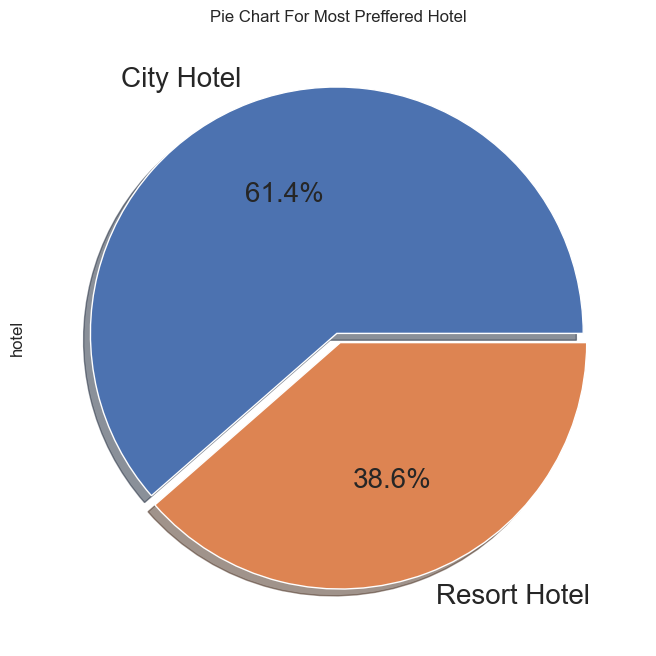

In [ ]:
# Most preffered hotel on a pie chart
data['hotel'].value_counts().plot.pie(explode=[0.02, 0.02], autopct='%1.1f%%', shadow=True, figsize=(10,8),fontsize=20)
plt.title("Pie Chart For Most Preffered Hotel")

Text(0.5, 1.0, 'Cancellation(1) & Non_Cancellation(0) Of Bookings')

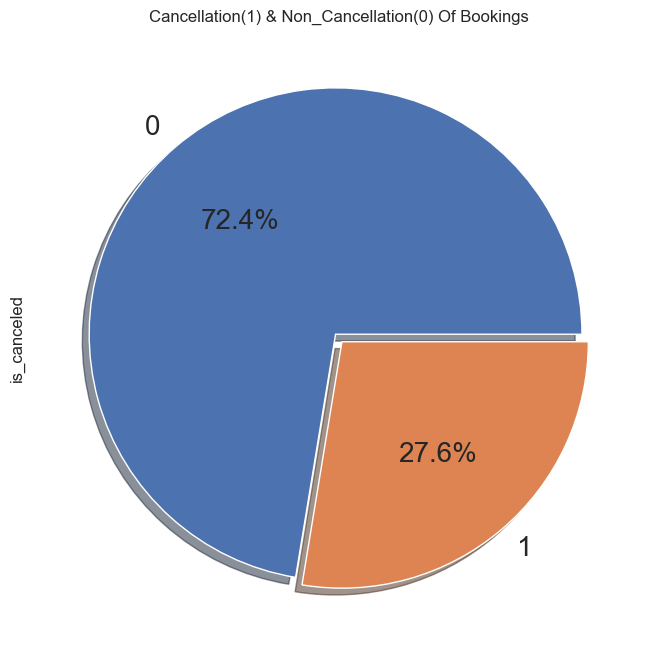

In [ ]:
# Cancellation % of bookings
data['is_canceled'].value_counts().plot.pie(explode=[0.02,0.02],autopct="%1.1f%%",shadow=True,figsize=(10,8),fontsize=20)
plt.title("Cancellation(1) & Non_Cancellation(0) Of Bookings")

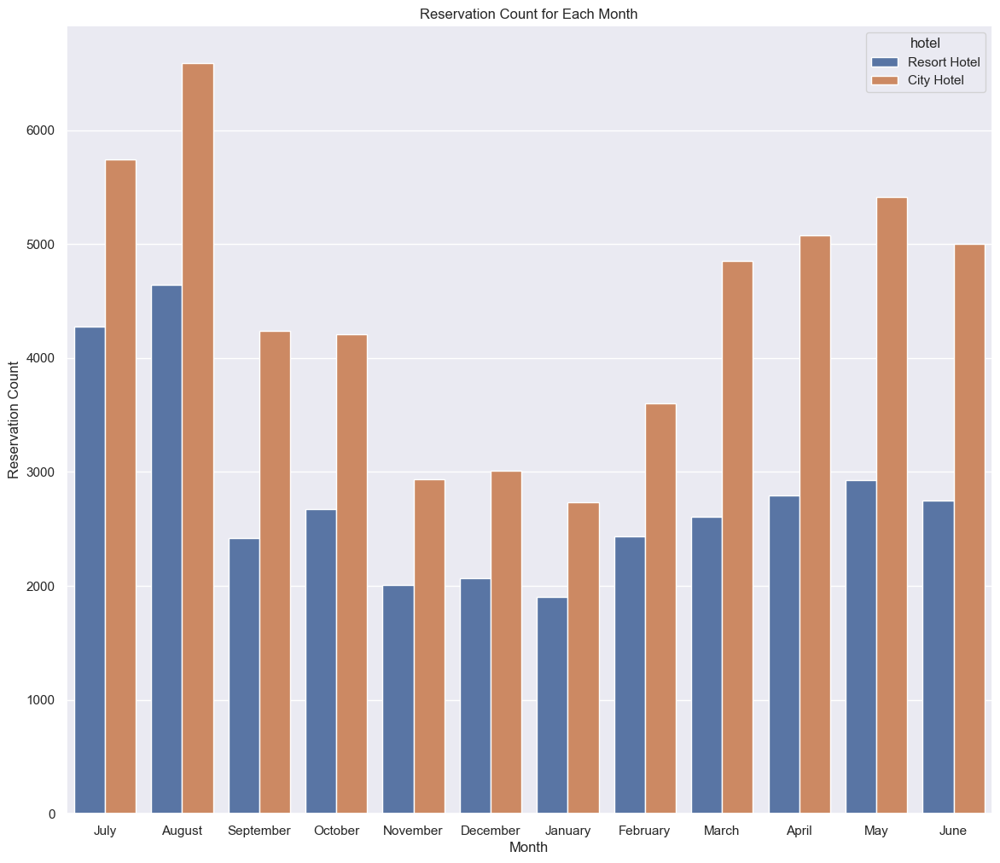

In [ ]:
# Reservation count for each month for each type hotel on a countplot
sns.set(rc={'figure.figsize':(14,12)})
graph = sns.countplot(x = 'arrival_date_month',hue='hotel', data=data)
graph.set(title='Reservation Count for Each Month')
graph.set_xlabel('Month', fontsize = 12)
graph.set_ylabel('Reservation Count', fontsize = 12)
plt.show()

In [ ]:
#Counting each type of meal
data["meal"].agg(["value_counts"])

,value_counts
BB,67540
SC,9473
HB,9054
Undefined,488
FB,359


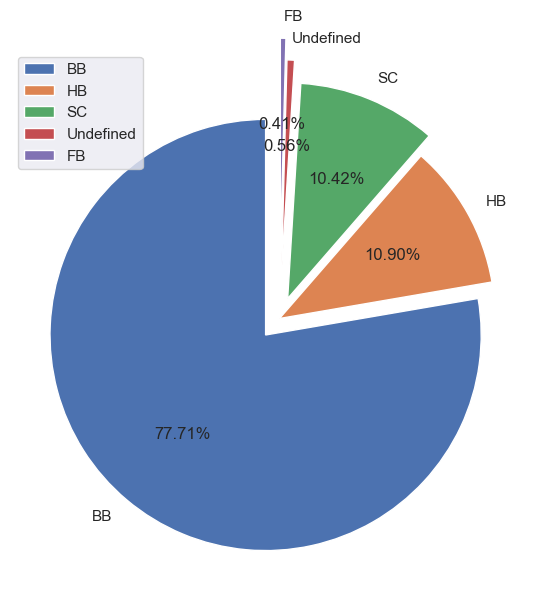

In [ ]:
#showing each type of meal in a pie chart
meal = ["BB", "HB", "SC", "Undefined", "FB"]
values = data.meal.value_counts()

plt.figure(figsize = (10, 7))
plt.pie(values, labels = meal, explode = (0.1, 0, 0.1, 0.2, 0.3), autopct = "%.2f%%",startangle = 90)

plt.legend()

plt.show();
# Customers prefer BB (bed and breakfast)

In [ ]:
# adults fav and least fav meal
data.iloc[np.where((data["adults"] > 0) & (data["meal"] != "Undefined"))]["meal"].agg(["value_counts"])

,value_counts
BB,67256
SC,9386
HB,9045
FB,359


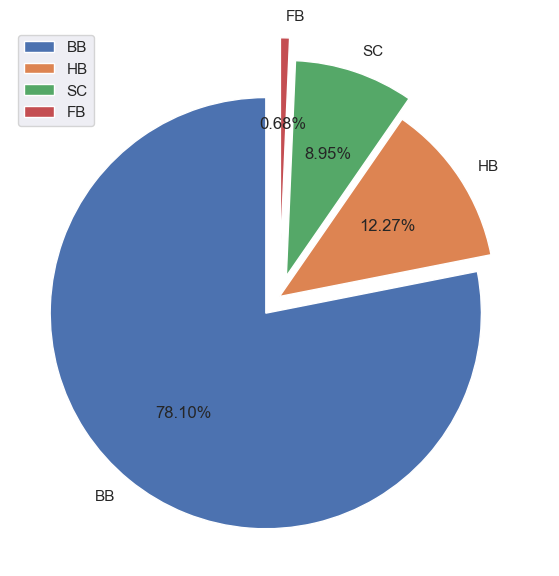

In [ ]:
# adults fav meal on a pie chart
meal = ["BB", "HB", "SC", "FB"]
values = [92020, 14454, 10546, 798]

plt.figure(figsize = (10, 7))
plt.pie(values, labels = meal, explode = (0.1, 0, 0.1, 0.2), autopct = "%.2f%%", startangle = 90)

plt.legend()

plt.show();

In [ ]:
# children fav and least fav meal
data.iloc[np.where((data["children"] > 0) & (data["meal"] != "Undefined"))]["meal"].agg(["value_counts"])

,value_counts
BB,6877
HB,1221
SC,149
FB,65


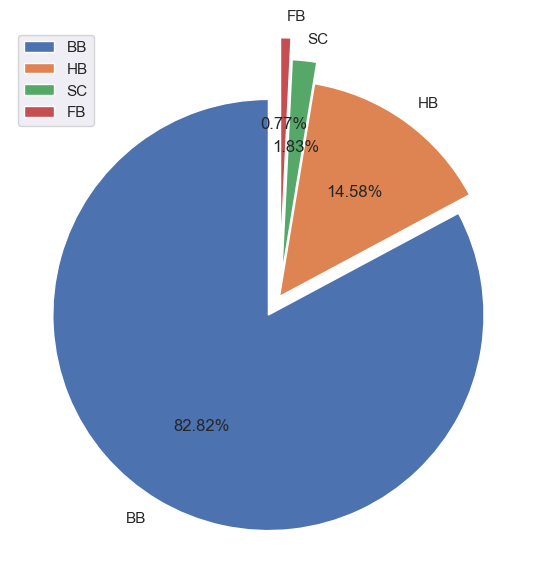

In [ ]:
# children fav and least fav meal on a pie chart
meal = ["BB", "HB", "SC", "FB"]
values = [7079, 1246, 156, 66]

plt.figure(figsize = (10, 7))
plt.pie(values, labels = meal, explode = (0.1, 0, 0.1, 0.2), autopct = "%.2f%%", startangle = 90)

plt.legend()

plt.show();

In [ ]:
# most busy year
data.arrival_date_year.agg(["value_counts"])

,value_counts
2016,42114
2017,31606
2015,13194


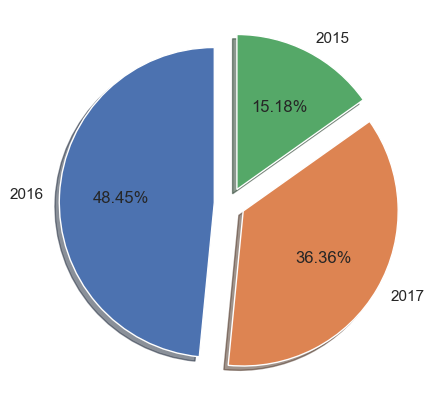

In [ ]:
# busiest year on a pie chart
year = [2016, 2017, 2015]
counts = data.arrival_date_year.value_counts()

plt.figure(figsize = (5, 7))
plt.pie(counts, explode = (0.1, 0.1, 0.1), labels = year, autopct = "%.2f%%", shadow = True, startangle = 90)

plt.show();

In [ ]:
# guests arrived year wise 
data.groupby(["hotel"])["arrival_date_year"].agg(["value_counts"])

value_counts
hotel        arrival_date_year              
City Hotel   2016                      26749
             2017                      20111
             2015                       6544
Resort Hotel 2016                      15365
             2017                      11495
             2015                       6650

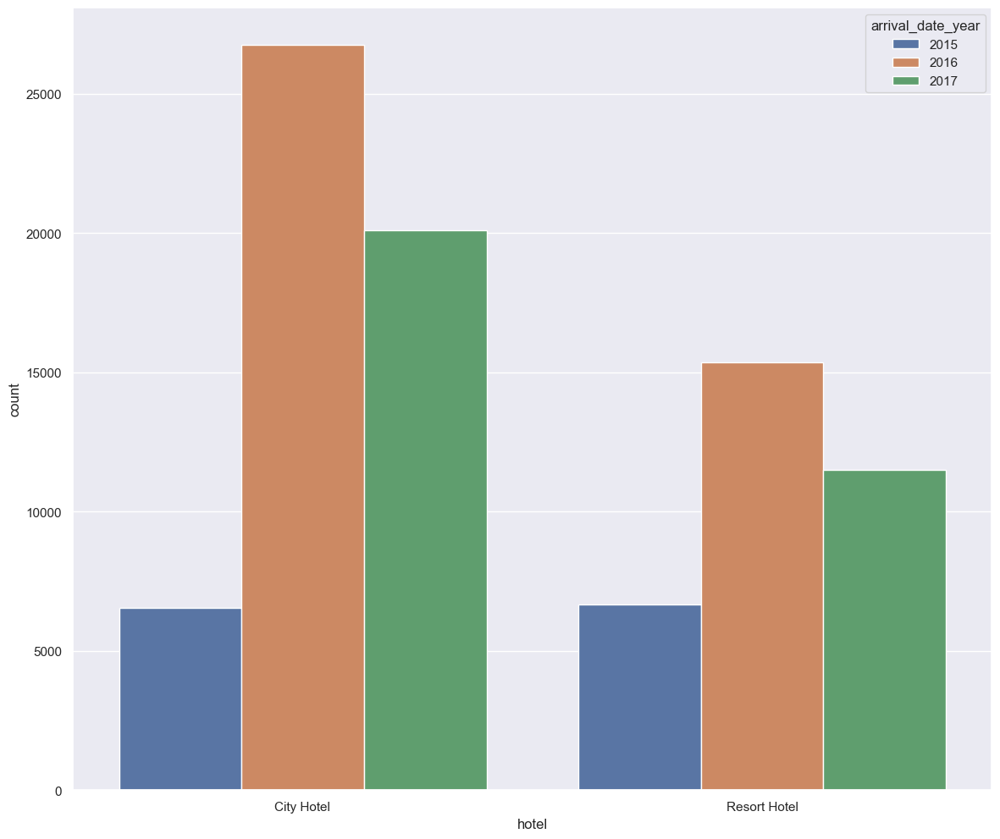

In [ ]:
# count of guests for each hotel type on a countplot
sns.countplot(x = "hotel", hue = "arrival_date_year", data = data, order = ["City Hotel", "Resort Hotel"]);

In [ ]:
# guests arrived month-wise per year
data.groupby(["hotel", "arrival_date_year"])["arrival_date_month"].agg(["value_counts"])

value_counts
hotel        arrival_date_year arrival_date_month              
City Hotel   2015              September                   1672
                               October                     1558
                               August                      1103
                               December                    1020
                               November                     796
                               July                         395
             2016              August                      2816
                               October                     2649
                               September                   2566
                               July                        2486
                               April                       2412
                               March                       2368
                               May                         2342
                               June                        2284
                               November                    2143
                               December                    1993
                               February                    1660
                               January                     1030
             2017              May                         3069
                               July                        2860
                               June                        2720
                               August                      2667
                               April                       2665
                               March                       2486
                               February                    1944
                               January                     1700
Resort Hotel 2015              August                      1332
                               July                        1266
                               September                   1147
                               October                     1118
                               December                     941
                               November                     846
             2016              August                      1598
                               October                     1558
                               March                       1428
                               May                         1425
                               July                        1343
                               April                       1333
                               September                   1272
                               June                        1220
                               November                    1165
                               December                    1126
                               February                    1112
                               January                      785
             2017              August                      1713
                               July                        1670
                               June                        1528
                               May                         1505
                               April                       1459
                               February                    1324
                               March                       1175
                               January                     1121

In [ ]:
# country most guests come from
data["country"].agg(["value_counts"])

,value_counts
PRT,27436
GBR,10431
FRA,8837
ESP,7250
DEU,5385
...,...
MMR,1
BFA,1
CYM,1
MLI,1


<AxesSubplot:>

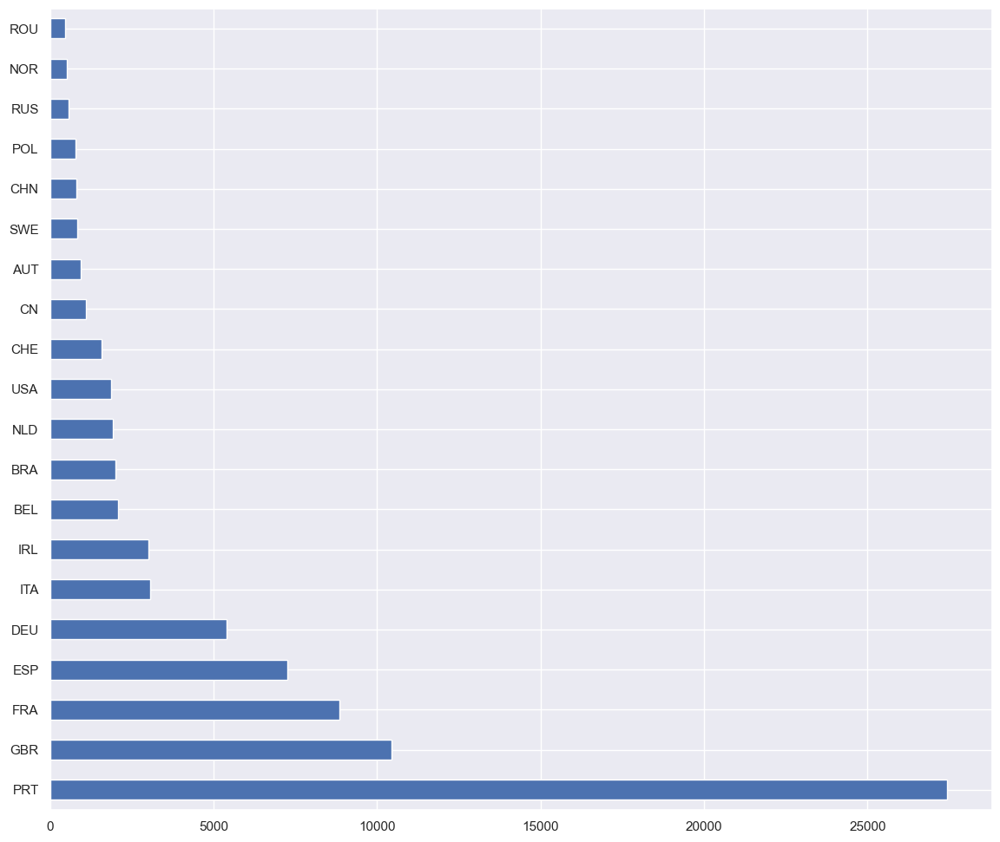

In [ ]:
# count on a bar graph
data['country'].value_counts()[:20].plot(kind='barh')

In [ ]:
# from where most bookings were made
data.groupby(["hotel"])["market_segment"].agg(["value_counts"])

value_counts
hotel        market_segment              
City Hotel   Online TA              34985
             Offline TA/TO           7266
             Direct                  5557
             Groups                  2634
             Corporate               2224
             Complementary            511
             Aviation                 227
Resort Hotel Online TA              16549
             Offline TA/TO           6583
             Direct                  6088
             Groups                  2302
             Corporate               1801
             Complementary            187

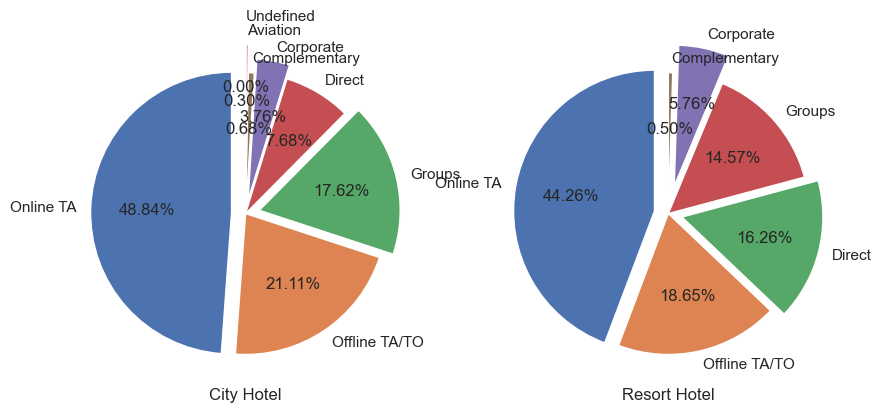

In [ ]:
# most bookings made (method) for each hotel type on a pie chart
city = ["Online TA", "Offline TA/TO", "Groups", "Direct", "Corporate", "Complementary", "Aviation", "Undefined"]
count1 = [38748, 16747, 13975, 6093, 2986, 542, 237, 2]
resort = ["Online TA", "Offline TA/TO", "Direct", "Groups",  "Corporate", "Complementary"]
count2 = [17729, 7472, 6513, 5836, 2309, 201]

plt.figure(figsize = (10, 15))
plt.subplot(1, 2, 1)  
plt.pie(count1, labels = city, explode = (0.1, 0, 0.1, 0, 0.1, 0, 0.2, 0.3), autopct = "%.2f%%", startangle = 90)
plt.title("City Hotel", y = -0.05)

plt.subplot(1, 2, 2)  
plt.pie(count2, labels = resort, explode = (0.1, 0, 0.1, 0, 0.2, 0), autopct = "%.2f%%", startangle = 90)
plt.title("Resort Hotel", y = -0.05)

plt.show();

In [ ]:
# distribution channel most preferred
data.groupby(["hotel"])["distribution_channel"].agg(["value_counts"])

value_counts
hotel        distribution_channel              
City Hotel   TA/TO                        44535
             Direct                        6085
             Corporate                     2603
             GDS                            181
Resort Hotel TA/TO                        24475
             Direct                        6740
             Corporate                     2294
             Undefined                        1

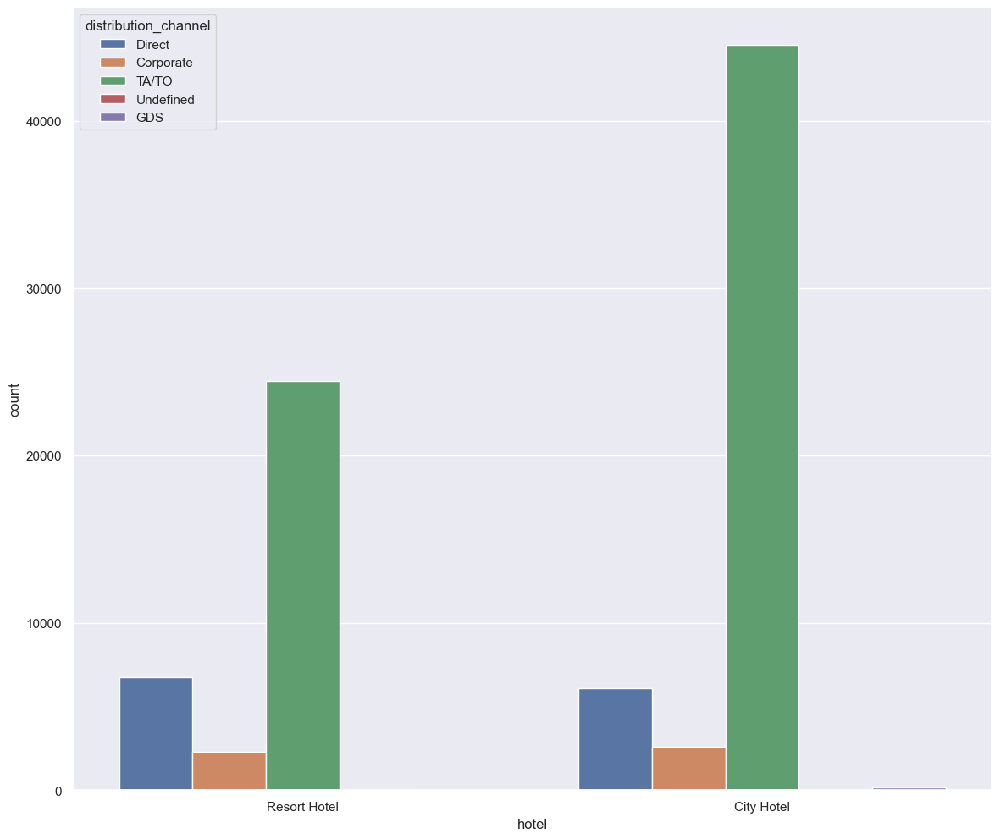

In [ ]:
# most preferred distribution channel on a countplot
sns.countplot(x = "hotel", hue = "distribution_channel", data = data);

In [ ]:
# which room types mostly reserved
data.groupby(["hotel"])["reserved_room_type"].agg(["value_counts"])

value_counts
hotel        reserved_room_type              
City Hotel   A                          37926
             D                          10766
             F                           1757
             E                           1469
             B                            992
             G                            479
             C                             14
             P                              1
Resort Hotel A                          18240
             D                           6604
             E                           4540
             G                           1562
             F                           1059
             C                            900
             H                            596
             L                              6
             B                              3

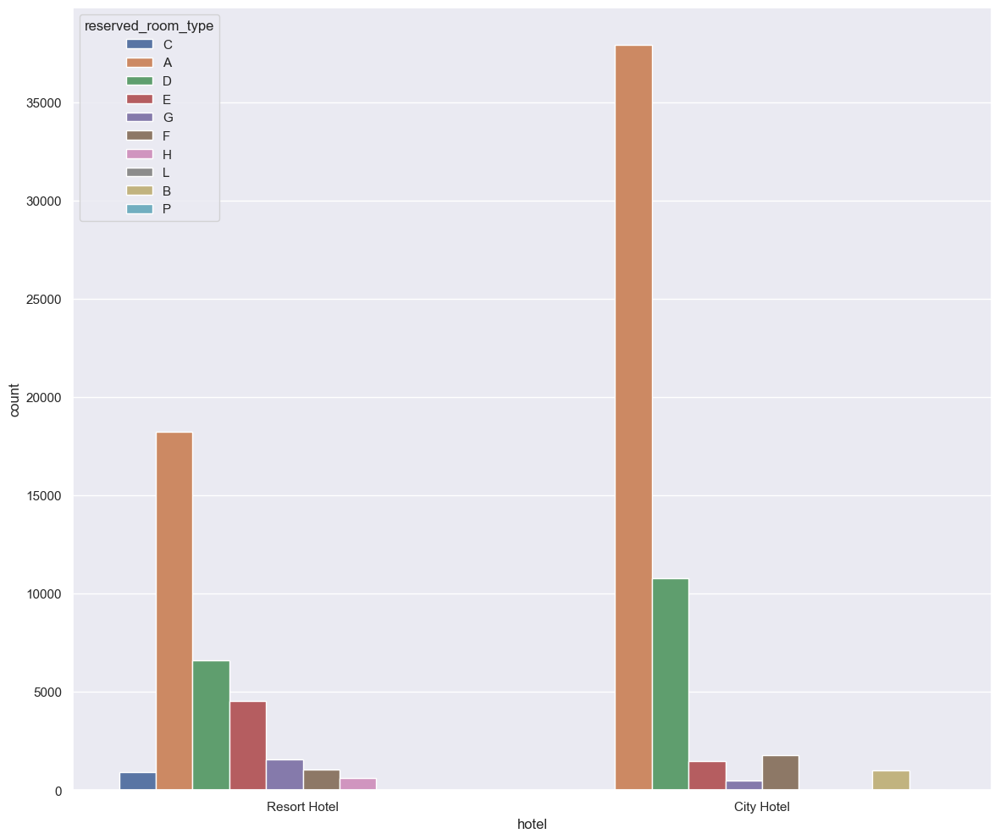

In [ ]:
# which room types mostly reserved on a countplot
sns.countplot(x = "hotel", hue = "reserved_room_type", data = data);

In [ ]:
# requirement of parking spaces
data.groupby(["hotel"])["required_car_parking_spaces"].agg(["value_counts"])

value_counts
hotel        required_car_parking_spaces              
City Hotel   0                                   51508
             1                                    1891
             2                                       3
             3                                       2
Resort Hotel 0                                   28199
             1                                    5283
             2                                      25
             8                                       2
             3                                       1

In [ ]:
# guestes visited hotel more than once
data.groupby(["hotel"])["is_repeated_guest"].agg(["value_counts"])

value_counts
hotel        is_repeated_guest              
City Hotel   0                         51696
             1                          1708
Resort Hotel 0                         31807
             1                          1703

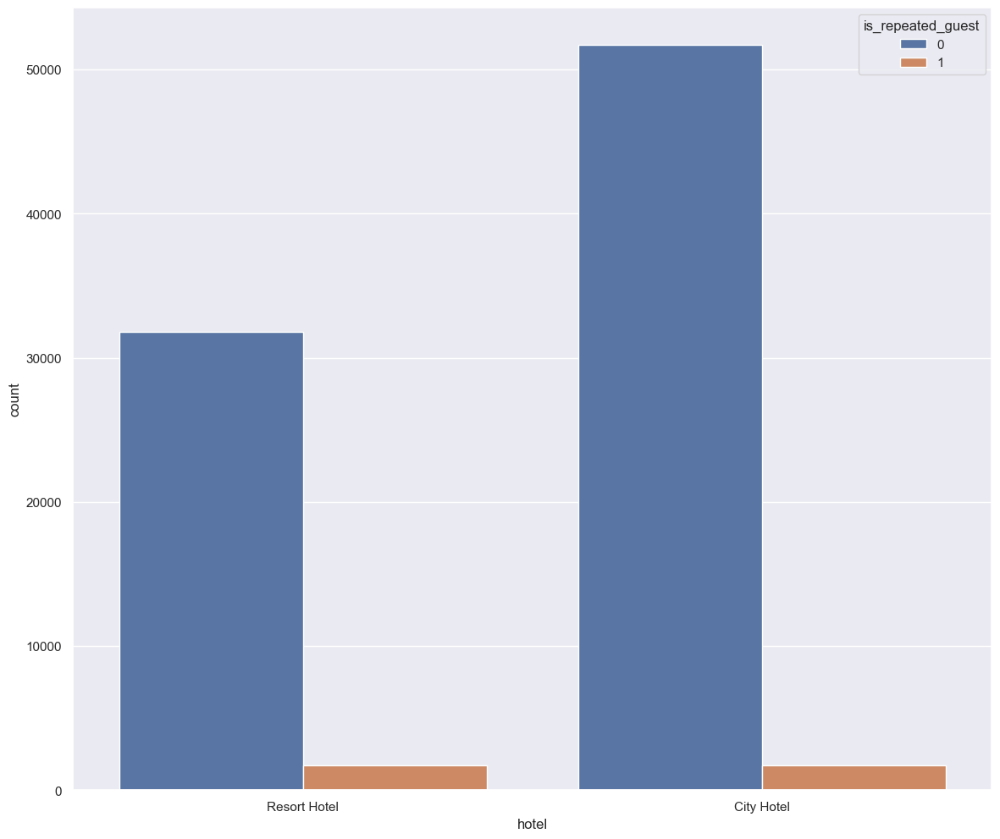

In [ ]:
# guestes visited hotel more than once on a countplot
sns.countplot(x = "hotel", hue = "is_repeated_guest", data = data);

In [ ]:
# reservation status per year in each hotel
data.groupby(["hotel", "arrival_date_year"])["reservation_status"].agg(["value_counts"])

value_counts
hotel        arrival_date_year reservation_status              
City Hotel   2015              Check-Out                   5128
                               Canceled                    1312
                               No-Show                      104
             2016              Check-Out                  18963
                               Canceled                    7323
                               No-Show                      463
             2017              Check-Out                  13274
                               Canceled                    6656
                               No-Show                      181
Resort Hotel 2015              Check-Out                   5377
                               Canceled                    1225
                               No-Show                       48
             2016              Check-Out                  11965
                               Canceled                    3294
                               No-Show                      106
             2017              Check-Out                   8224
                               Canceled                    3163
                               No-Show                      108

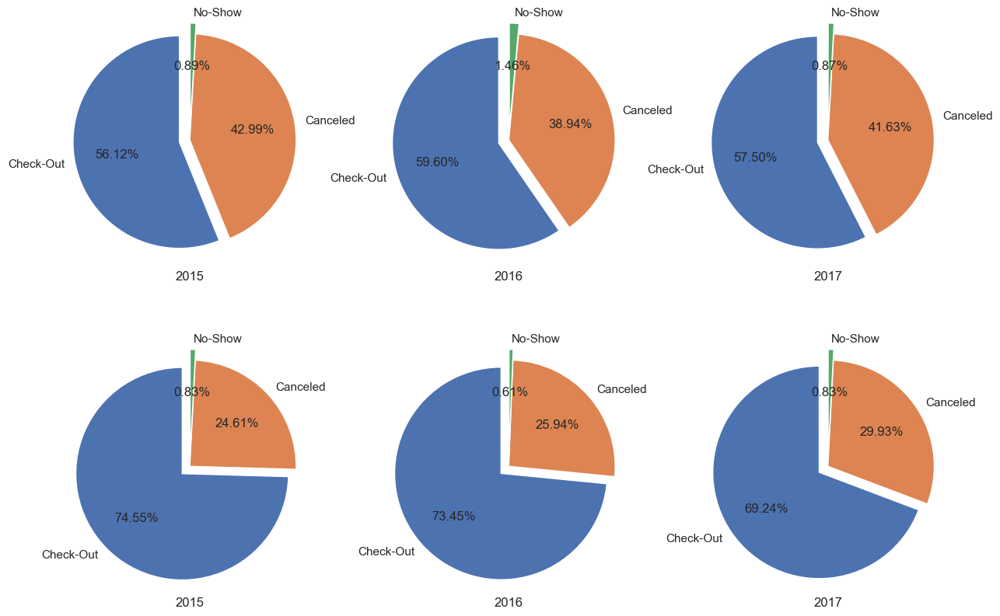

In [ ]:
# reservation status per year in each hotel on a pie chart
status = ["Check-Out", "Canceled", "No-Show"]
count1 = [7678, 5882, 122]
count2 = [22733, 14852, 555]
count3 = [15817, 11452, 239]
count4 = [6176, 2039, 69]
count5 = [13637, 4817, 113]
count6 = [9125, 3945, 109]

plt.figure(figsize = (15, 10))
plt.subplot(2, 3, 1)  
plt.pie(count1, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2015", y = -0.05)

plt.subplot(2, 3, 2)  
plt.pie(count2, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2016", y = -0.05)

plt.subplot(2, 3, 3)  
plt.pie(count3, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2017", y = -0.05)

plt.subplot(2, 3, 4)  
plt.pie(count4, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2015", y = -0.05)

plt.subplot(2, 3, 5)  
plt.pie(count5, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2016", y = -0.05)

plt.subplot(2, 3, 6)  
plt.pie(count6, labels = status, explode = (0.1, 0, 0.1), autopct = "%.2f%%", startangle = 90)
plt.title("2017", y = -0.05)

plt.show();

In [ ]:
# deposit type hotel wise
data.groupby(["hotel"])["deposit_type"].agg(["value_counts"])

value_counts
hotel        deposit_type              
City Hotel   No Deposit           52545
             Non Refund             844
             Refundable              15
Resort Hotel No Deposit           33225
             Non Refund             193
             Refundable              92

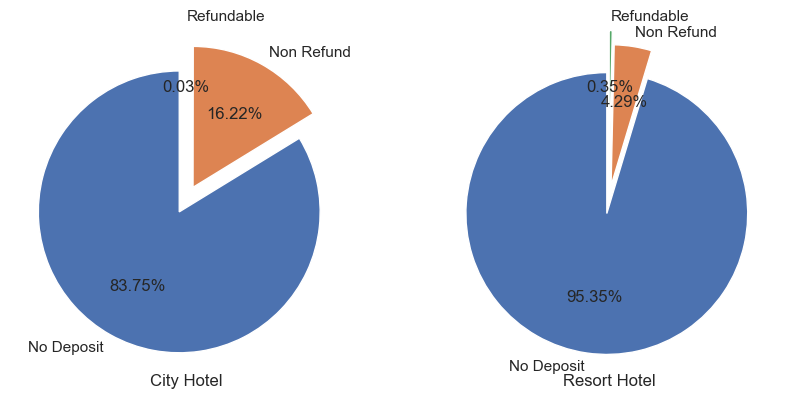

In [ ]:
# deposit type hotel wise on a pie chart
deposit = ["No Deposit", "Non Refund", "Refundable"]
count1 = [66442, 12868, 20]
count2 = [38199, 1719, 142]

plt.figure(figsize = (10, 15))
plt.subplot(1, 2, 1)  
plt.pie(count1, labels = deposit, explode = (0.1, 0.1, 0.2), autopct = "%.2f%%", startangle = 90)
plt.title("City Hotel", y = -0.05)

plt.subplot(1, 2, 2)  
plt.pie(count2, labels = deposit, explode = (0.1, 0.1, 0.2), autopct = "%.2f%%", startangle = 90)
plt.title("Resort Hotel", y = -0.05)

plt.show();

In [ ]:
data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000,86914.000000
mean,0.275939,80.202741,2016.211842,26.841694,15.818453,1.007548,2.628955,1.878604,0.139253,0.010815,0.039246,0.030237,0.176761,0.271912,0.753722,106.580816,0.083473,0.699542
std,0.446989,86.102902,0.685989,13.654113,8.834539,1.028821,2.043860,0.625881,0.456848,0.113510,0.194180,0.369629,1.718139,0.728177,10.043309,54.959600,0.280440,0.831880
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,12.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,72.250000,0.000000,0.000000
50%,0.000000,50.000000,2016.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,98.410000,0.000000,0.000000
75%,1.000000,125.000000,2017.000000,37.000000,23.000000,2.000000,4.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,134.100000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,16.000000,41.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,391.000000,5400.000000,8.000000,5.000000


## What are the likely distributions of the numeric variables?
## What are the distributions of the predictor variables?  

        lead_time  arrival_date_year  arrival_date_week_number  \
0             342               2015                        27   
1             737               2015                        27   
2               7               2015                        27   
3              13               2015                        27   
4              14               2015                        27   
...           ...                ...                       ...   
119385         23               2017                        35   
119386        102               2017                        35   
119387         34               2017                        35   
119388        109               2017                        35   
119389        205               2017                        35   

        arrival_date_day_of_month  stays_in_weekend_nights  \
0                               1                        0   
1                               1                        0   
2                    

<Figure size 800x500 with 0 Axes>

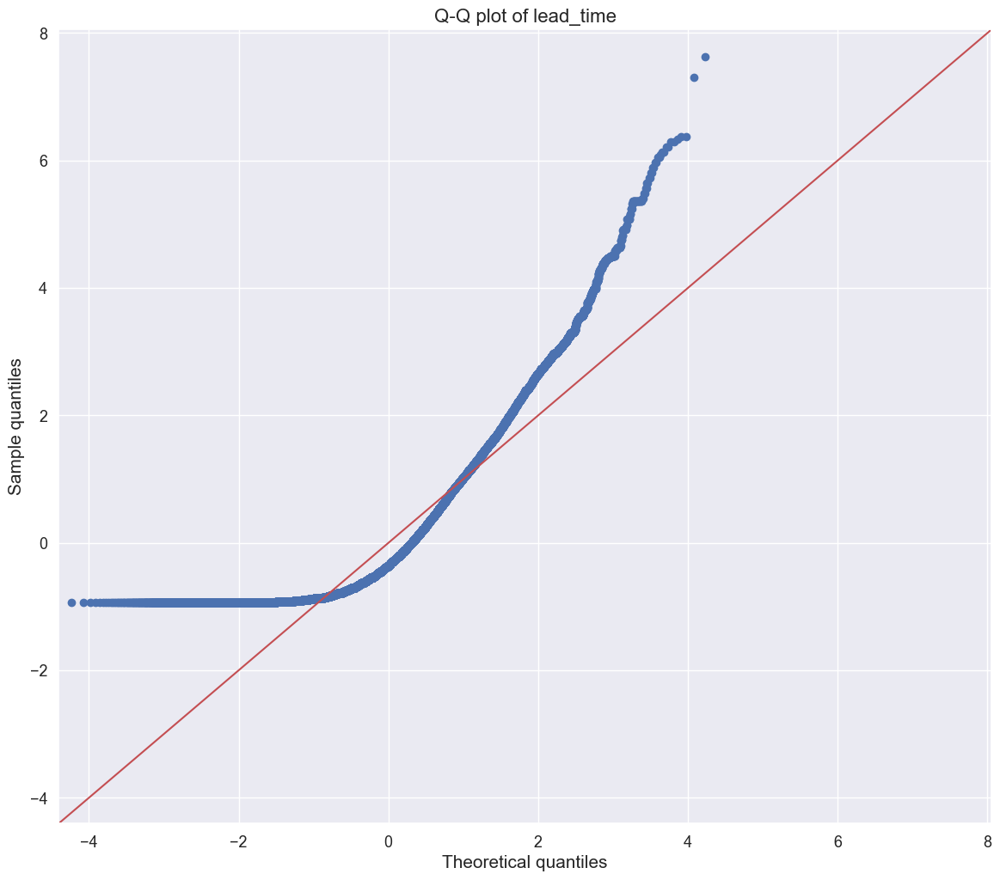

<Figure size 800x500 with 0 Axes>

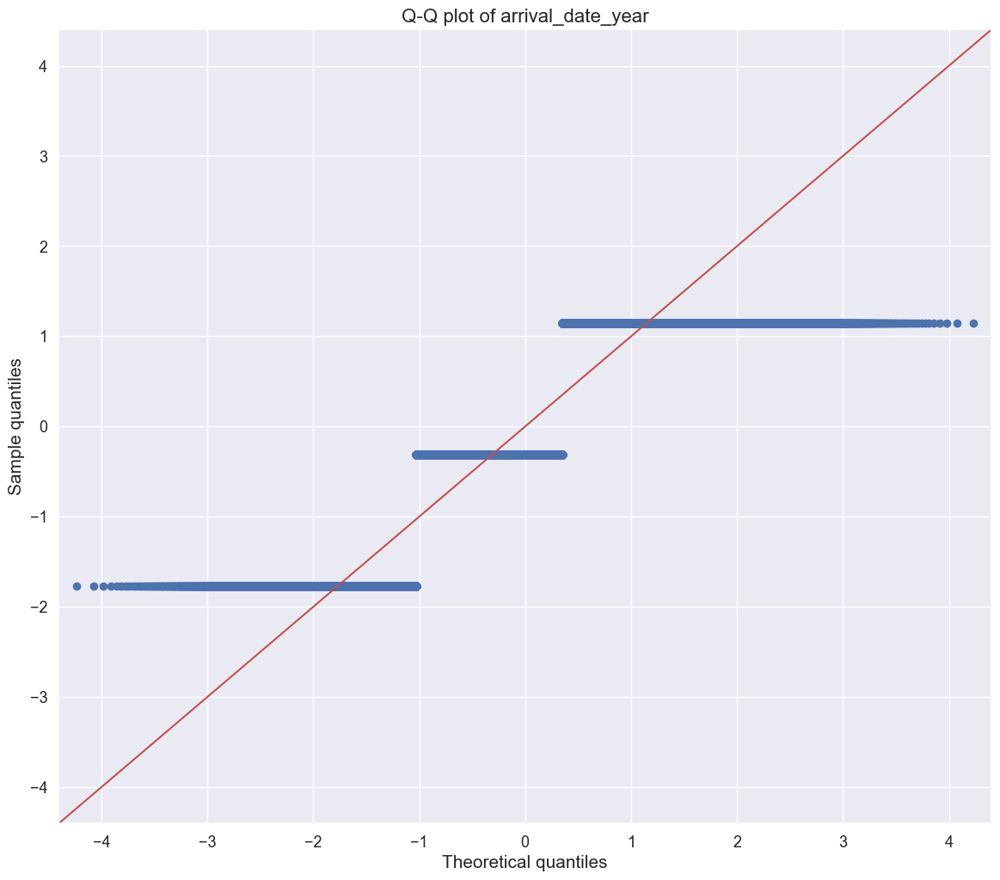

<Figure size 800x500 with 0 Axes>

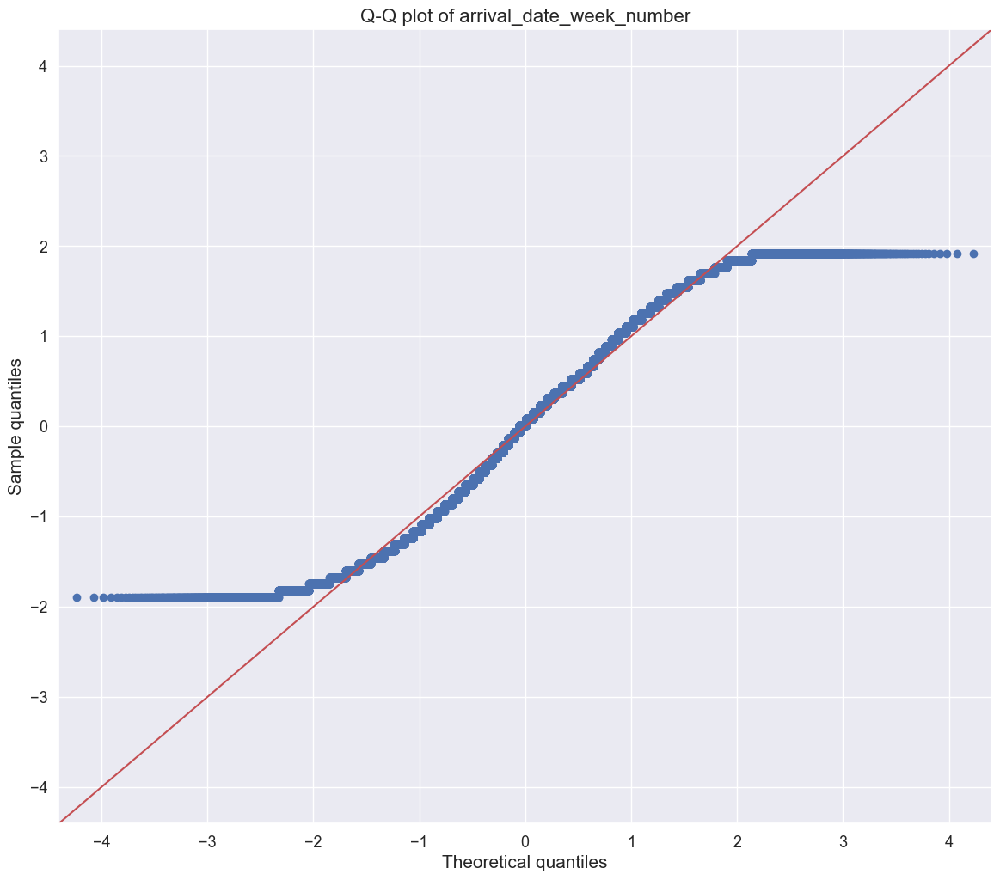

<Figure size 800x500 with 0 Axes>

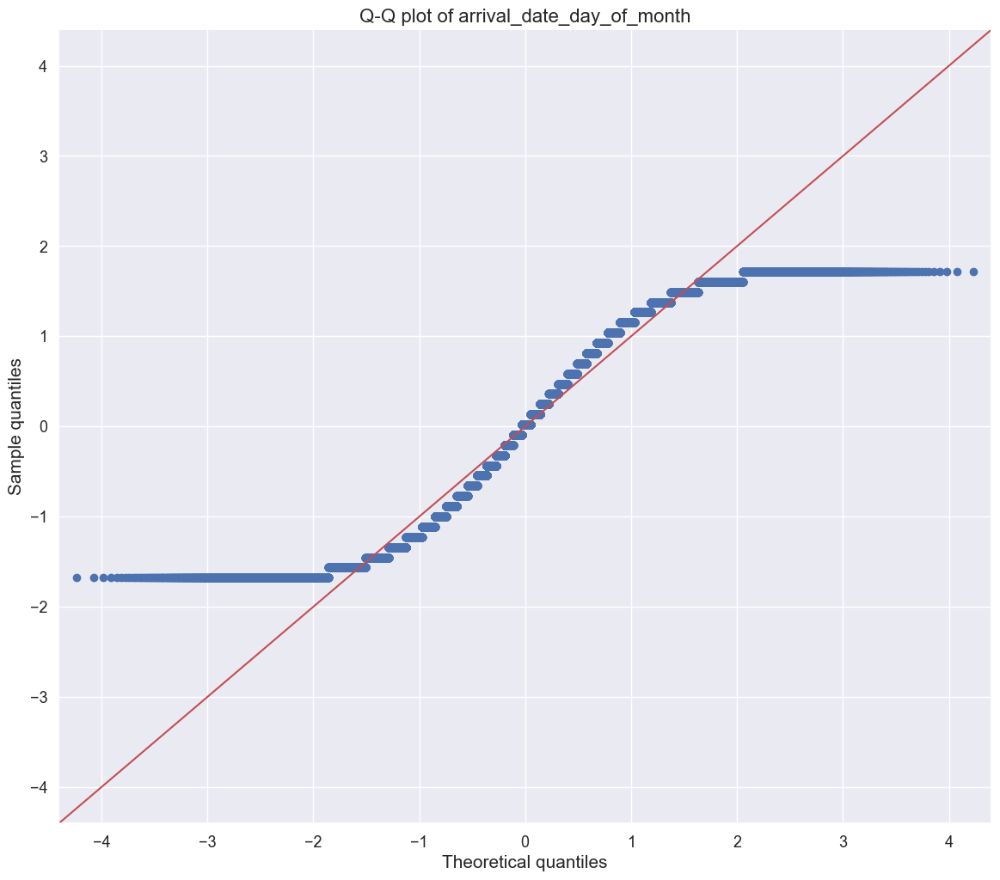

<Figure size 800x500 with 0 Axes>

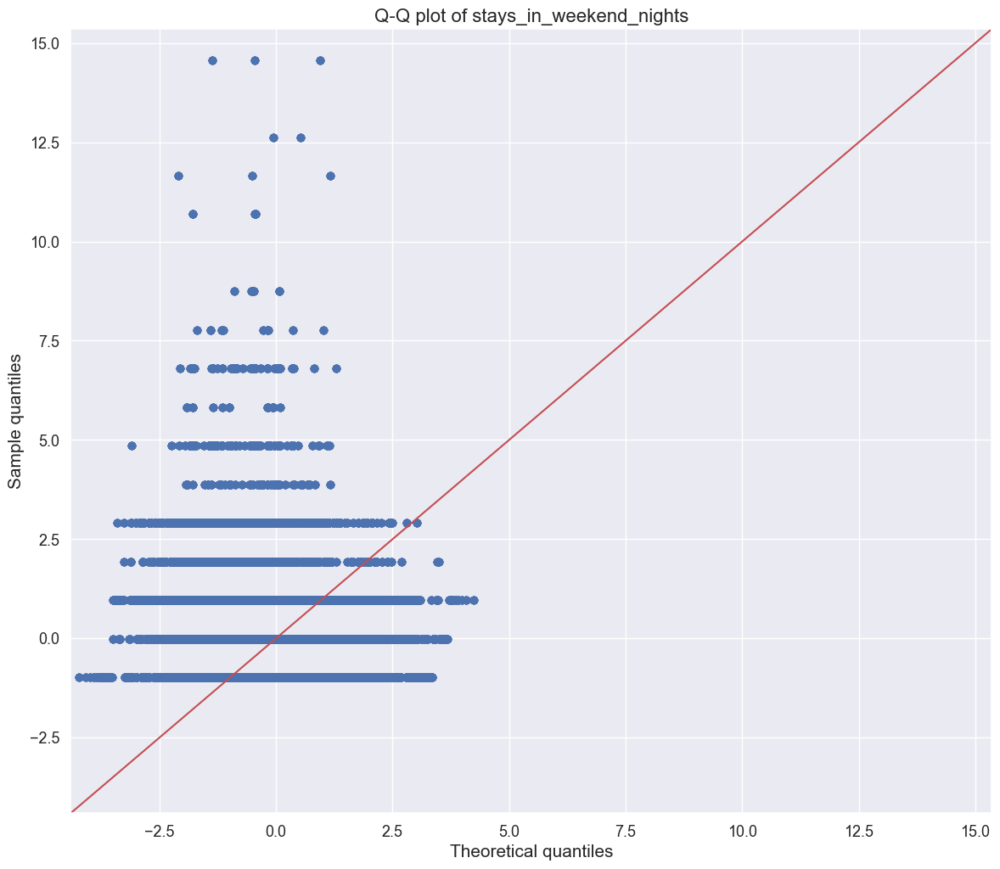

<Figure size 800x500 with 0 Axes>

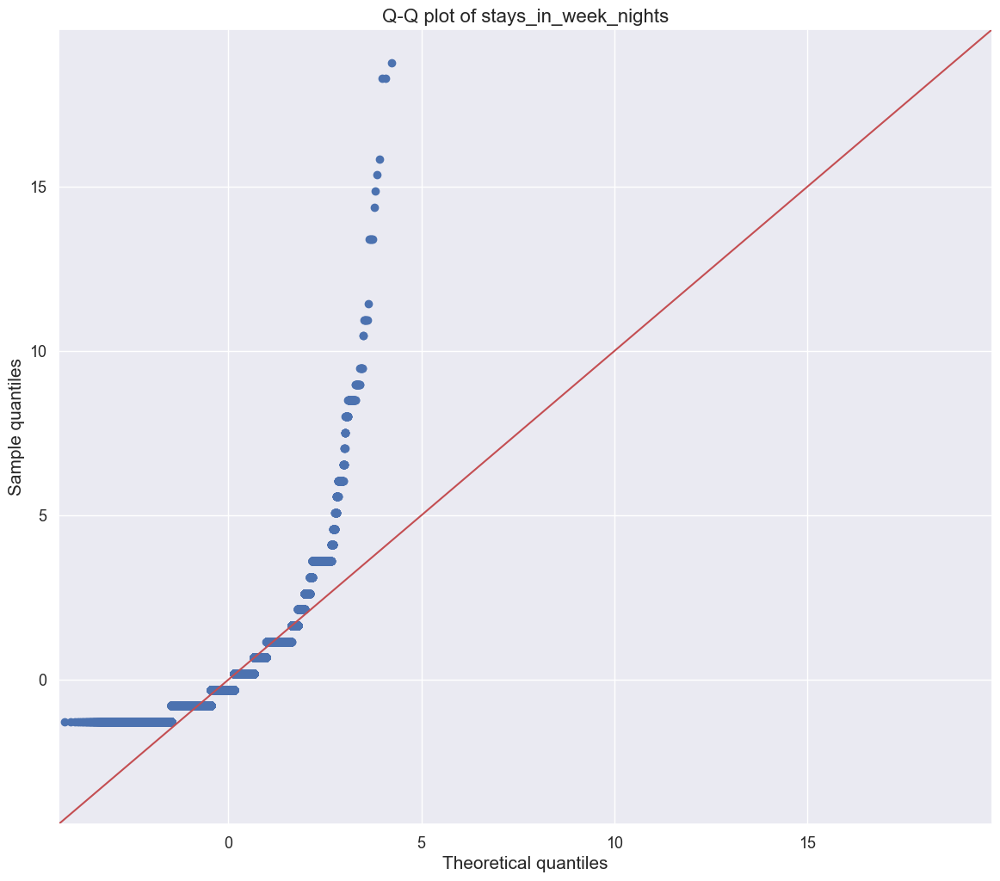

<Figure size 800x500 with 0 Axes>

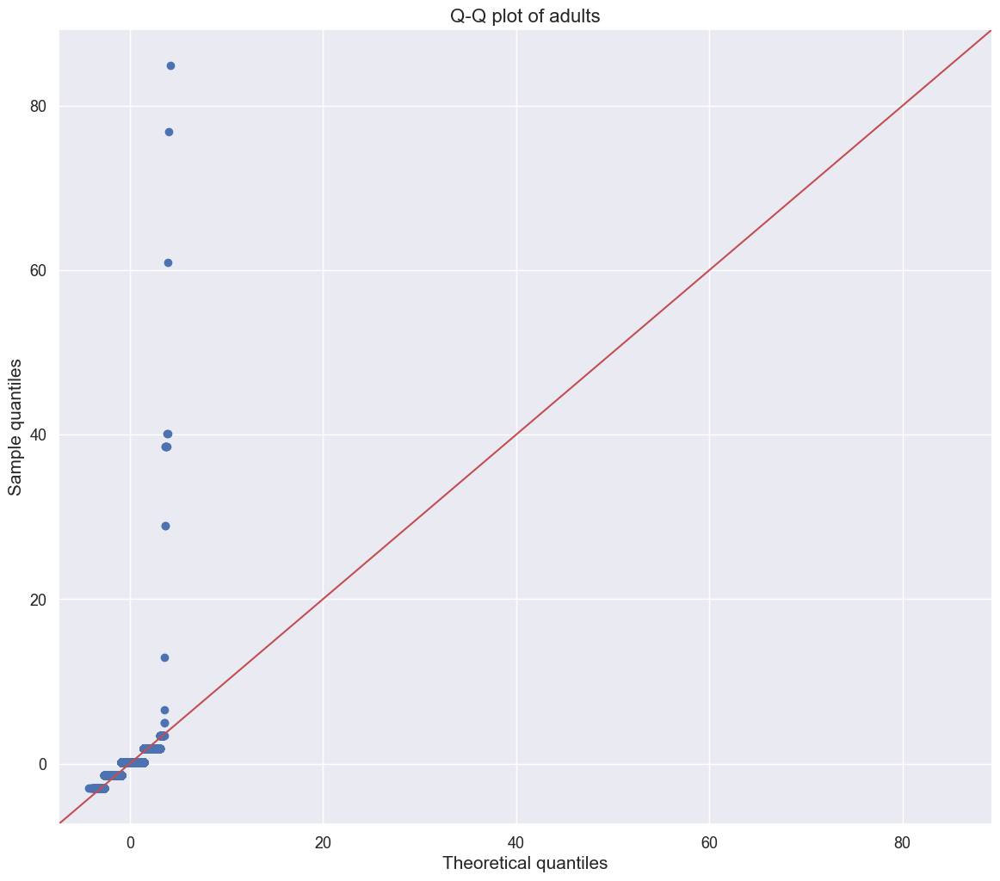

<Figure size 800x500 with 0 Axes>

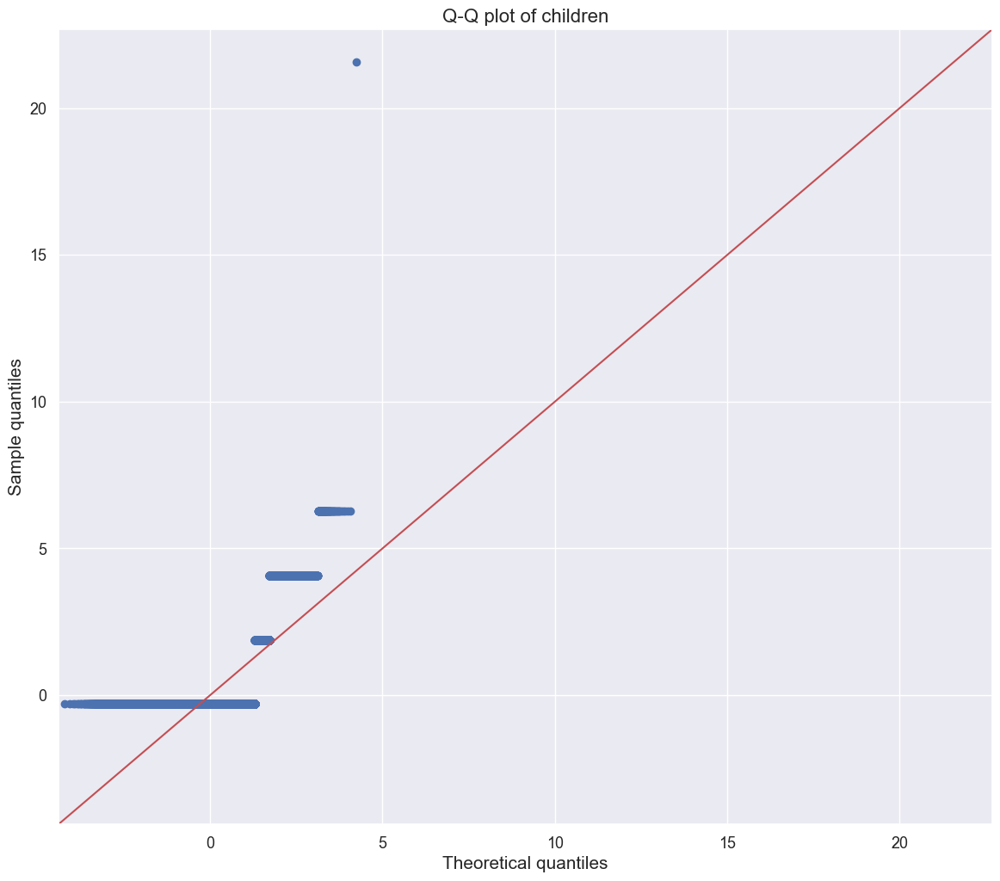

<Figure size 800x500 with 0 Axes>

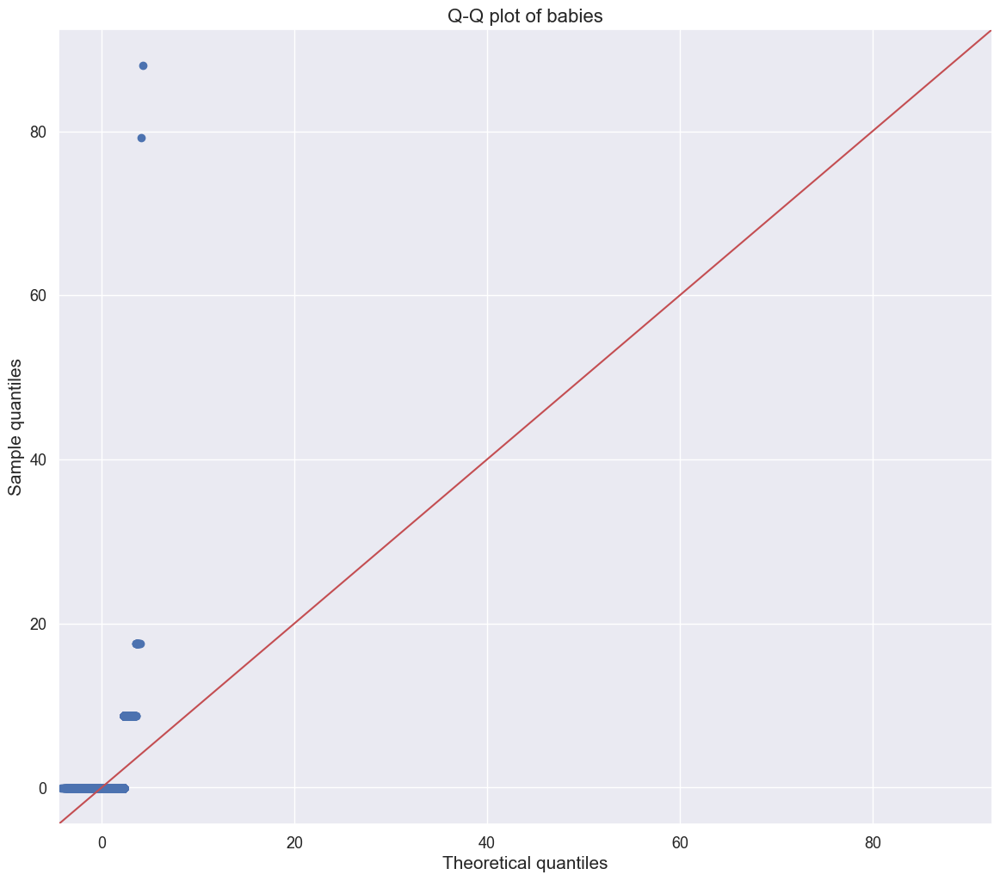

<Figure size 800x500 with 0 Axes>

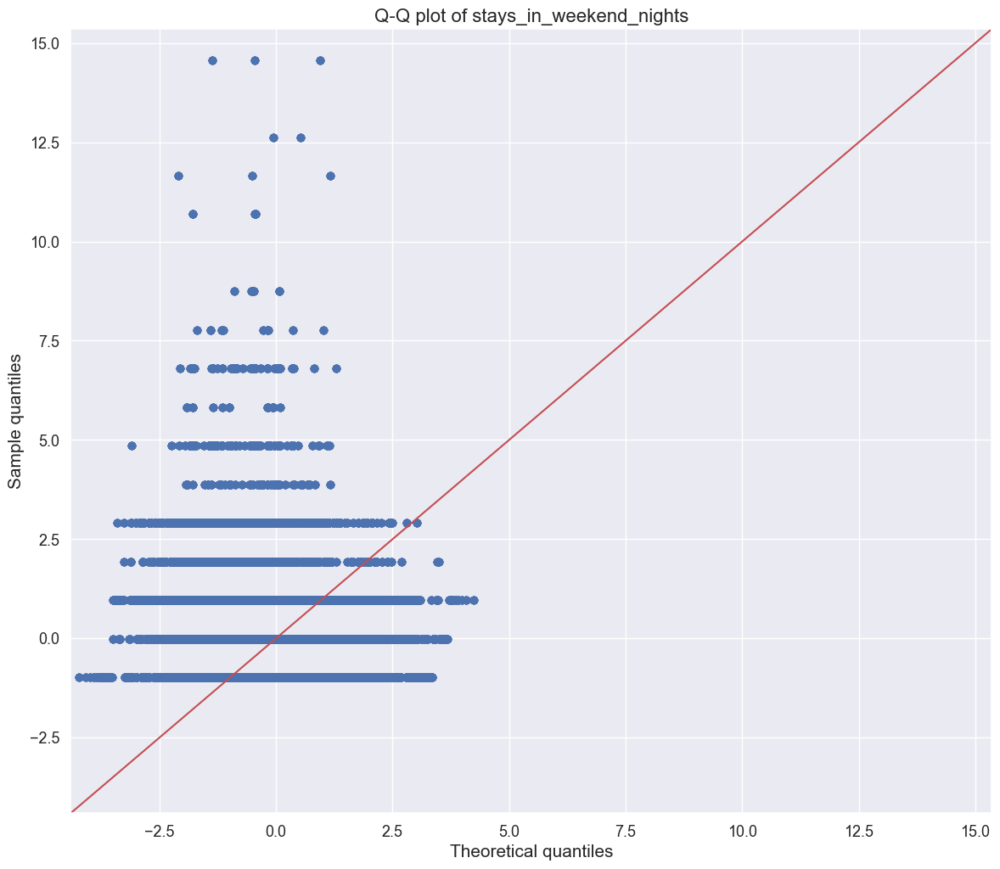

<Figure size 800x500 with 0 Axes>

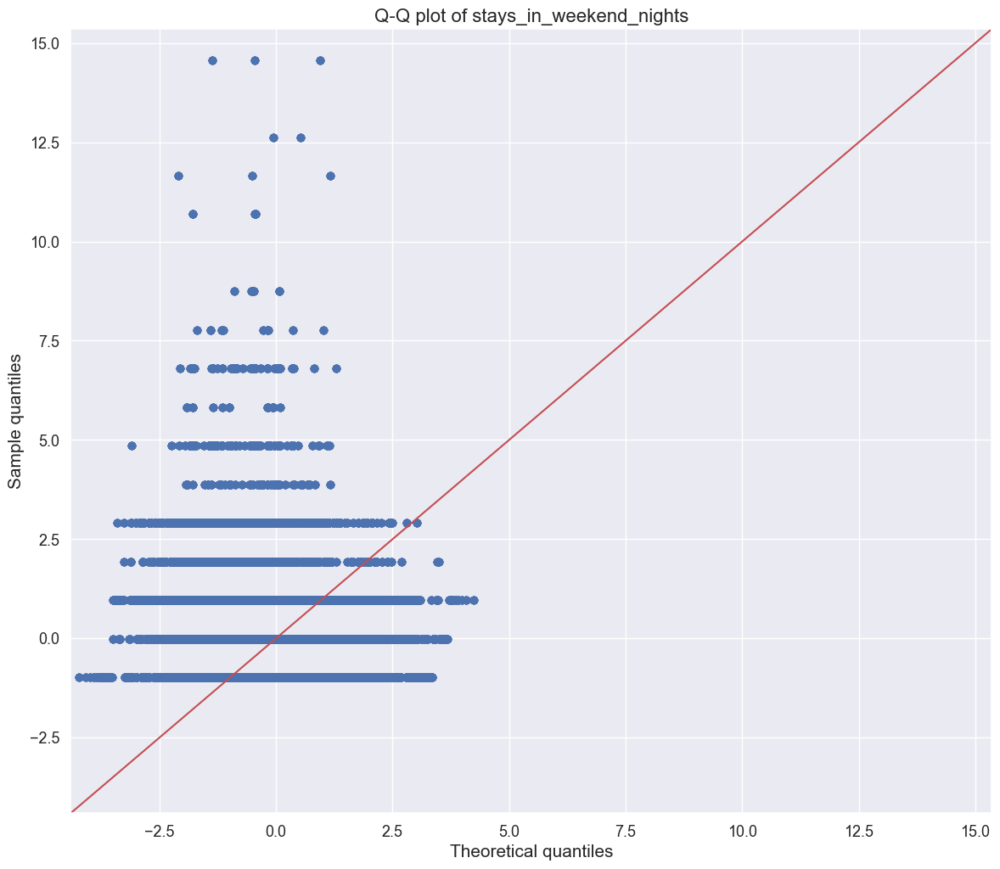

<Figure size 800x500 with 0 Axes>

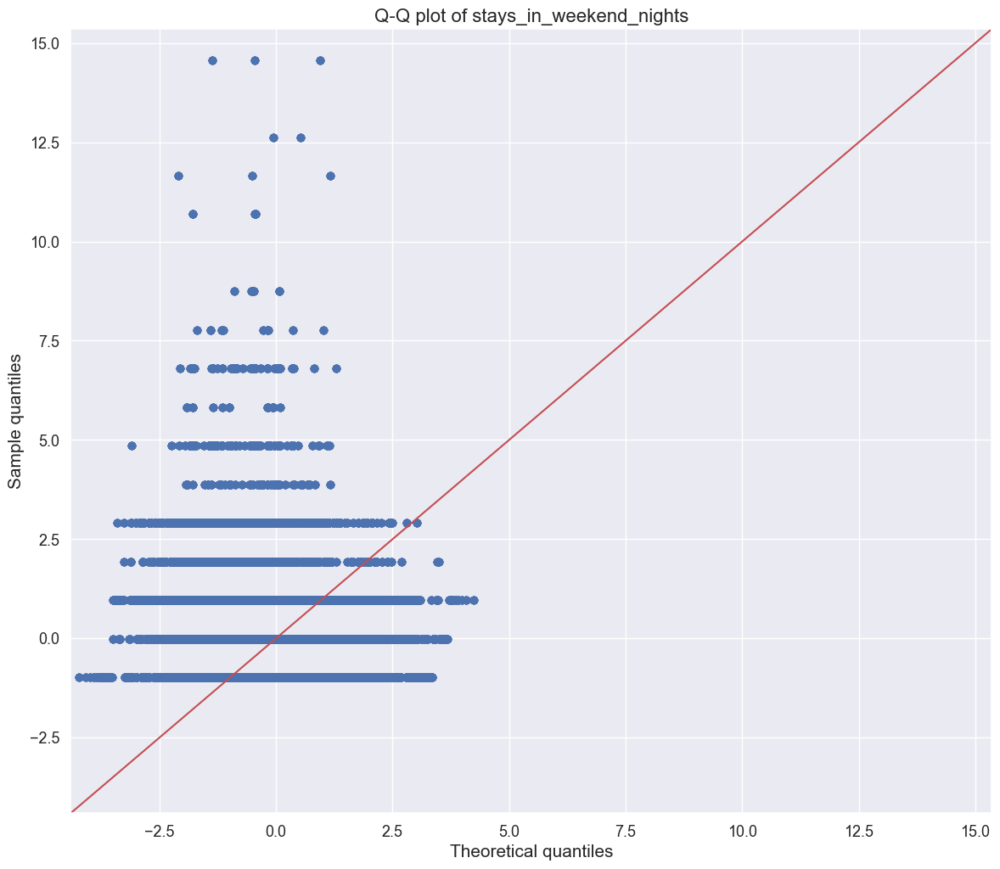

<Figure size 800x500 with 0 Axes>

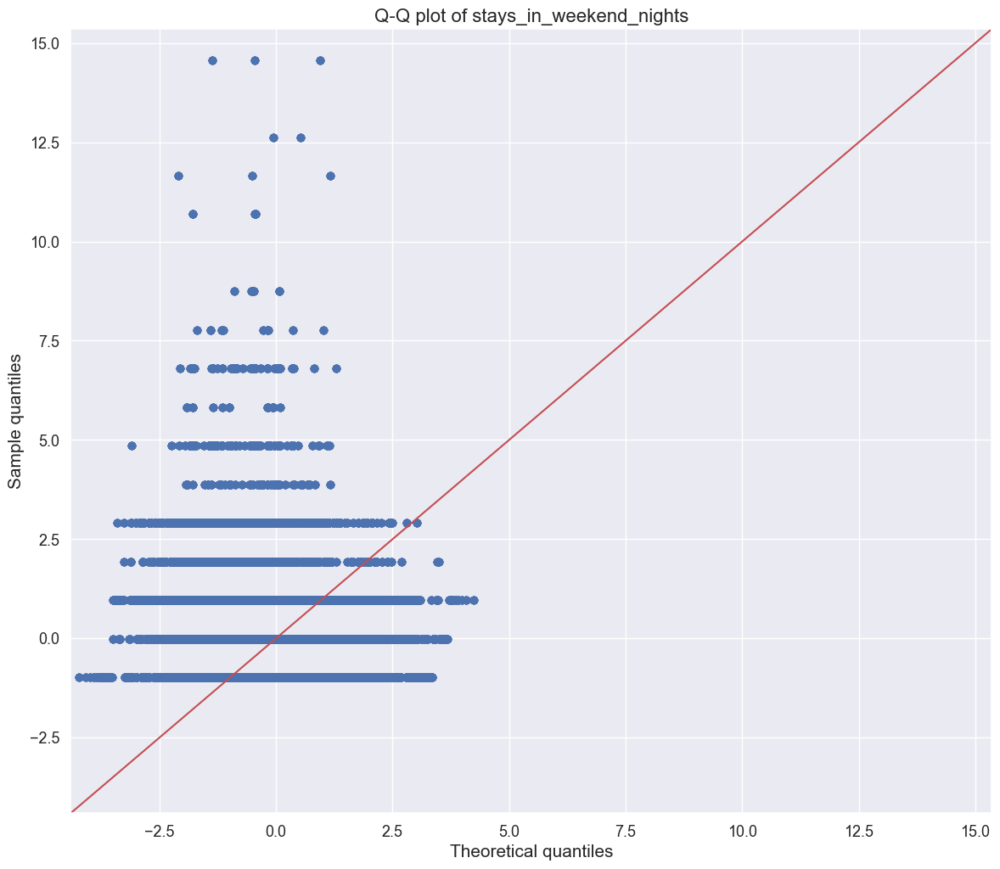

<Figure size 800x500 with 0 Axes>

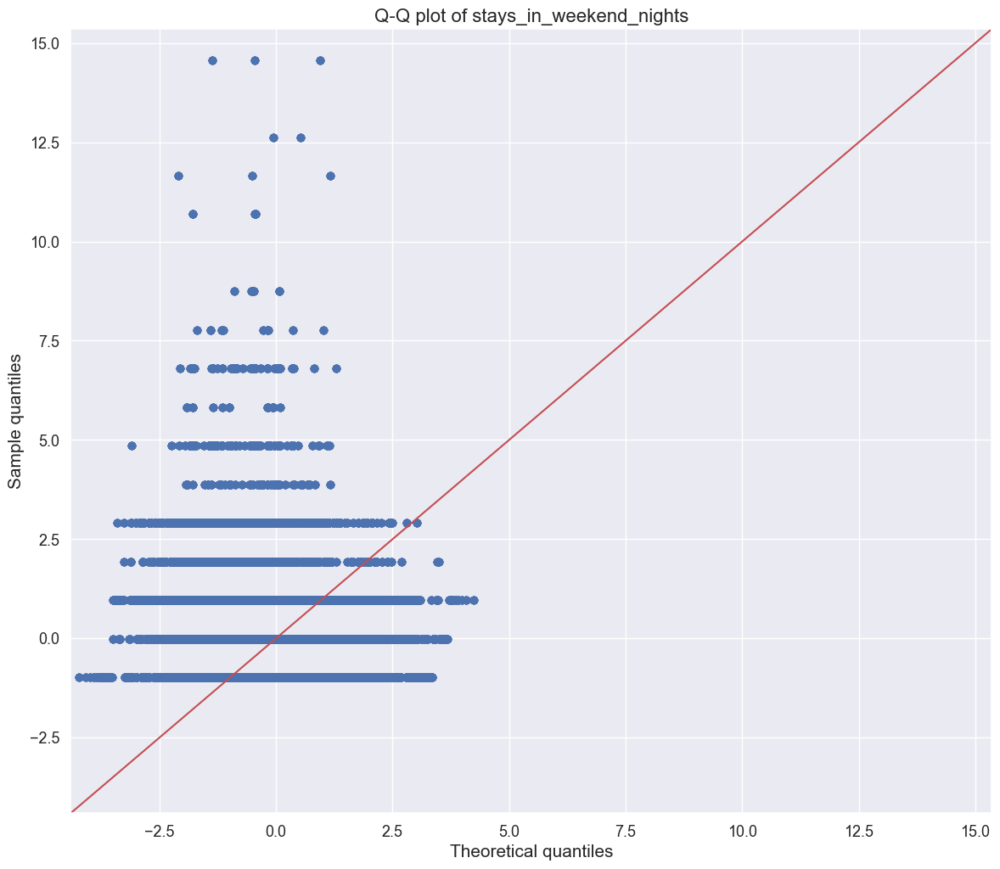

<Figure size 800x500 with 0 Axes>

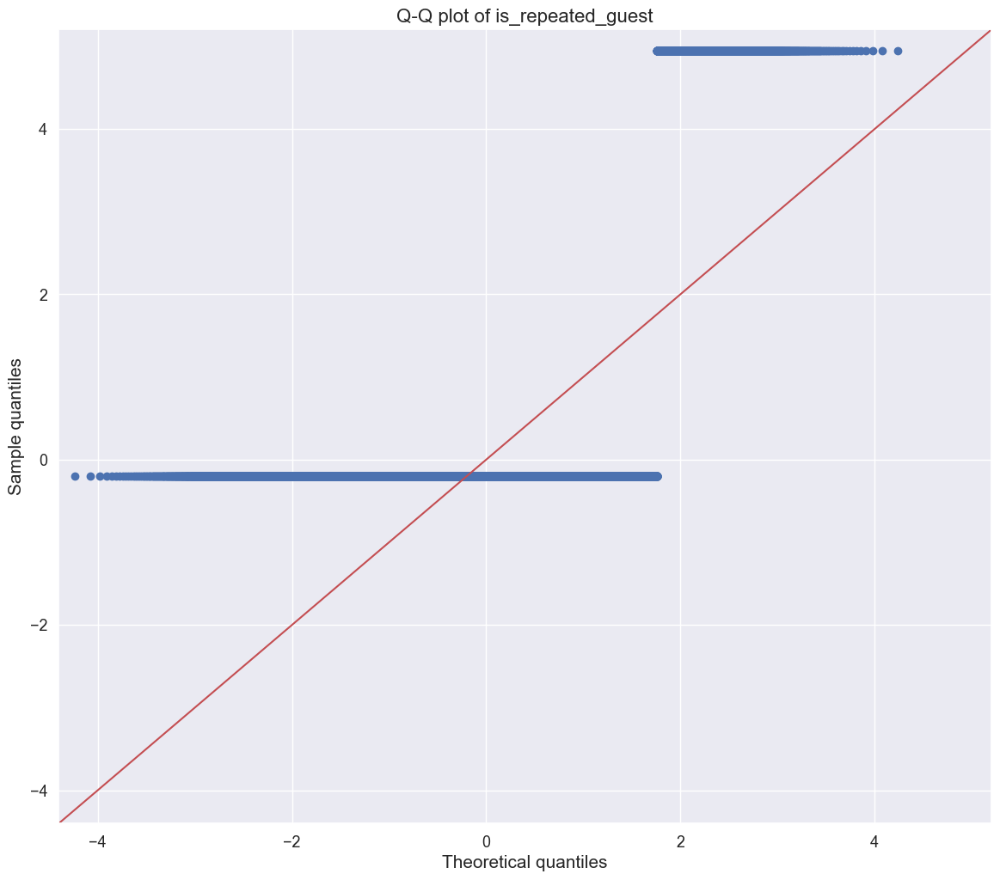

<Figure size 800x500 with 0 Axes>

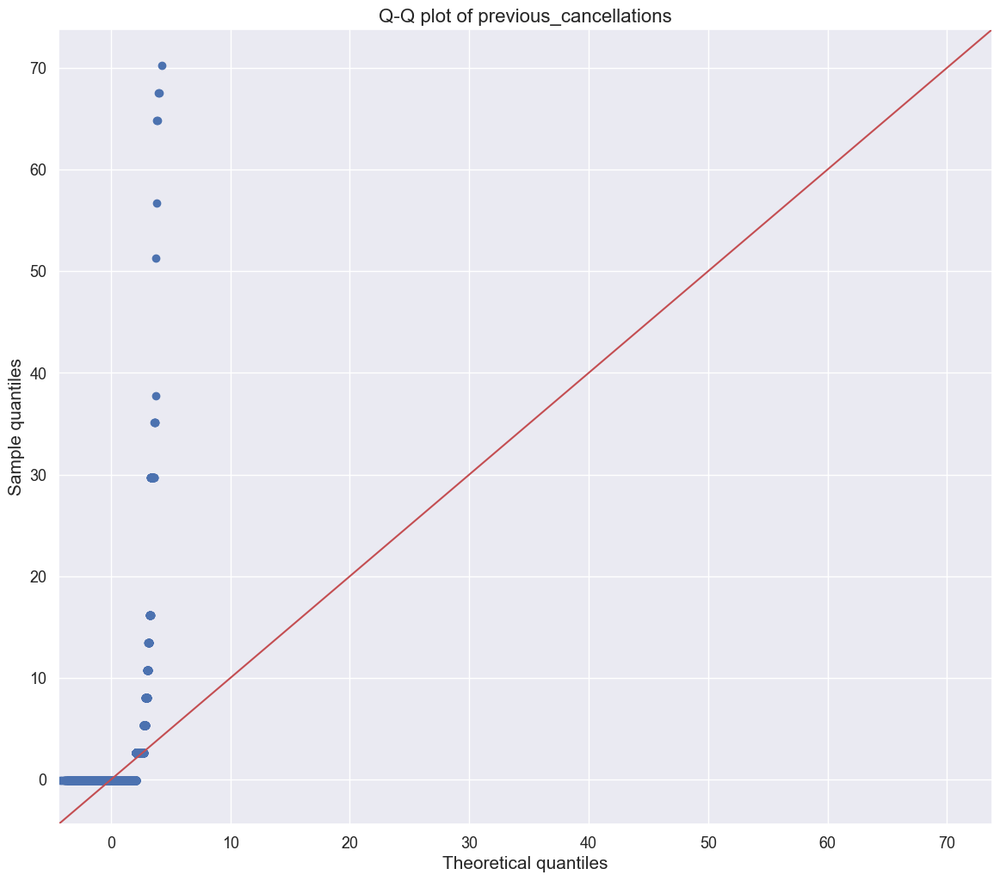

<Figure size 800x500 with 0 Axes>

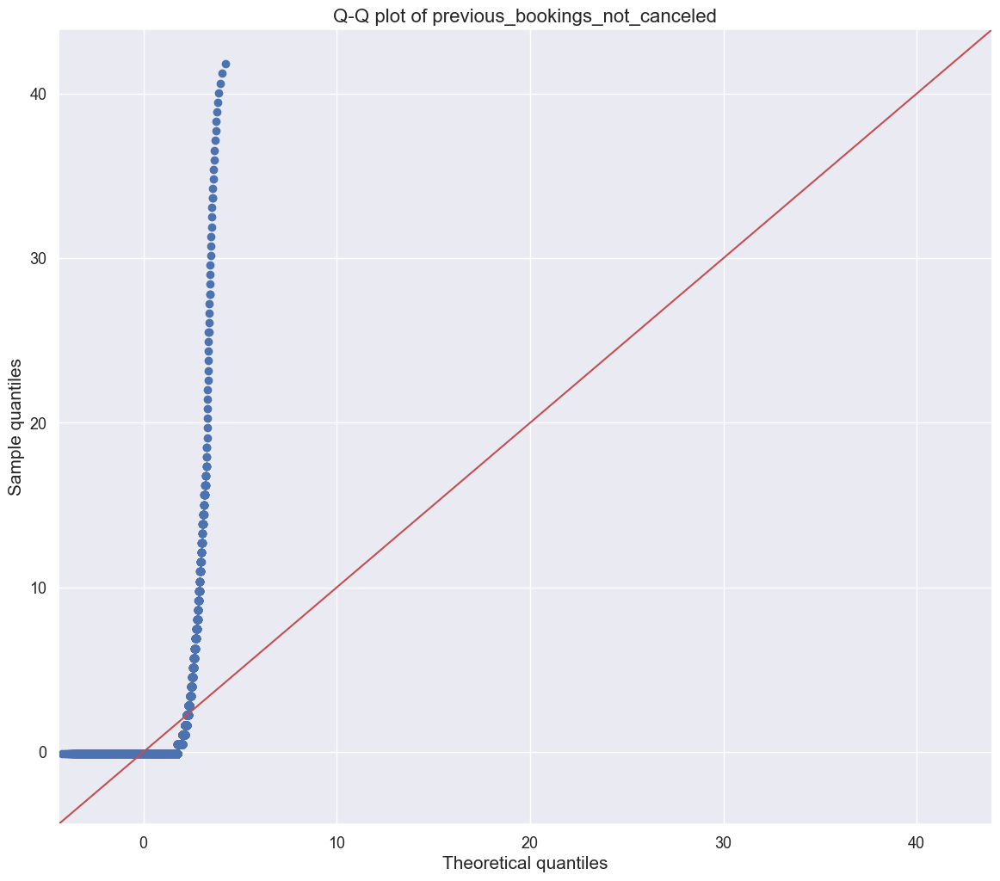

<Figure size 800x500 with 0 Axes>

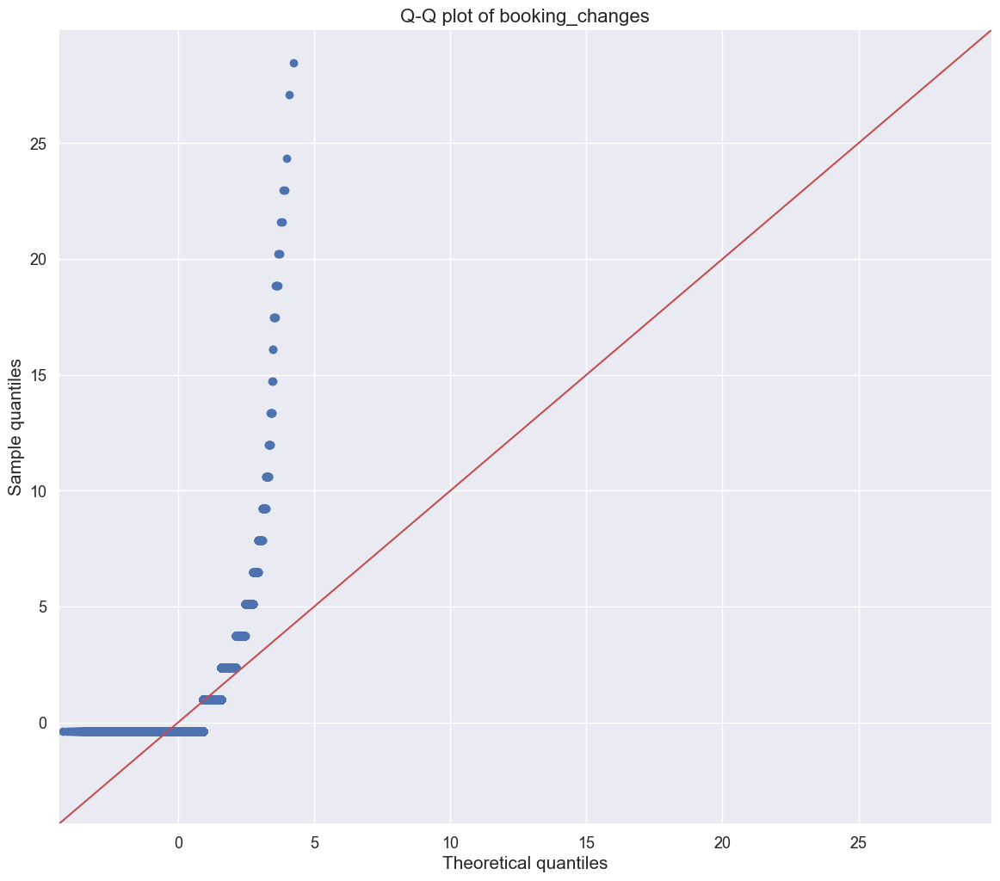

<Figure size 800x500 with 0 Axes>

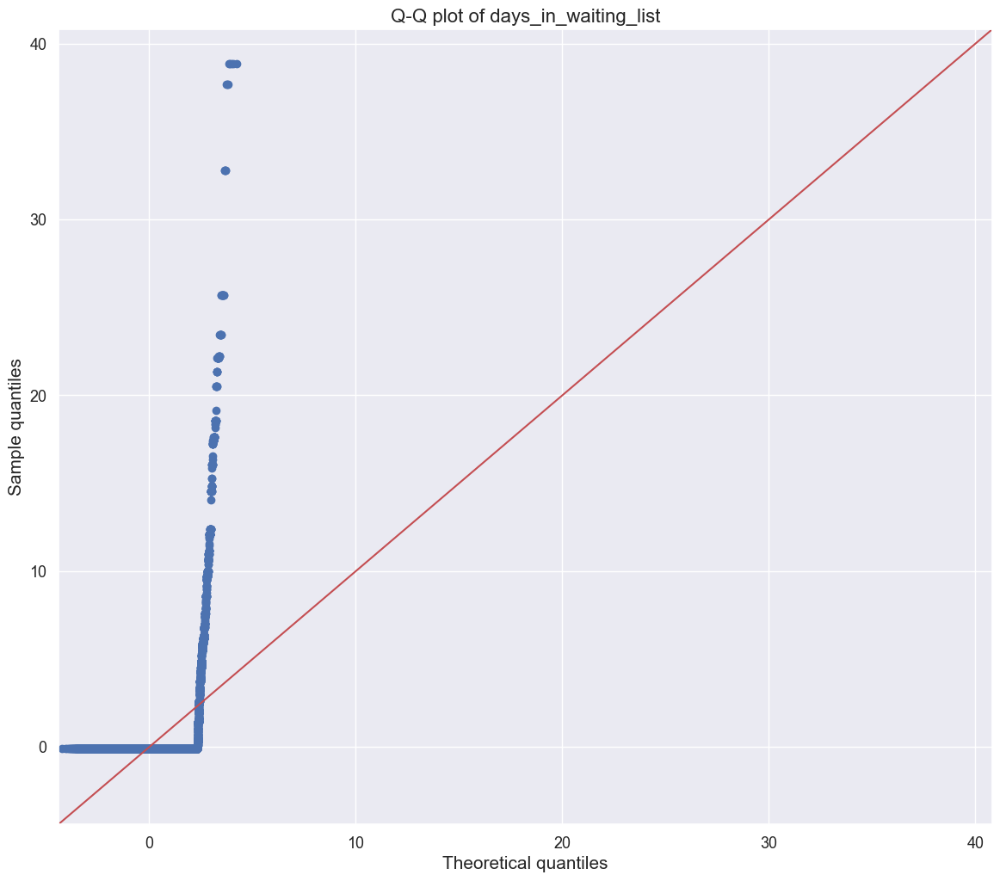

<Figure size 800x500 with 0 Axes>

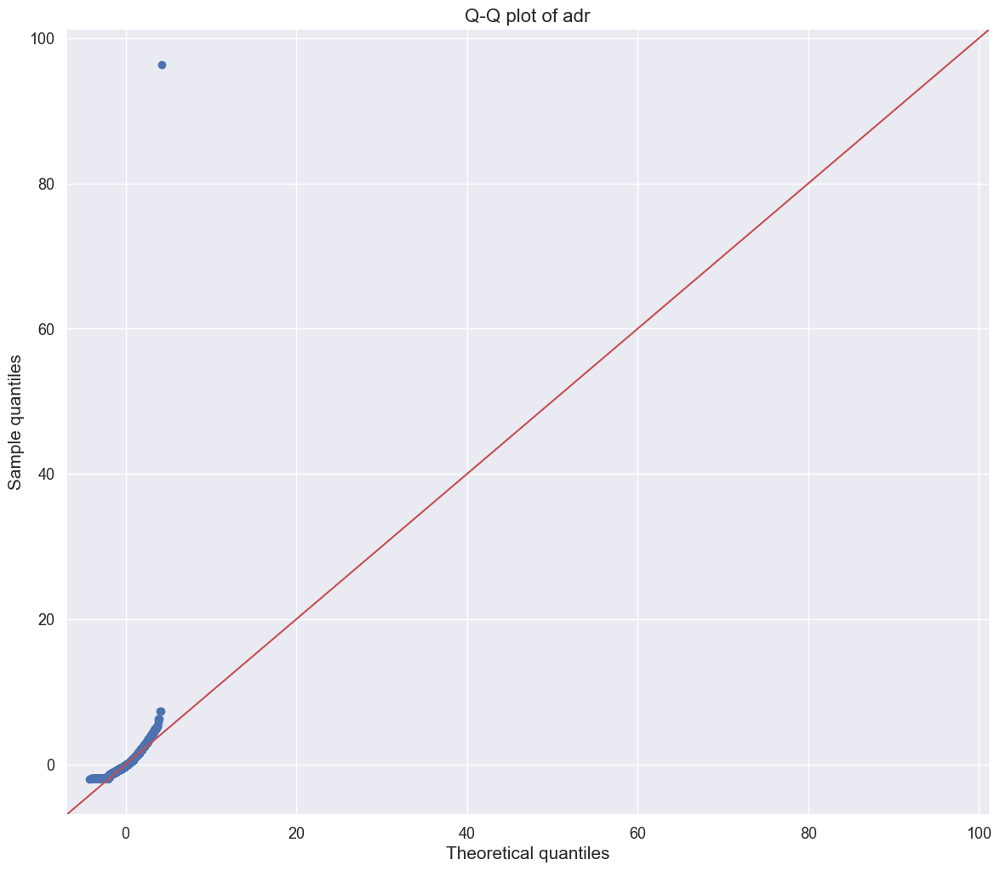

<Figure size 800x500 with 0 Axes>

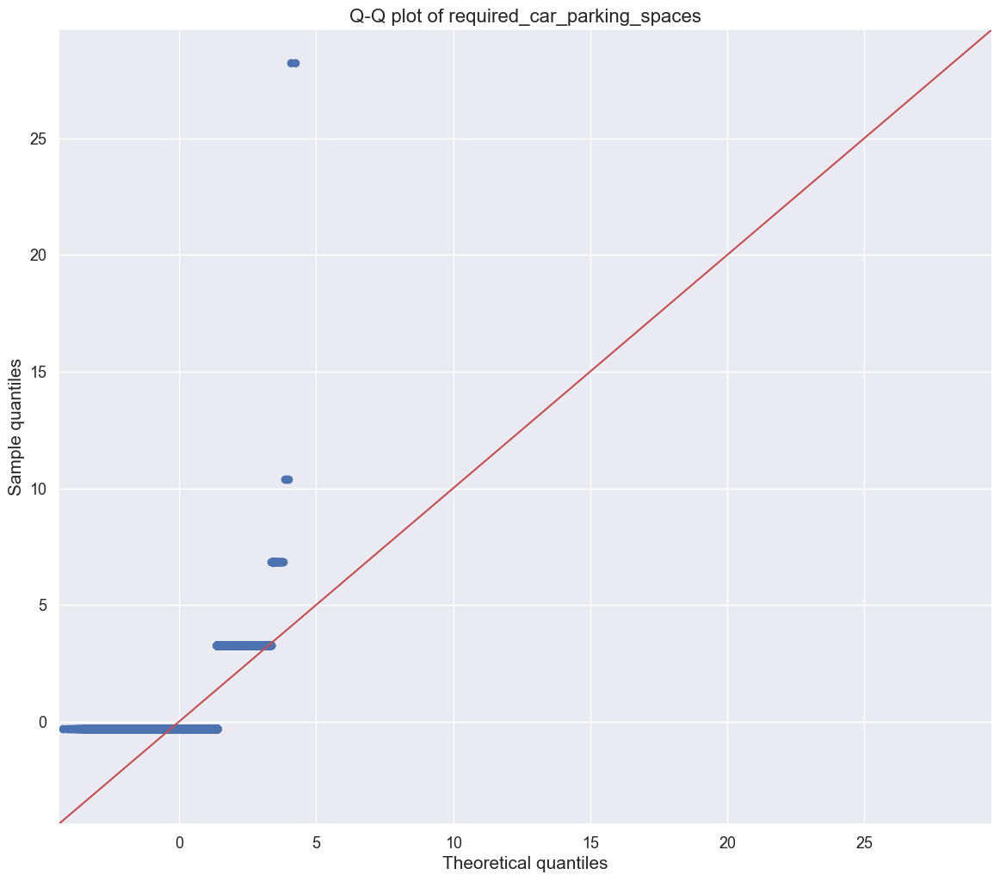

<Figure size 800x500 with 0 Axes>

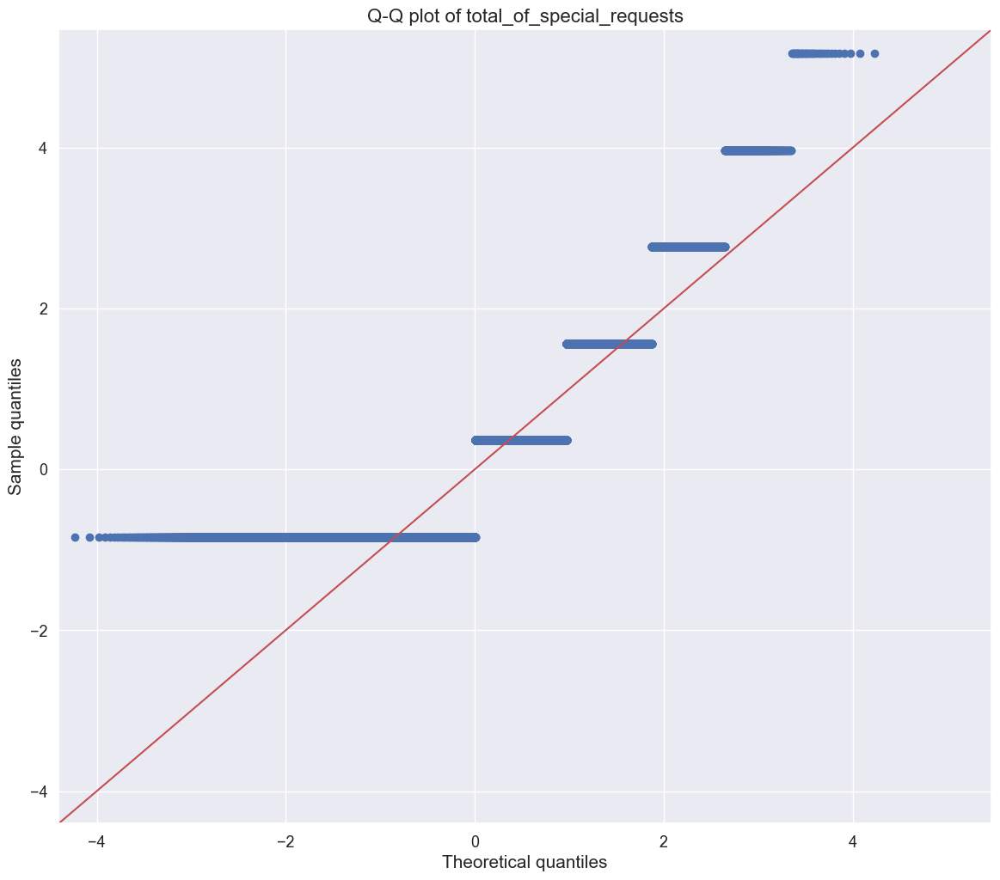

In [ ]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm=data[['lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights','stays_in_week_nights','adults','children','babies'
               ,'stays_in_weekend_nights','stays_in_weekend_nights','stays_in_weekend_nights','stays_in_weekend_nights','stays_in_weekend_nights'
               ,'is_repeated_guest','previous_cancellations','previous_bookings_not_canceled'
               ,'booking_changes','days_in_waiting_list','adr','required_car_parking_spaces','total_of_special_requests']]
print(data_norm)

# Check if the data contains non-finite values
if not np.all(np.isfinite(data_norm)):
    print("Warning: Data contains non-finite values")

for c in data_norm.columns:
    plt.figure(figsize=(8,5))
    fig = qqplot(data_norm[c].dropna(), line='45', fit='True')
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

##### With help of qq plot we observe that lead_time, arrival_date_week_number and arrival_date_day_of_month are approximately normally distributed

## Is the predictor variables independent of all the other predictor variables?

In [ ]:
# defining target and independent feature
Y = data[['is_canceled']]
X = data.drop(['is_canceled'], axis=1)

## Correlation Analysis
Correlation analysis is a technique used to examine the strength and direction of the linear relationship between two or more variables. In Python, correlation analysis can be performed using the corr() function from the pandas library or the corrcoef() function from the numpy library.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The below heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g. light maroon) to high (e.g. dark maroon).

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.

In [ ]:
num = data.select_dtypes(include='number')
char = data.select_dtypes(include='object')

In [ ]:
numcorr = num.corr()
numcorr

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.000000,0.183683,0.087745,0.000795,0.005227,0.059596,0.082778,0.080216,0.067010,-0.020950,-0.090171,0.050964,-0.050567,-0.094074,0.004297,0.126671,-0.183751,-0.121825
lead_time,0.183683,1.000000,0.138796,0.100934,0.009778,0.233610,0.309869,0.137398,0.027675,-0.003882,-0.148050,0.005509,-0.076419,0.076704,0.132171,0.019698,-0.085796,0.032999
arrival_date_year,0.087745,0.138796,1.000000,-0.514070,-0.010270,0.005022,0.003928,0.037441,0.040792,-0.023070,0.024048,-0.053985,0.028197,0.008742,-0.028191,0.176021,-0.038631,0.064358
arrival_date_week_number,0.000795,0.100934,-0.514070,1.000000,0.093673,0.026072,0.027361,0.023784,0.013415,0.013666,-0.037281,0.006634,-0.020763,0.011457,0.013884,0.097733,0.008634,0.046171
arrival_date_day_of_month,0.005227,0.009778,-0.010270,0.093673,1.000000,-0.017326,-0.027670,-0.001424,0.015834,-0.000784,-0.004411,-0.008692,0.000656,0.006488,0.006582,0.022164,0.008666,-0.001666
stays_in_weekend_nights,0.059596,0.233610,0.005022,0.026072,-0.017326,1.000000,0.551196,0.086190,0.027800,0.013587,-0.107972,-0.020690,-0.054161,0.049017,-0.032031,0.035921,-0.042700,0.030384
stays_in_week_nights,0.082778,0.309869,0.003928,0.027361,-0.027670,0.551196,1.000000,0.094298,0.030224,0.015958,-0.114698,-0.018914,-0.056944,0.084180,0.001788,0.050859,-0.044023,0.035396
adults,0.080216,0.137398,0.037441,0.023784,-0.001424,0.086190,0.094298,1.000000,0.022383,0.016213,-0.173241,-0.042173,-0.117781,-0.049180,-0.016136,0.245238,0.009225,0.110711
children,0.067010,0.027675,0.040792,0.013415,0.015834,0.027800,0.030224,0.022383,1.000000,0.017551,-0.045912,-0.019143,-0.028486,0.030887,-0.020533,0.326300,0.037155,0.044366
babies,-0.020950,-0.003882,-0.023070,0.013666,-0.000784,0.013587,0.015958,0.016213,0.017551,1.000000,-0.012993,-0.005326,-0.008859,0.080932,-0.006858,0.022779,0.030555,0.094607


<AxesSubplot:>

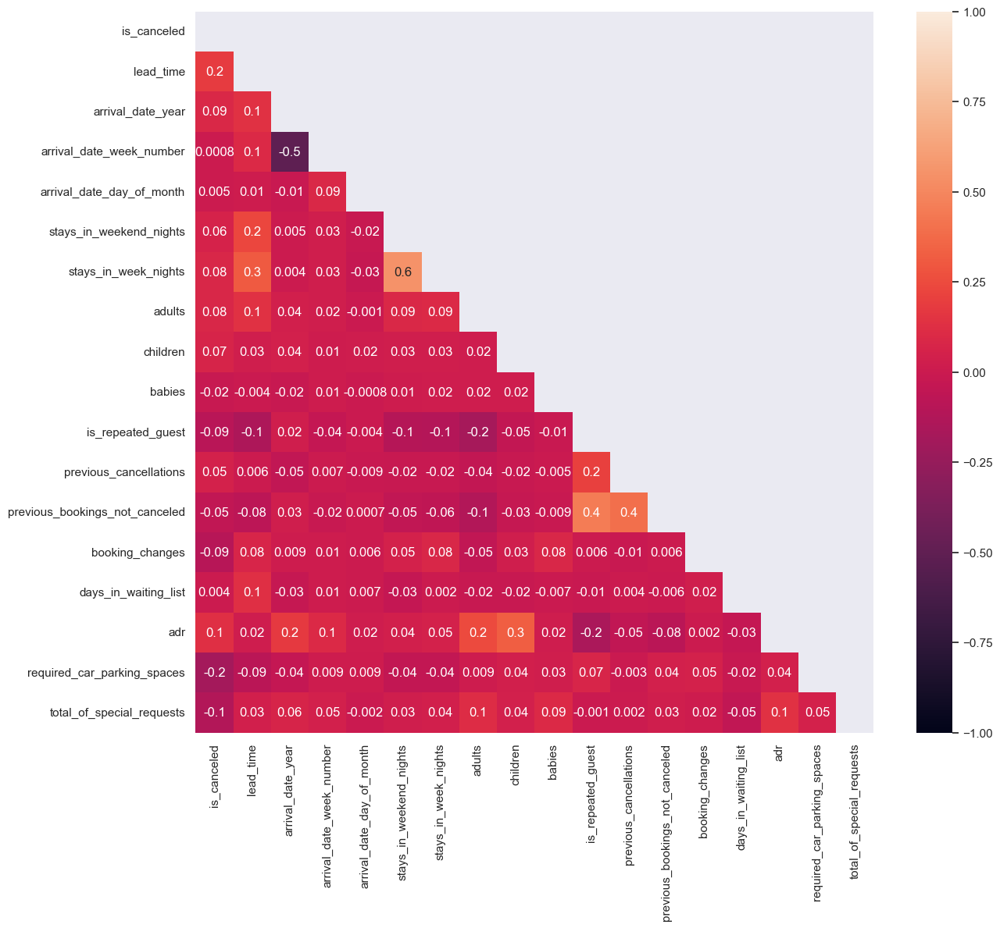

In [ ]:
# create the heatmap
matrix = np.triu(numcorr)
sns.heatmap(numcorr, vmax=1.0, vmin=-1.0, 
            fmt='.1g', annot=True, mask = matrix)

##### From the heatmap and the code above to check the correlation coefficient between 2 variables and print then doesn't give any output which means all the predictor variables are independent of each other

In [ ]:
for i in range(numcorr.shape[0]):
    for j in range(i+1, numcorr.shape[1]):
        if abs(numcorr.iloc[i, j]) > 0.8:
            print(f"Predictor variables {numcorr.columns[i]} and {numcorr.columns[j]} are highly correlated.")

## Pairplot
Seaborn's pairplot() function is a powerful visualization tool that allows you to plot pairwise relationships between multiple variables in a dataset. Each variable in the dataset is plotted against every other variable, resulting in a grid of scatter plots and histograms.

nterpreting the pairplot involves analyzing the scatter plots to determine the strength and direction of the relationship between each pair of variables.

If there is a strong linear relationship between two variables, the scatter plot will show a clear pattern or trend, with the points clustering around a straight line. If there is no relationship between the variables, the scatter plot will show a random distribution of points.

The color and shape of the points in the scatter plot can also be used to represent additional variables in the dataset. For example, you can use the hue parameter of the pairplot() function to color the points based on a categorical variable in the dataset, or use the size parameter to vary the size of the points based on a numerical variable.

In addition to analyzing the scatter plots, you can also use the histograms along the diagonal of the grid to examine the distribution of each variable in the dataset. This can help you identify outliers or other features of the data that may be important for understanding the relationships between variables.

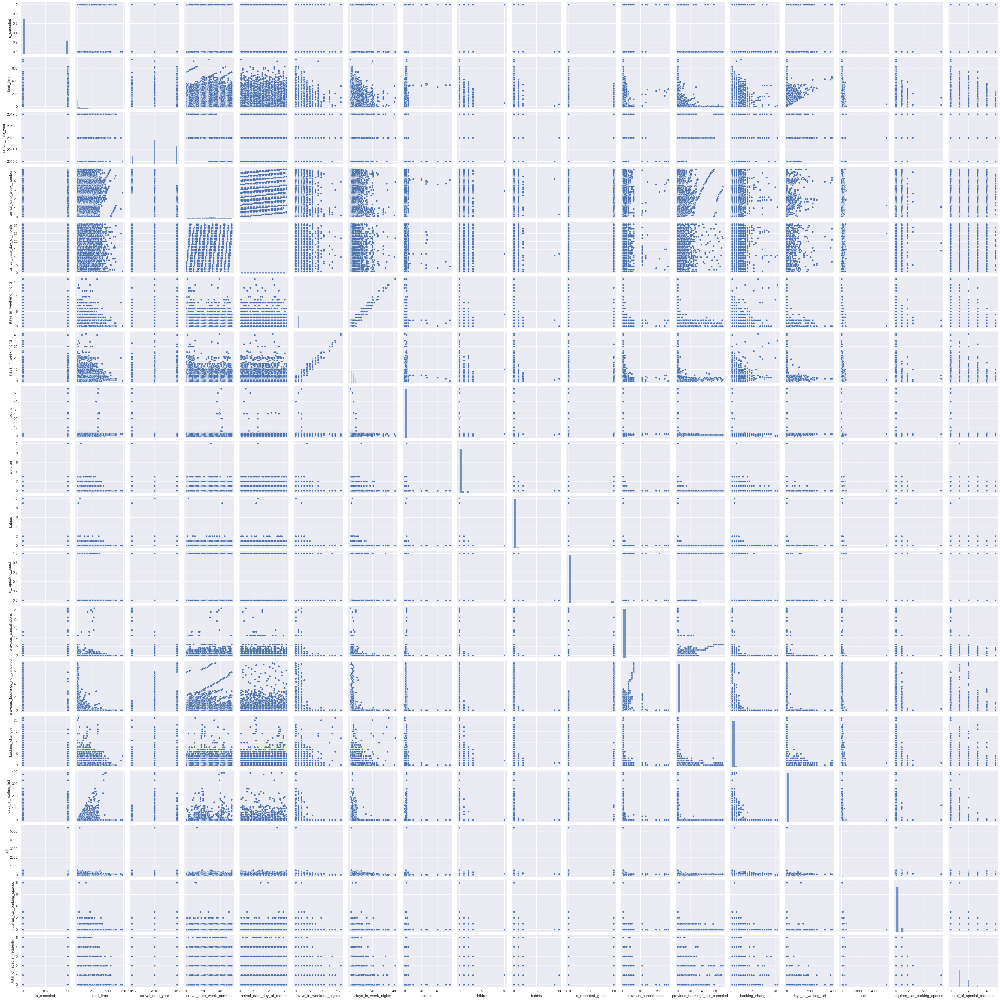

In [ ]:
#pair plot to check the colinearity
sns.pairplot(data)

##### We see that arrival_date_week_number and lead_time as well as arrival_date_day_of_moth and lead_time are positively skewed but total_of_special_requests and arrival_date_week_numer are negatively skewed

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
string_columns = data[['hotel','arrival_date_month','meal','country','market_segment','distribution_channel','reserved_room_type','assigned_room_type'
                      ,'deposit_type','customer_type','reservation_status','reservation_status_date']]

encoded_columns = string_columns.apply(encoder.fit_transform)

# Replace the original columns with the encoded columns
data[['hotel','arrival_date_month','meal','country','market_segment','distribution_channel','reserved_room_type','assigned_room_type'
                      ,'deposit_type','customer_type','reservation_status','reservation_status_date']] = encoded_columns

## Impute the values back using at least 3 imputation methods.

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

# Load your data into a DataFrame
df = data

# Split the data into predictor variables and target variable
X = df[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']]
y = df['is_canceled']

# remove 1% of data randomly
data_1_percent = df.sample(frac=0.01)

# Define the imputation methods
mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

# Impute the missing values using each method
X_mean = mean_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_knn = knn_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_iter = iter_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])

# Create a LinearRegression object
model = LinearRegression()

# Fit the model to the data and make predictions
model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

# Calculate the performance metrics of the model for each imputation method
mae_mean = mean_absolute_error(data_1_percent['is_canceled'], y_pred_mean)
mse_mean = mean_squared_error(data_1_percent['is_canceled'], y_pred_mean)
mae_knn = mean_absolute_error(data_1_percent['is_canceled'], y_pred_knn)
mse_knn = mean_squared_error(data_1_percent['is_canceled'], y_pred_knn)
mae_iter = mean_absolute_error(data_1_percent['is_canceled'], y_pred_iter)
mse_iter = mean_squared_error(data_1_percent['is_canceled'], y_pred_iter)

# Print the performance metrics
print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imputation : MAE = {mae_knn}, MSE = {mse_knn}')
print(f'Iter Imputation : MAE = {mae_iter}, MSE = {mse_iter}')

Mean Imputation: MAE = 0.3767479511256056, MSE = 0.1875170147836292
KNN Imputation : MAE = 0.3767479511256056, MSE = 0.1875170147836292
Iter Imputation : MAE = 0.3767479511256056, MSE = 0.1875170147836292


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

# Load your data into a DataFrame
df = data

# Split the data into predictor variables and target variable
X = df[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']]
y = df['is_canceled']

# remove 5% of data randomly
data_1_percent = df.sample(frac=0.05)

# Define the imputation methods
mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

# Impute the missing values using each method
X_mean = mean_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_knn = knn_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_iter = iter_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])

# Create a LinearRegression object
model = LinearRegression()

# Fit the model to the data and make predictions
model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

# Calculate the performance metrics of the model for each imputation method
mae_mean = mean_absolute_error(data_1_percent['is_canceled'], y_pred_mean)
mse_mean = mean_squared_error(data_1_percent['is_canceled'], y_pred_mean)
mae_knn = mean_absolute_error(data_1_percent['is_canceled'], y_pred_knn)
mse_knn = mean_squared_error(data_1_percent['is_canceled'], y_pred_knn)
mae_iter = mean_absolute_error(data_1_percent['is_canceled'], y_pred_iter)
mse_iter = mean_squared_error(data_1_percent['is_canceled'], y_pred_iter)

# Print the performance metrics
print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imputation : MAE = {mae_knn}, MSE = {mse_knn}')
print(f'Iter Imputation : MAE = {mae_iter}, MSE = {mse_iter}')

Mean Imputation: MAE = 0.3862433437850997, MSE = 0.19580805846935326
KNN Imputation : MAE = 0.3862433437850997, MSE = 0.19580805846935326
Iter Imputation : MAE = 0.3862433437850997, MSE = 0.19580805846935326


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

# Load your data into a DataFrame
df = data

# Split the data into predictor variables and target variable
X = df[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']]
y = df['is_canceled']

# remove 10% of data randomly
data_1_percent = df.sample(frac=0.1)

# Define the imputation methods
mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

# Impute the missing values using each method
X_mean = mean_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_knn = knn_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])
X_iter = iter_imputer.fit_transform(data_1_percent[['lead_time','adr','arrival_date_day_of_month','arrival_date_week_number','stays_in_week_nights']])

# Create a LinearRegression object
model = LinearRegression()

# Fit the model to the data and make predictions
model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

# Calculate the performance metrics of the model for each imputation method
mae_mean = mean_absolute_error(data_1_percent['is_canceled'], y_pred_mean)
mse_mean = mean_squared_error(data_1_percent['is_canceled'], y_pred_mean)
mae_knn = mean_absolute_error(data_1_percent['is_canceled'], y_pred_knn)
mse_knn = mean_squared_error(data_1_percent['is_canceled'], y_pred_knn)
mae_iter = mean_absolute_error(data_1_percent['is_canceled'], y_pred_iter)
mse_iter = mean_squared_error(data_1_percent['is_canceled'], y_pred_iter)

# Print the performance metrics
print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imputation : MAE = {mae_knn}, MSE = {mse_knn}')
print(f'Iter Imputation : MAE = {mae_iter}, MSE = {mse_iter}')

Mean Imputation: MAE = 0.38072768766943565, MSE = 0.19010394800235184
KNN Imputation : MAE = 0.38072768766943565, MSE = 0.19010394800235184
Iter Imputation : MAE = 0.38072768766943565, MSE = 0.19010394800235184


In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(num['is_canceled'], num[['lead_time', 'adr', 'arrival_date_year', 'stays_in_week_nights', 'adults',
       'children', 'stays_in_weekend_nights','previous_cancellations', 'arrival_date_day_of_month',
       'arrival_date_week_number', 'arrival_date_week_number', 'babies','previous_bookings_not_canceled', 
       'is_repeated_guest', 'booking_changes', 'total_of_special_requests', 'required_car_parking_spaces']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:            is_canceled   R-squared (uncentered):                   0.360
Model:                            OLS   Adj. R-squared (uncentered):              0.360
Method:                 Least Squares   F-statistic:                              3057.
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                        0.00
Time:                        15:05:14   Log-Likelihood:                         -47969.
No. Observations:               86914   AIC:                                  9.597e+04
Df Residuals:                   86898   BIC:                                  9.612e+04
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
lead_time                          0.0008   1.79e-05     47.070      0.000       0.001       0.001
adr                                0.0010   2.89e-05     36.180      0.000       0.001       0.001
arrival_date_year                7.14e-05   3.14e-06     22.743      0.000    6.52e-05    7.76e-05
stays_in_week_nights               0.0057      0.001      6.626      0.000       0.004       0.007
adults                             0.0221      0.002      9.160      0.000       0.017       0.027
children                           0.0331      0.003      9.999      0.000       0.027       0.040
stays_in_weekend_nights           -0.0004      0.002     -0.267      0.789      -0.004       0.003
previous_cancellations             0.0904      0.004     21.480      0.000       0.082       0.099
arrival_date_day_of_month          0.0003      0.000      1.727      0.084   -3.77e-05       0.001
arrival_date_week_number          -0.0004    5.3e-05     -7.314      0.000      -0.000      -0.000
arrival_date_week_number          -0.0004    5.3e-05     -7.314      0.000      -0.000      -0.000
babies                             0.0053      0.013      0.417      0.677      -0.020       0.030
previous_bookings_not_canceled    -0.0073      0.001     -7.370      0.000      -0.009      -0.005
is_repeated_guest                 -0.0650      0.008     -7.715      0.000      -0.082      -0.048
booking_changes                   -0.0596      0.002    -30.085      0.000      -0.064      -0.056
total_of_special_requests         -0.0750      0.002    -42.915      0.000      -0.078      -0.072
required_car_parking_spaces       -0.2557      0.005    -49.753      0.000      -0.266      -0.246
==============================================================================
Omnibus:                    11483.769   Durbin-Watson:                   0.483
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            10720.386
Skew:                           0.788   Prob(JB):                         0.00
Kurtosis:                       2.309   Cond. No.                     2.17e+18
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The smallest eigenvalue is 7.53e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

Y = data[['is_canceled']]
X = data.drop(['is_canceled'], axis=1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
clf = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set
clf.fit(X_train, y_train)
feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

feature_scores

reservation_status                0.804615
lead_time                         0.031214
market_segment                    0.027644
reservation_status_date           0.023514
country                           0.016677
total_of_special_requests         0.015819
required_car_parking_spaces       0.014899
deposit_type                      0.010795
adr                               0.008775
previous_cancellations            0.005260
arrival_date_week_number          0.005181
arrival_date_year                 0.004141
booking_changes                   0.003998
customer_type                     0.003938
distribution_channel              0.003416
stays_in_week_nights              0.003415
arrival_date_day_of_month         0.002896
assigned_room_type                0.002397
arrival_date_month                0.002397
stays_in_weekend_nights           0.001836
reserved_room_type                0.001486
hotel                             0.001289
previous_bookings_not_canceled    0.001029
adults     

##### We observe that - 
1. reservation_status        
2. lead_time                            
3. market_segment             
4. reservation_status_date         
##### are the most important features

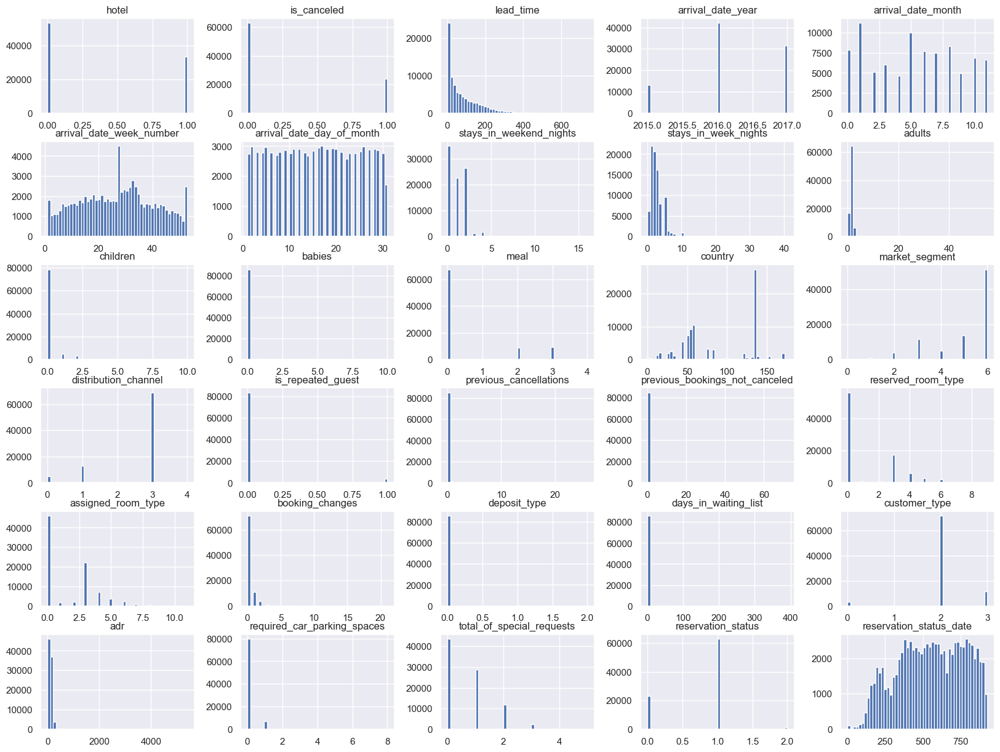

In [ ]:
# Histograms to show it
data.hist(bins=50, figsize=(20,15))
plt.show()

In [ ]:
#Understanding the important features 
import eli5
from eli5.sklearn import PermutationImportance
regr = LinearRegression().fit(X, y)
perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
1.2617 ± 0.0185,reservation_status
0.8504 ± 0.0192,arrival_date_year
0.6276 ± 0.0104,reservation_status_date
0.1160 ± 0.0028,arrival_date_week_number
0.0049 ± 0.0004,country
0.0030 ± 0.0005,market_segment
0.0023 ± 0.0003,required_car_parking_spaces
0.0018 ± 0.0005,lead_time
0.0012 ± 0.0002,assigned_room_type
0.0010 ± 0.0003,total_of_special_requests


## Fitting a Linear Model

In [ ]:
X = data.drop("is_canceled", axis = 1)
y = data["is_canceled"]

# Create the X_train and y_train
X_train = data.drop("is_canceled", axis = 1)
y_train = data["is_canceled"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2)
X_train.shape, X_test.shape

np.random.seed(42);

In [ ]:
# Fit the model and calculate the score
lr_model = LogisticRegression(solver='liblinear')
lr_model.fit(X_train, y_train)
lr_model.score(X_test, y_test)

0.9884945061266754

In [ ]:
# Calculate the MAE
y_preds = lr_model.predict(X_test)
mae = mean_absolute_error(y_test, y_preds)
mae

0.011505493873324512

## Interpreting Regression Co-efficients

Model Co-efficients

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

As seen in the co-efficient coloumn in the above table

Value for the variable arival_date_year is highest = 0.2211
Followed by deposit_type = 0.0365
High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above arival_date_year and deposit_type seems to be the most important variables to predict target i.e. Hotel Demand.

P-Values

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant

lead_time
hotel
country
market_segment
deposit_type
adr
These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (is_canceled).

Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 7.898, 72.936 respectively.

Durbin-Watson

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.416 which could be interpreted as a positive auto-correlation in the residuals of regression.

Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 25467012.025 which again re-inforces the interpretation we got from Skew and Kurtosis.

## 2. Random Forest Regressor

## Fit Tree Based Model

In [ ]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [ ]:
# Evaluate model
y_pred = tree_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


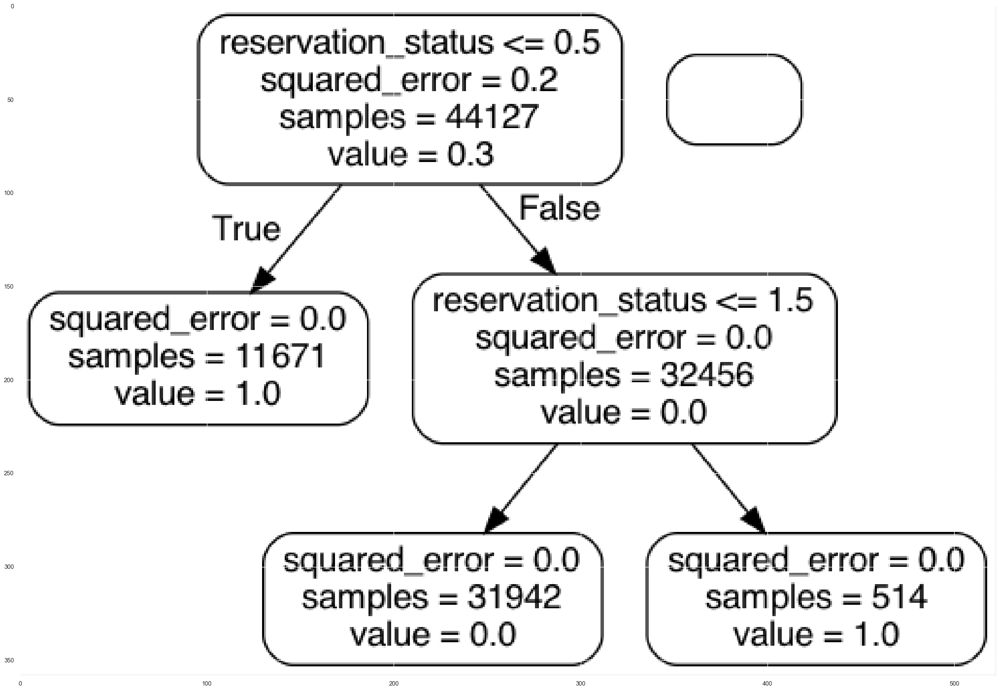

In [ ]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

## Interpreting Nodes of a Tree-Based Model

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

In a random forest regressor, each decision tree in the ensemble consists of a series of nodes. Each node represents a question that helps the tree split the data into smaller and more homogeneous subsets based on certain criteria.

The interpretation of a node depends on its position in the tree and the criteria used for the split. The root node is the first node in the tree and represents the entire dataset. The root node splits the dataset into two or more subsets based on the feature that best separates the data based on a selected criterion, such as the Gini impurity or the mean squared error. The feature used for the split and the threshold value for that feature are stored in the node.

The internal nodes in the tree represent further splits of the data based on other features and thresholds, while the leaf nodes represent the final subsets of the data that have been split into homogenous groups.

To interpret a specific node in a random forest decision tree, you need to look at the feature and threshold values stored in that node, as well as its position in the tree. By following the path from the root node to the specific node, you can see how the data has been split at each node and what features were used for those splits.

In general, the deeper a node is in the tree, the more specific the split criteria and the more specialized the subset of data represented by that node. However, it's important to note that in a random forest, the ensemble of trees is used to make predictions rather than relying on any individual tree, so the interpretation of individual nodes may not be as important as understanding the overall behavior of the forest.

## Setting up AutoML

In [ ]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [ ]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

0


In [ ]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:7951..... not found.
Attempting to start a local H2O server...
  Java Version: java version "18.0.2.1" 2022-08-18; Java(TM) SE Runtime Environment (build 18.0.2.1+1-1); Java HotSpot(TM) 64-Bit Server VM (build 18.0.2.1+1-1, mixed mode, sharing)
  Starting server from /Users/namandiwan/opt/anaconda3/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/kc/c14z_09s0wn36p1sghcgjq7h0000gn/T/tmplpwm8hbz
  JVM stdout: /var/folders/kc/c14z_09s0wn36p1sghcgjq7h0000gn/T/tmplpwm8hbz/h2o_namandiwan_started_from_python.out
  JVM stderr: /var/folders/kc/c14z_09s0wn36p1sghcgjq7h0000gn/T/tmplpwm8hbz/h2o_namandiwan_started_from_python.err
  Server is running at http://127.0.0.1:7951
Connecting to H2O server at http://127.0.0.1:7951 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,America/Los_Angeles
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.1
H2O_cluster_version_age:,2 months
H2O_cluster_name:,H2O_from_python_namandiwan_qqh7vk
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,2 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


## Getting best model using H2O AutoML

In [ ]:
df = h2o.H2OFrame(data) 

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
# converting categorical data to numeric data
df['is_canceled'] = df['is_canceled'].asfactor()

In [ ]:
X = df.columns
print(X)

['hotel', 'is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date']


In [ ]:
# Set target and predictor variables
y = "is_canceled"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'reservation_status', 'reservation_status_date']


In [ ]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
aml.train(x=X, y=y, training_frame=df_train)  # Training the dataset on different models

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20230409_150536


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    18                 18                          112092                 2            20           18.4444       3             924           490.833

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.001564955959461009
RMSE: 0.03955952425726337
LogLoss: 0.011065141298707849
Mean Per-Class Error: 0.00045690396093830255
AUC: 0.9998513650584877
AUCPR: 0.9998029368852059
Gini: 0.9997027301169754

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4000000000000001
       0      1      Error    Rate
-----  -----  -----  -------  --------------
0      50306  12     0.0002   (12.0/50318.0)
1      13     19237  0.0007   (13.0/19250.0)
Total  50319  19249  0.0004   (25.0/69568.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value      idx
---------------------------  -----------  ---------  -----
max f1                       0.4          0.999351   168
max f2                       0.343434     0.999356   171
max f0point5                 0.428571     0.999428   166
max accuracy                 0.428571     0.999641   166
max precision                0.677419     0.999948   154
max recall                   0            1          399
max specificity              1            0.99998    0
max absolute_mcc             0.4          0.999102   168
max min_per_class_accuracy   0.343434     0.999377   171
max mean_per_class_accuracy  0.343434     0.999549   171
max tns                      1            50317      0
max fns                      1            1555       0
max fps                      0            50318      399
max tps                      0            19250      399
max tnr                      1            0.99998    0
max fnr                      1            0.0807792  0
max fpr                      0            1          399
max tpr                      0            1          399

Gains/Lift Table: Avg response rate: 27.67 %, avg score: 27.62 %
group    cumulative_data_fraction    lower_threshold    lift         cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  -----------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.254304                    1                  3.61371      3.61371            0.999943         1           0.999943                    1                   0.918982        0.918982                   261.371   261.371            0.918962
2        0.300003                    0.0355991          1.7615       3.33157            0.487421         0.475132    0.921872                    0.920048            0.0804986       0.999481                   76.1501   233.157            0.967075
3        1                           0                  0.000741925  1                  0.000205297      0.00019149  0.276708                    0.276151            0.000519346     1                          -99.9258  0                  0

ModelMetricsBinomial: drf
** Reported on cross-validation data. **

MSE: 0.0007632049895123595
RMSE: 0.027626164943986696
LogLoss: 0.008625108804862513
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4444444444444444
       0      1      Error    Rate
-----  -----  -----  -----

In [ ]:
# getting the best model
best_model = aml.get_best_model()
print(best_model)

Model Details
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20230409_150536


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    18                 18                          112092                 2            20           18.4444       3             924           490.833

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.001564955959461009
RMSE: 0.03955952425726337
LogLoss: 0.011065141298707849
Mean Per-Class Error: 0.00045690396093830255
AUC: 0.9998513650584877
AUCPR: 0.9998029368852059
Gini: 0.9997027301169754

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4000000000000001
       0      1      Error    Rate
-----  -----  -----  -------  --------------


In [ ]:
# printing the best model algo
best_model.algo

'drf'

In [ ]:
# Getting RMSE of the best model
print(best_model.rmse(train=True))

0.03955952425726337


In [ ]:
# Making predictions
# convert X_test to an H2OFrame
h2o_X_test = h2o.H2OFrame(X_test)
y_predauto = best_model.predict(h2o_X_test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


## Hyperparameter Tuning

Hyperparameter tuning is the process of finding the optimal values of the hyperparameters for a given machine learning model. Hyperparameters are model parameters that are set before the training process begins and are not learned during training. Some examples of hyperparameters include learning rate, regularization strength, and the number of hidden layers in a neural network.

There are several techniques for hyperparameter tuning in Python, including:

1. Grid search: Grid search is a brute-force approach that involves specifying a grid of hyperparameter values to search over. The model is then trained and evaluated for each combination of hyperparameters, and the combination that produces the best performance is selected.

2. Random search: Random search is similar to grid search, but instead of searching over a pre-specified grid, it searches over a randomly selected set of hyperparameter values. This approach can be more efficient than grid search when the number of hyperparameters is large.

3. Bayesian optimization: Bayesian optimization is a more sophisticated approach that uses a probabilistic model to select the next set of hyperparameters to try based on the results of previous trials. This approach can be more efficient than grid or random search when the search space is large and the evaluation of each set of hyperparameters is expensive.

4. Gradient-based optimization: Gradient-based optimization involves computing the gradient of the model's performance with respect to the hyperparameters and using gradient descent to find the optimal values. This approach can be more efficient than other methods when the hyperparameters have a smooth and continuous relationship with the model's performance.

Python provides several libraries for hyperparameter tuning, including Scikit-learn, Keras Tuner, Optuna, and Hyperopt. These libraries provide different approaches to hyperparameter tuning and are suitable for different types of machine learning models and applications.

In [ ]:
s = data['is_canceled']

t = data.drop(['is_canceled'], axis = 1)

In [ ]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [ ]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [ ]:
random_rf.best_params_

{'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 500}

## SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## DRF_1_AutoML_1_20230409_150536

,0,1,Error,Rate
0,50331.0,0.0,0.0,(0.0/50331.0)
1,0.0,19255.0,0.0,(0.0/19255.0)
Total,50331.0,19255.0,0.0,(0.0/69586.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

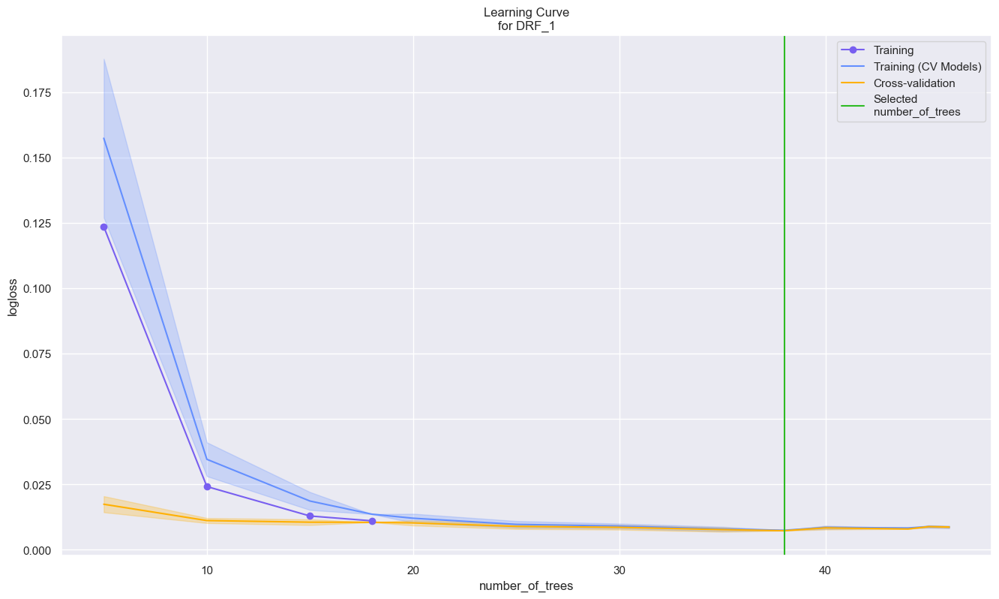

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

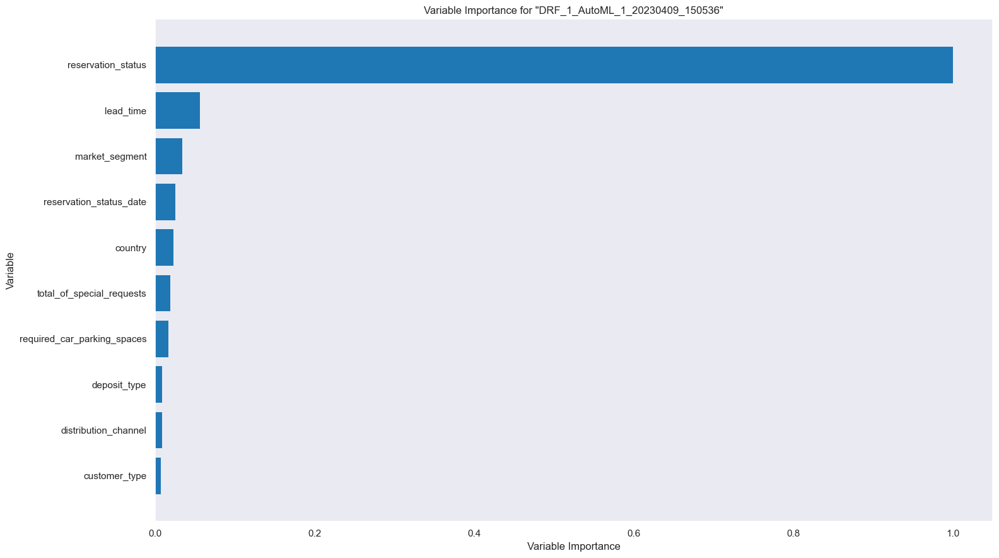

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

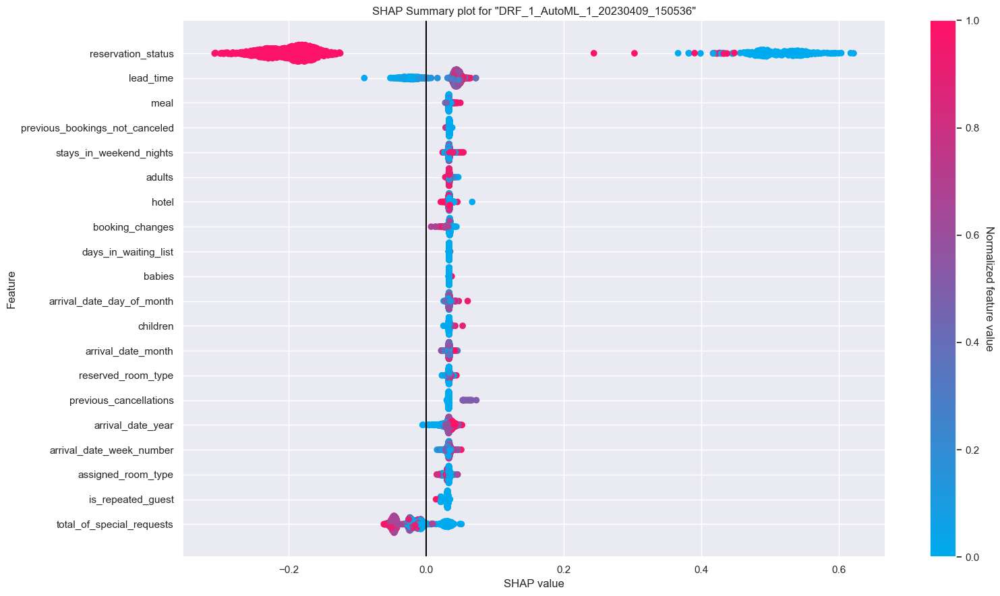

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

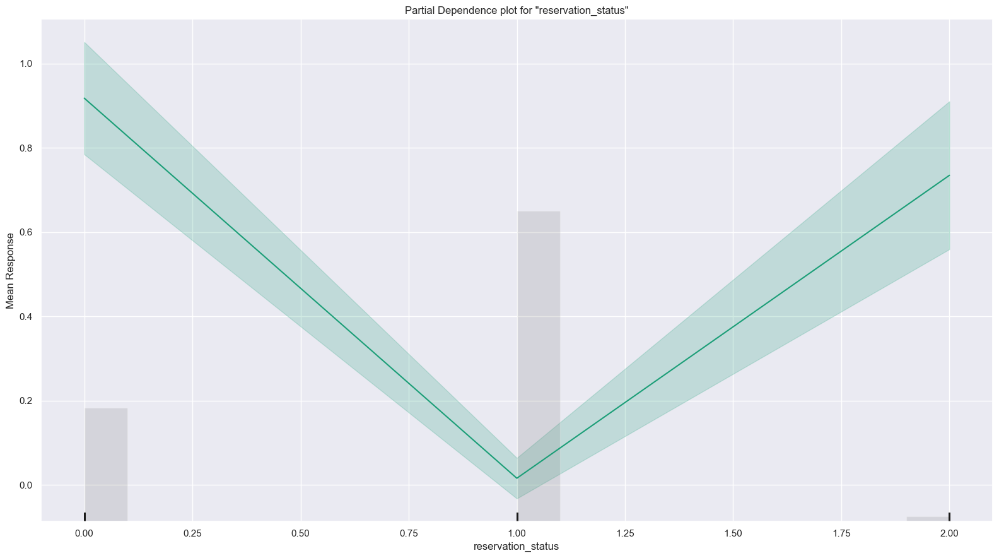

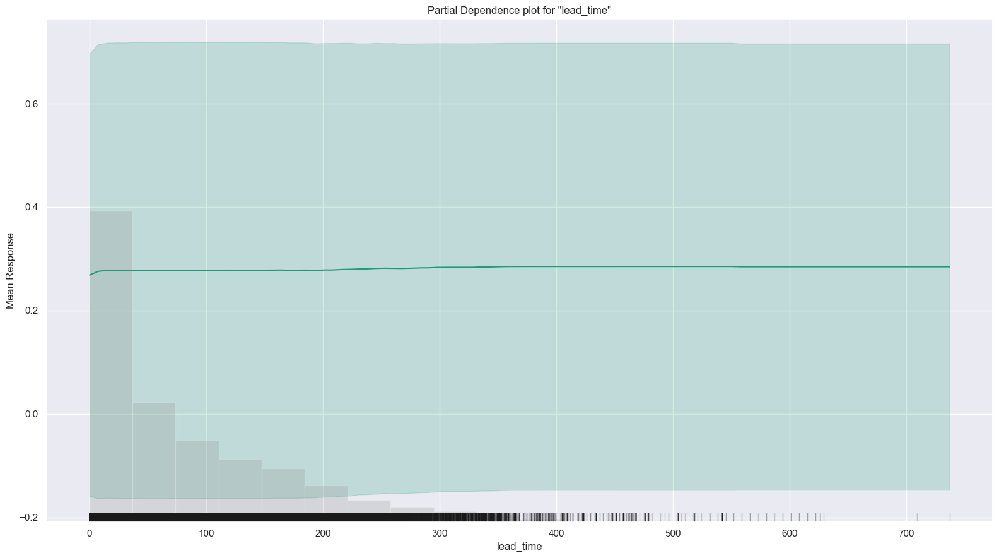

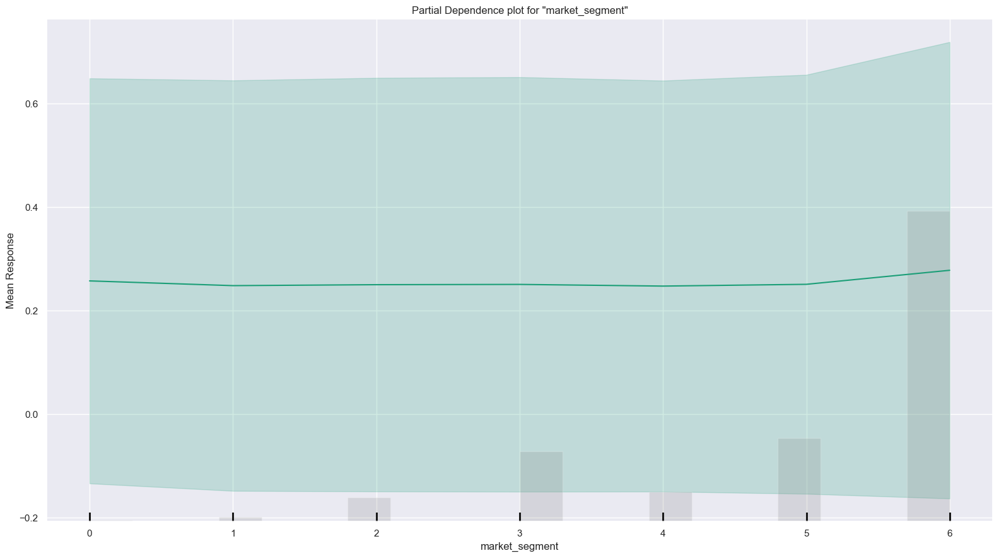

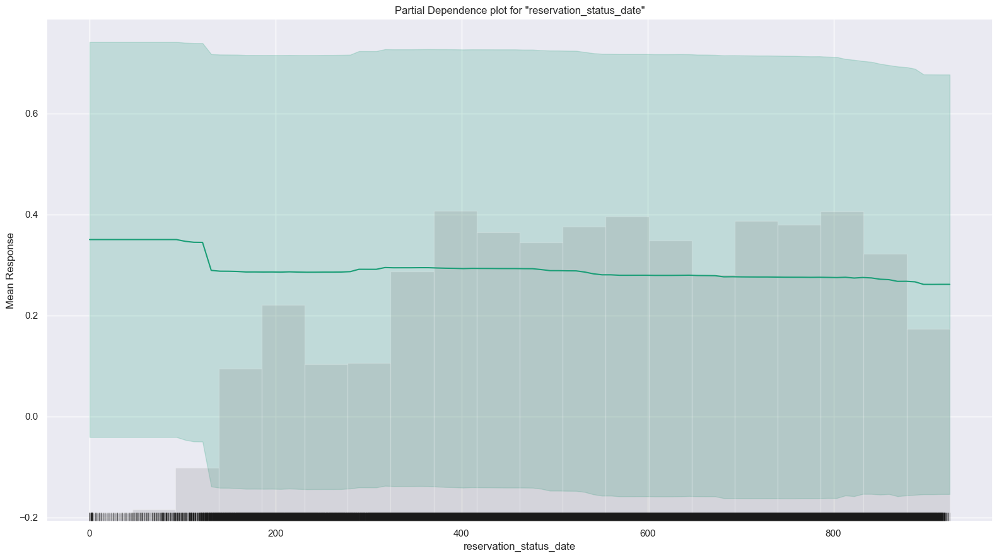

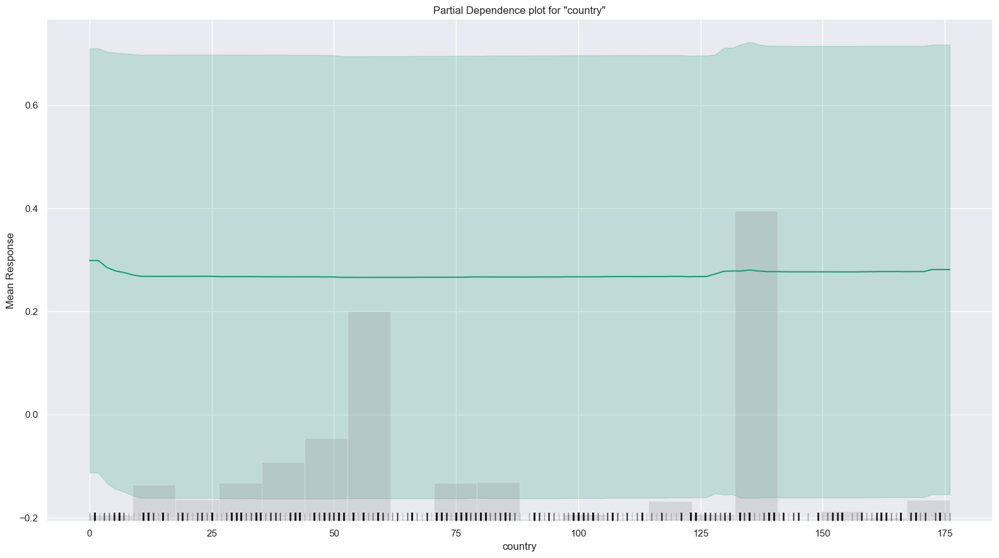

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## DRF_1_AutoML_1_20230409_150536

,0,1,Error,Rate
0,50331.0,0.0,0.0,(0.0/50331.0)
1,0.0,19255.0,0.0,(0.0/19255.0)
Total,50331.0,19255.0,0.0,(0.0/69586.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

In [ ]:
aml.leader.explain(df_train)

## SHAP Analysis for Tree Based Model

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of reservation status

For the tree based model the cross is made at approx E[f(x)] 0.38 So as the reservation status increases the expected value also increases. it was same for the Linear Model.

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

Permutation explainer: 69532it [18:05, 63.48it/s]                               


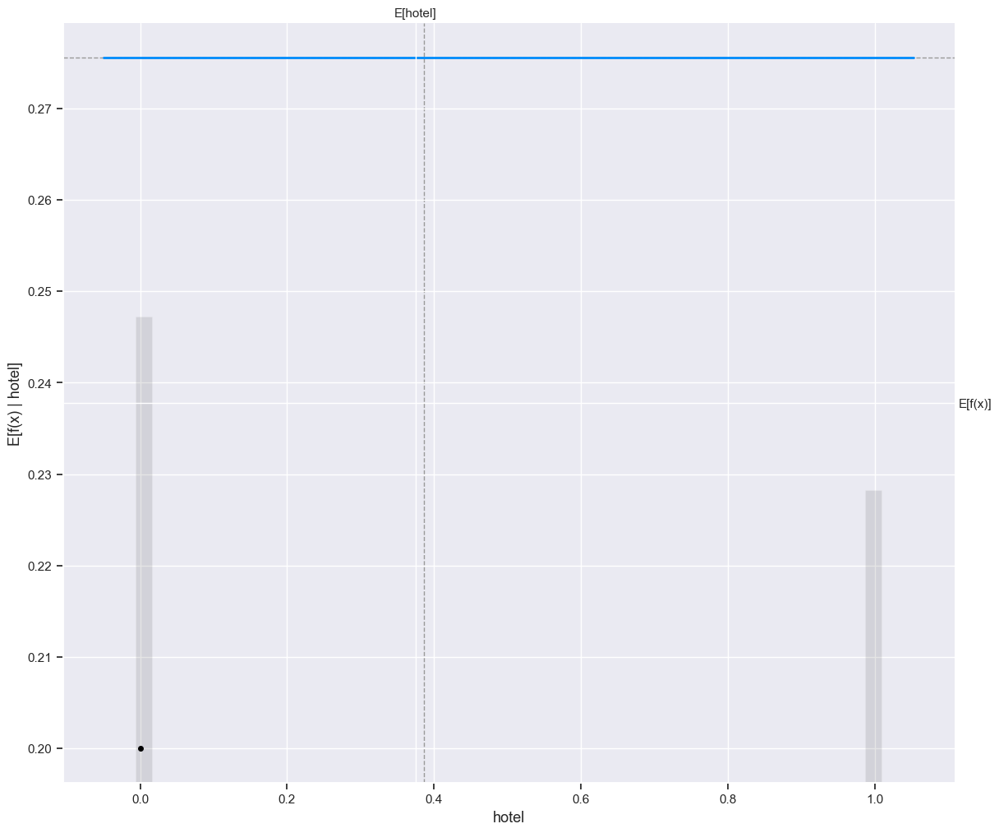

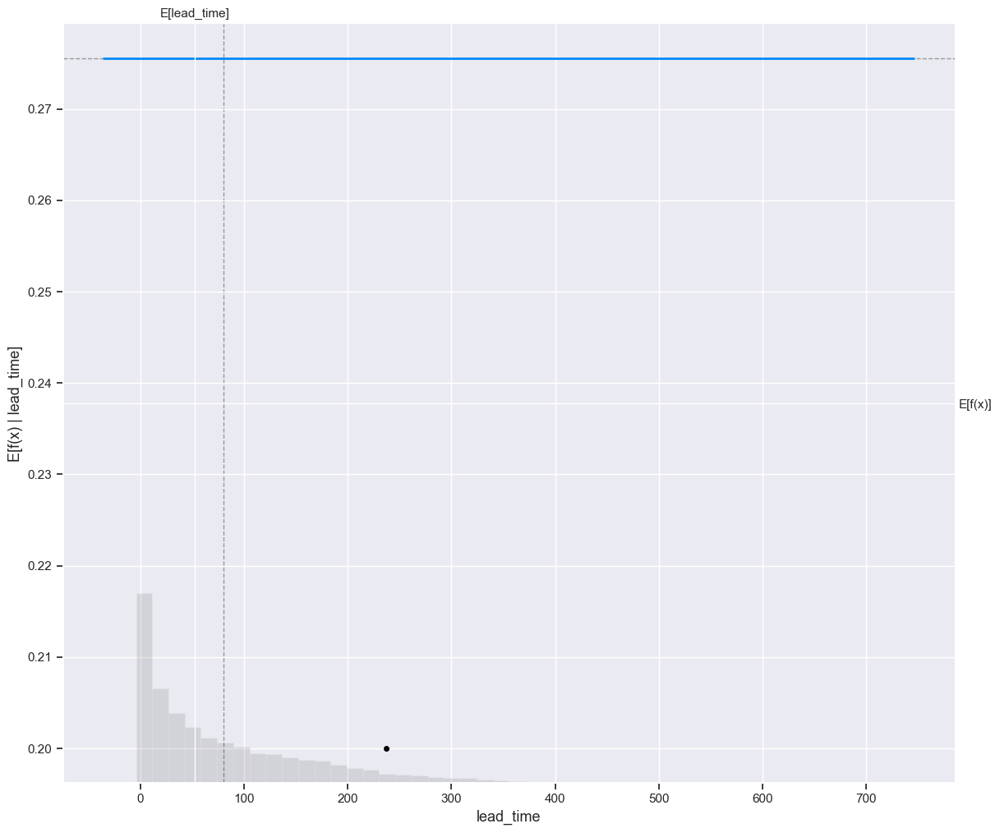

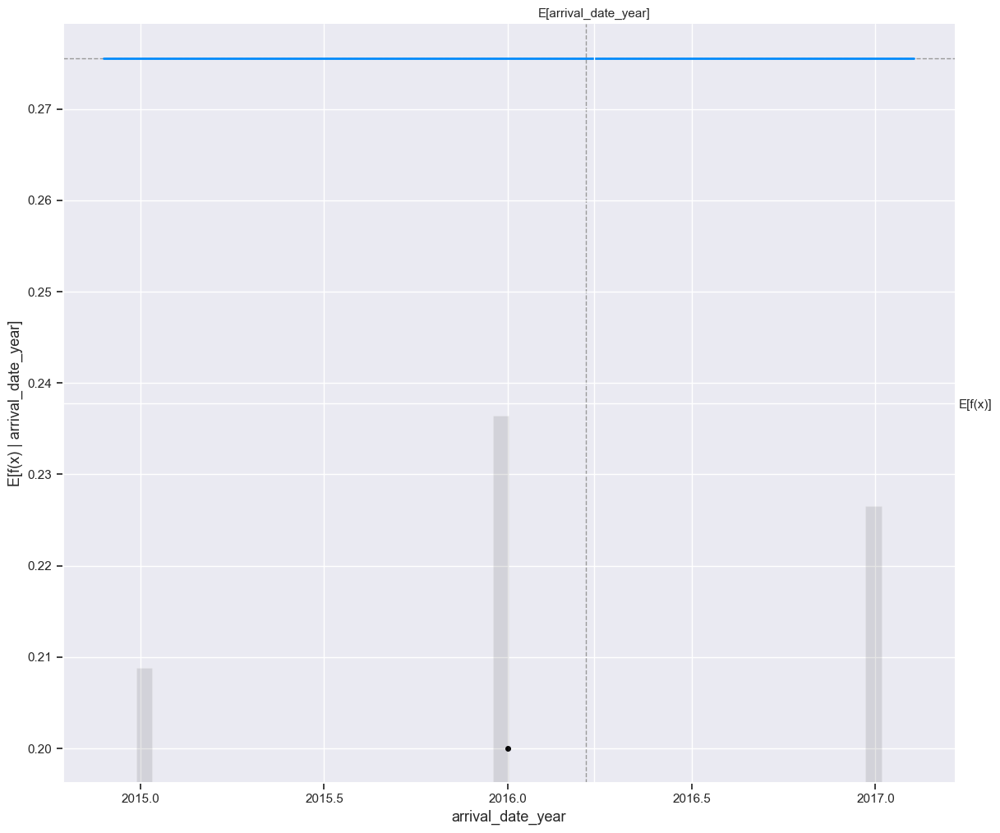

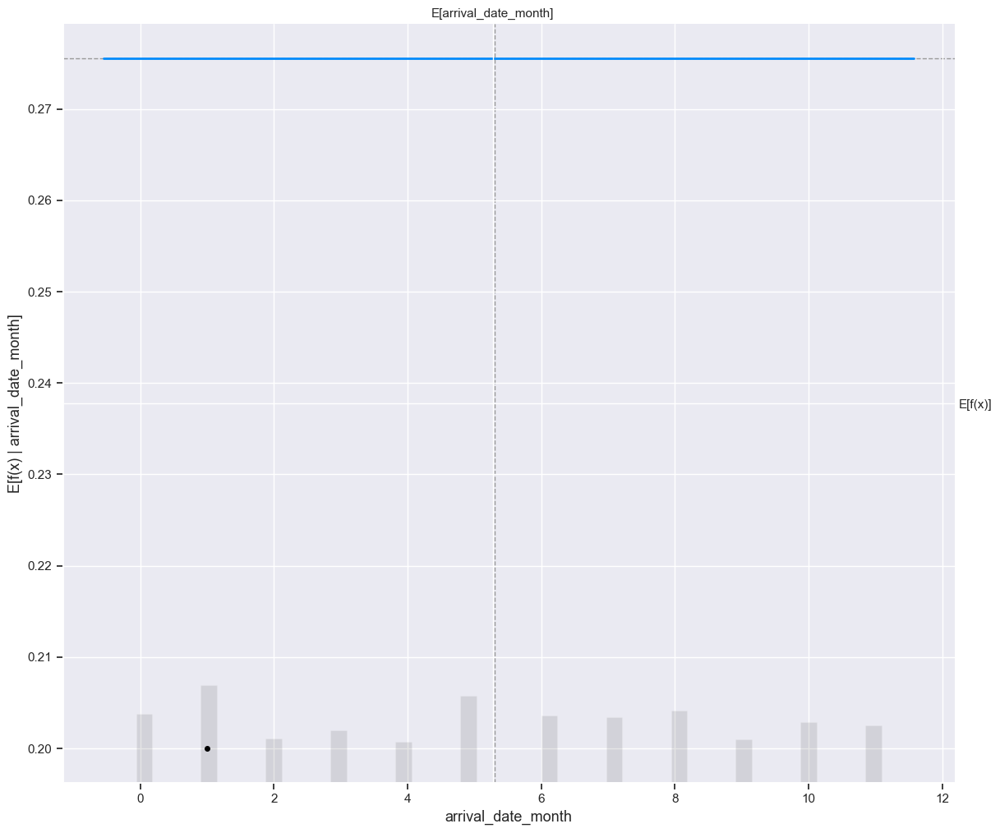

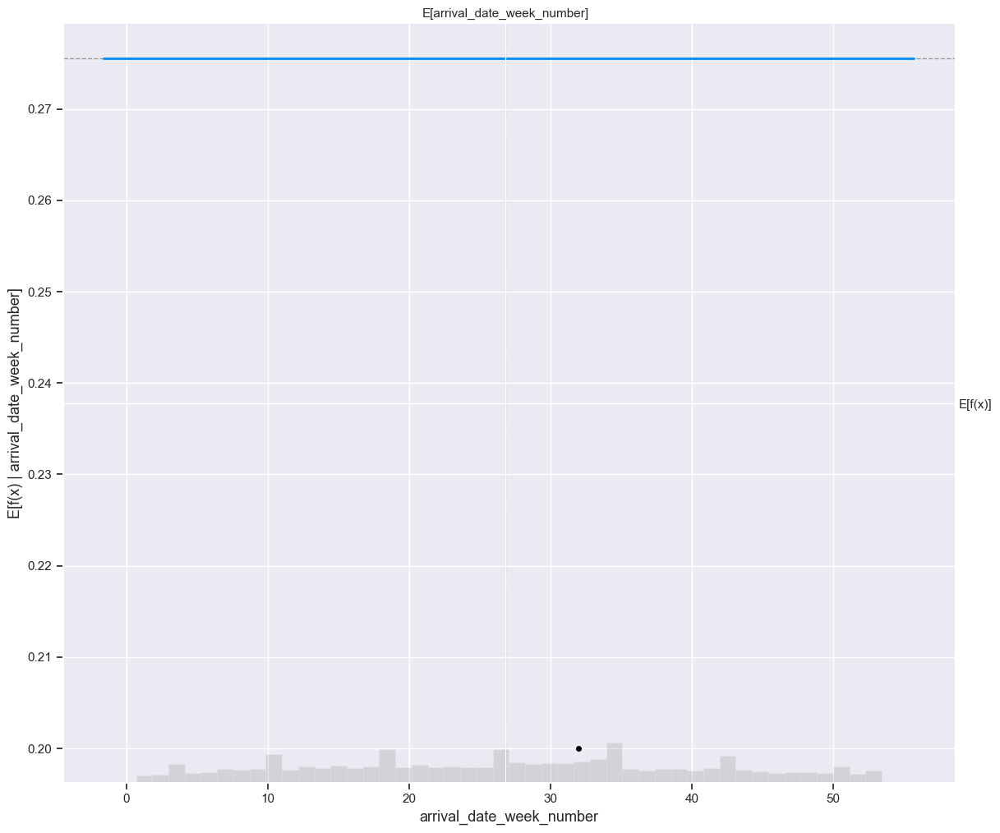

...

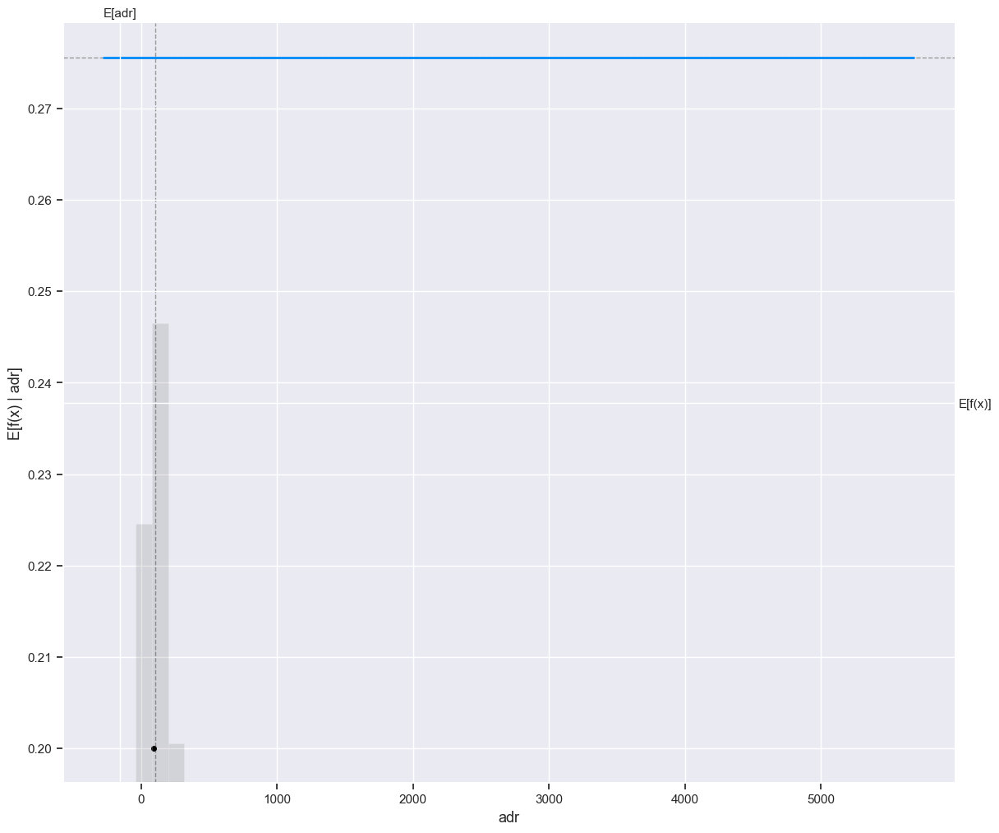

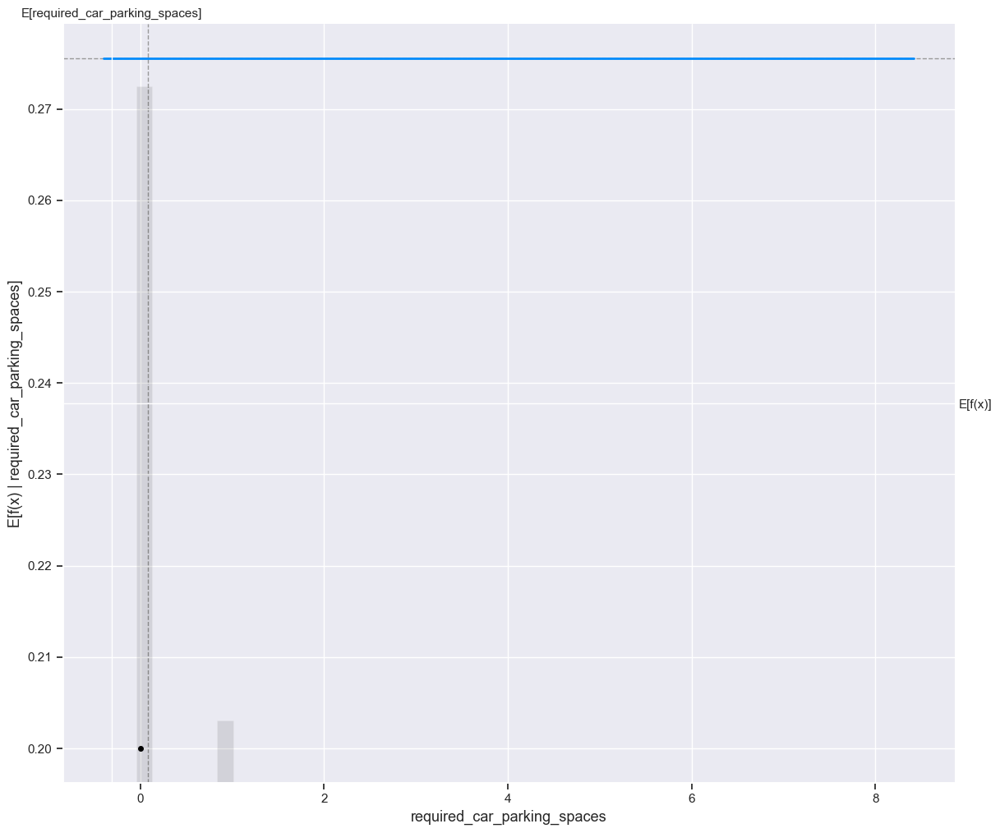

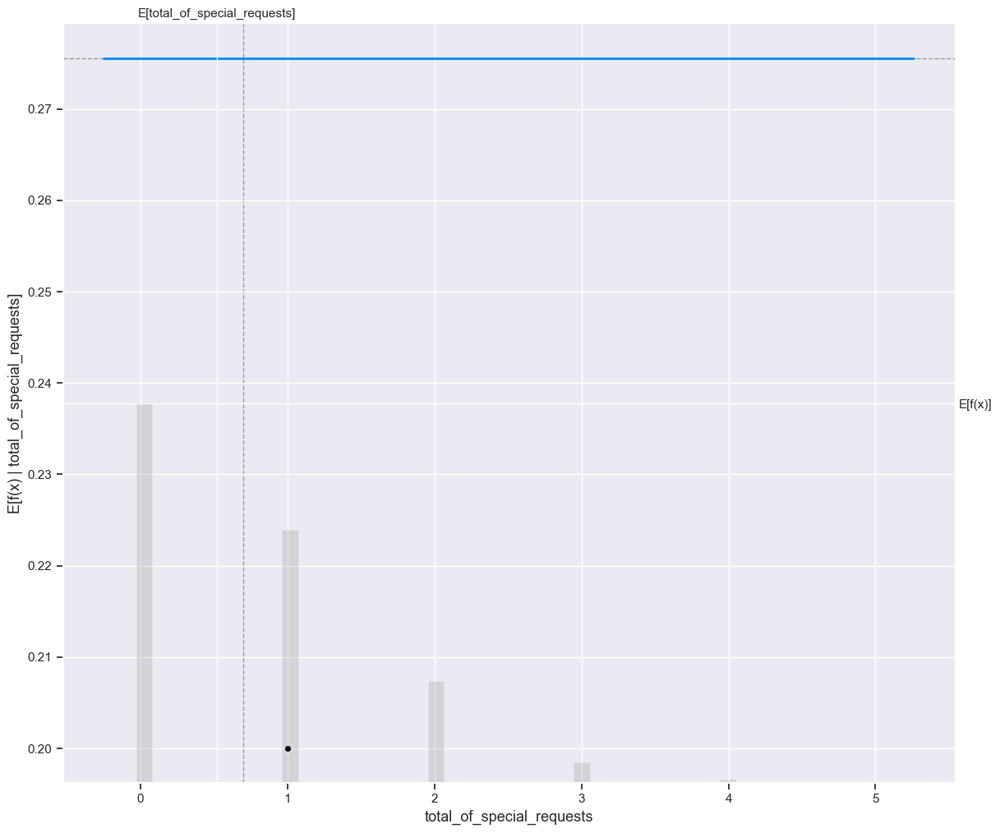

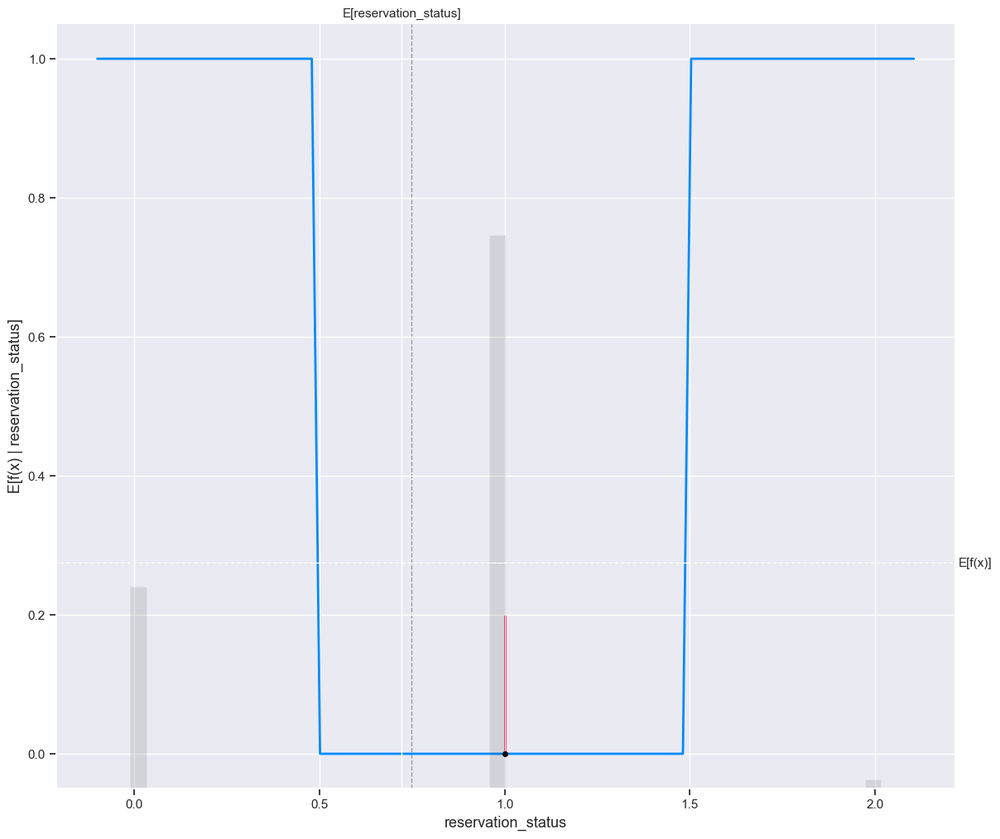

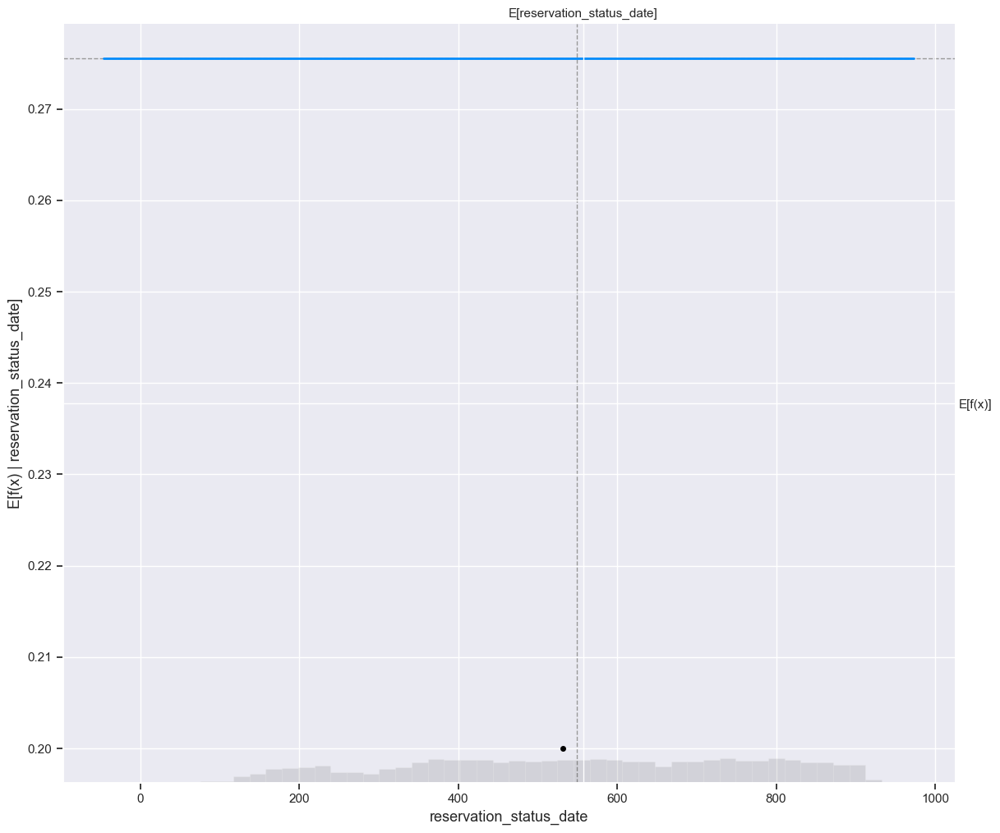

In [ ]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, X_train)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        X_train,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

## Interpreting SHAP Feature Importance Plot for Tree based model
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a tree based model
As we can see below in the plots, there is a difference in feature importance for both the models

For the tree based model, reservation status date is the second most important feature while reservation status is the most important feature

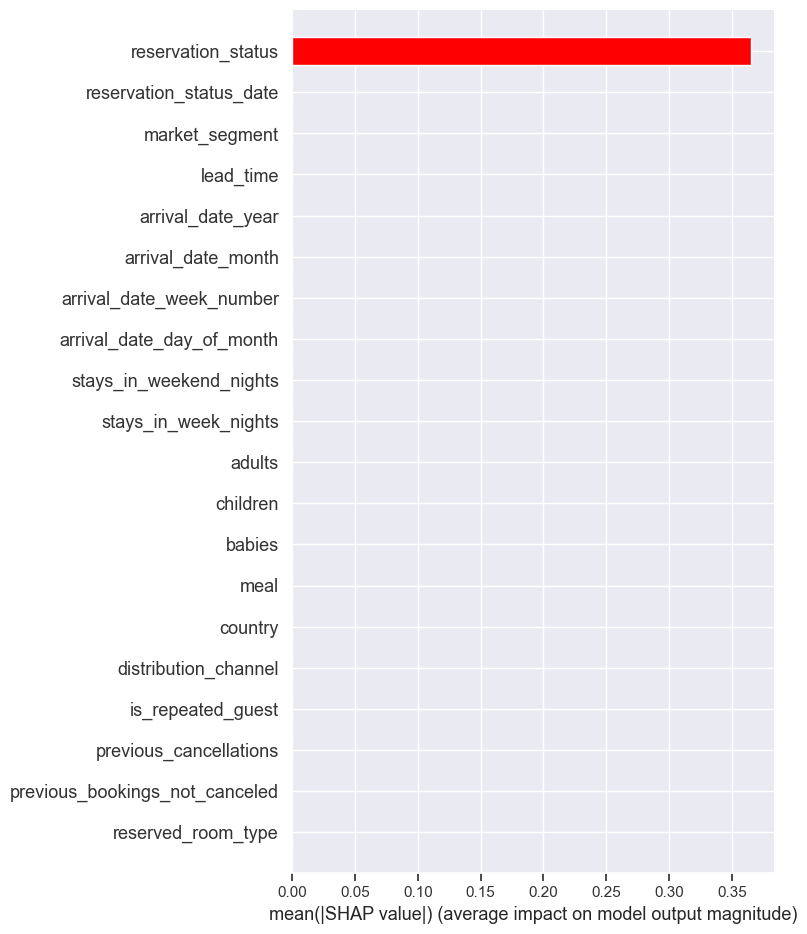

In [ ]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="red")

## Interpreting Waterfall SHAP visualization

Let's consider the same sample (sample_ind = 18)
Notice the value of reservation_status in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 0.57 is what we got as a model output and the expected output for this sample was 0.43. We came pretty close to determining it as the difference is only 0.15. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that reservation_status has the biggest and most positive impact in increasing hotel booking demand for this specific sample. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.42.

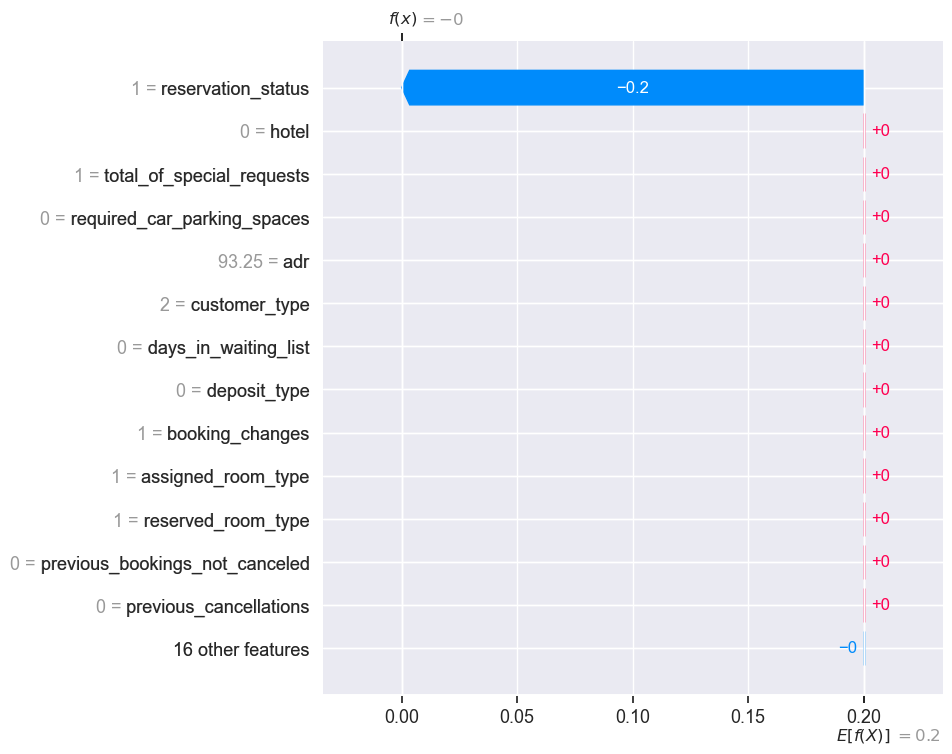

In [ ]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

## SHAP summary for tree based model
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

1. Each dot(both red and blue) represents a feature of a hotel booking
2. Red color represents high values whereas blue color represents low value
3. If a dot(a feature of wine) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
4. The position of a dot(a feature of wine) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

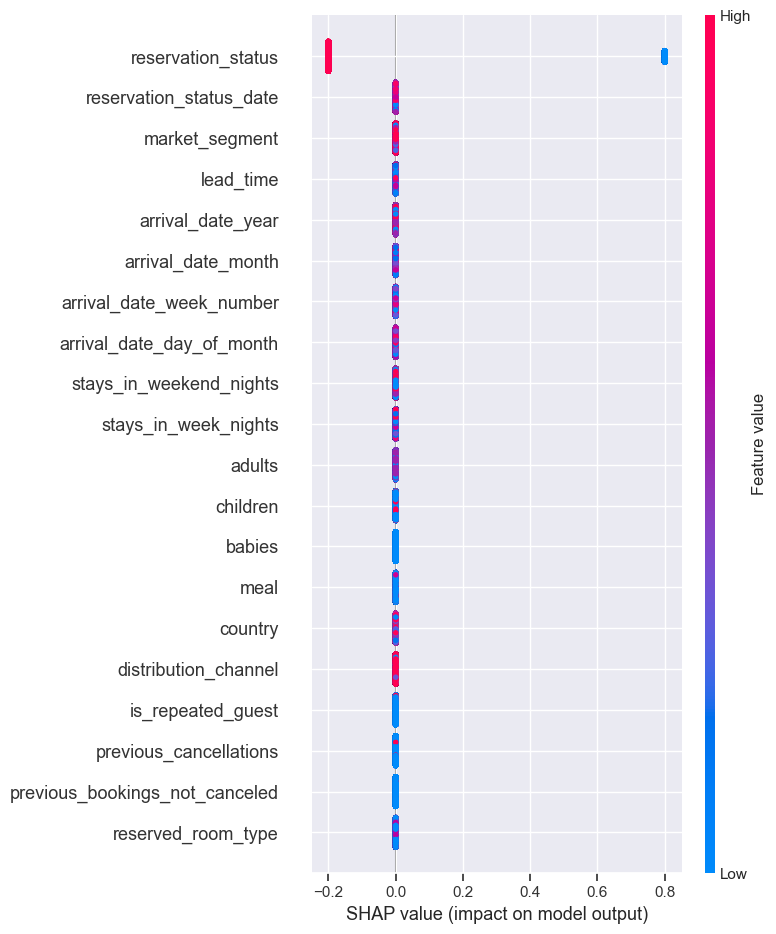

In [ ]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)

## Interpreting SHAP dependence plot for tree based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear models using the SHAP dependence plot. Here in these graphs, we get a dot for every wine in our dataset.

As we can observe the tree based model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the hotel booking demand (is_cancelled) then the relationship will be directly proportional e.g. reservation_status and deposit_type and if the feature harms hotel booking demand the relationship will be inversely proportional. e.g. adr and customer_type.

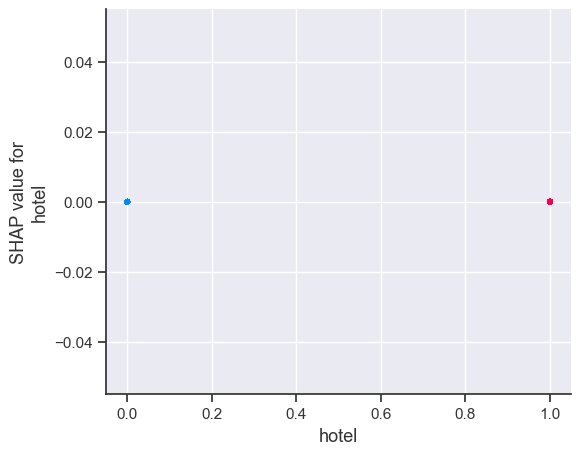

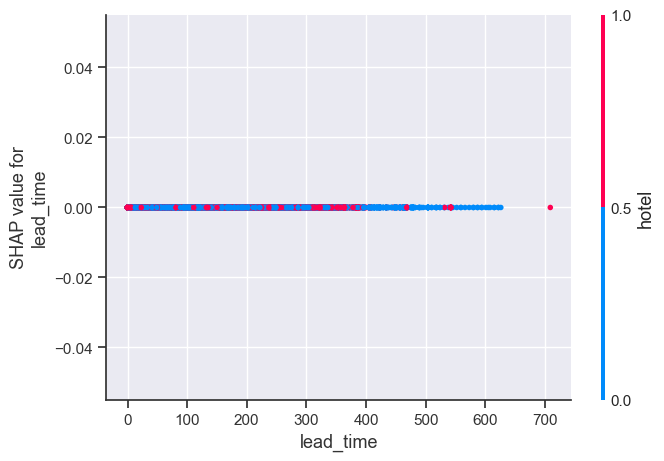

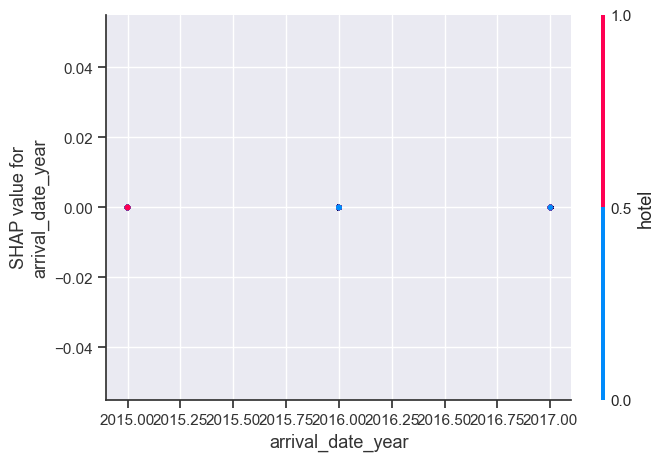

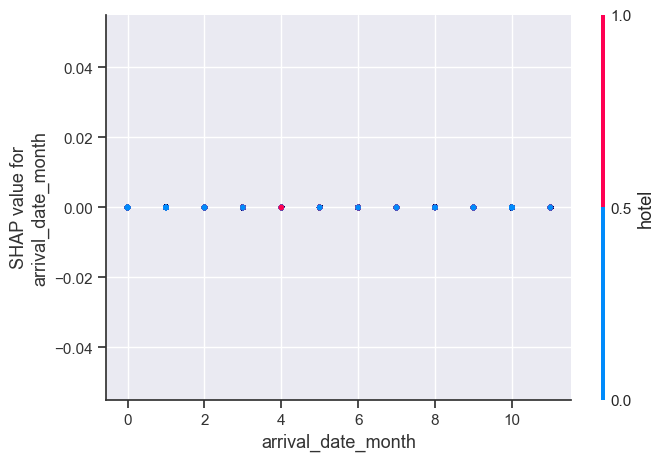

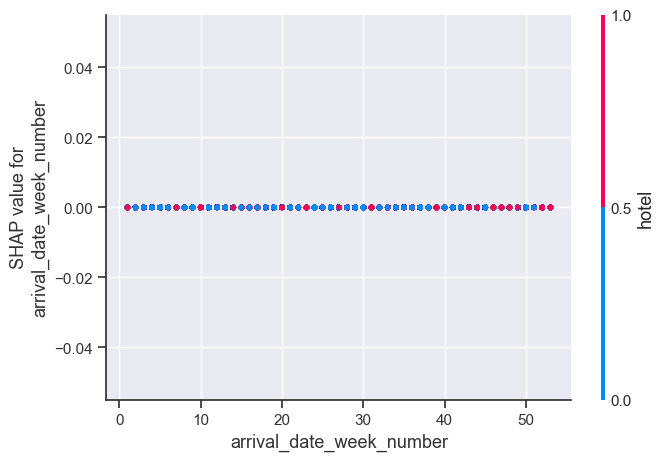

...

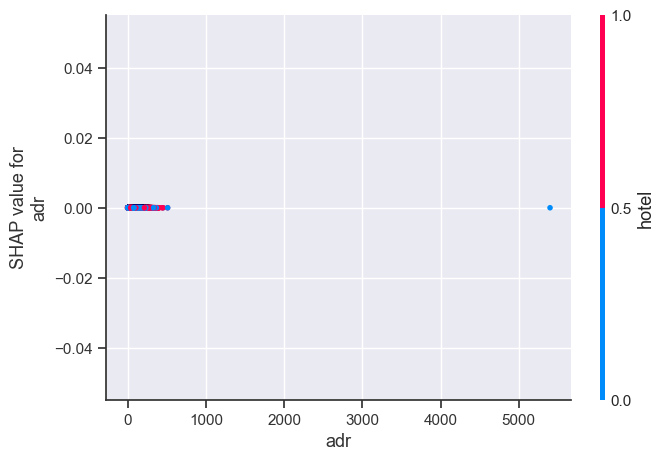

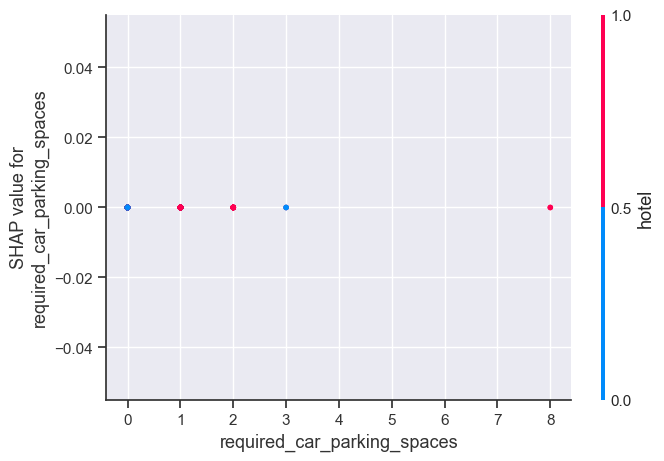

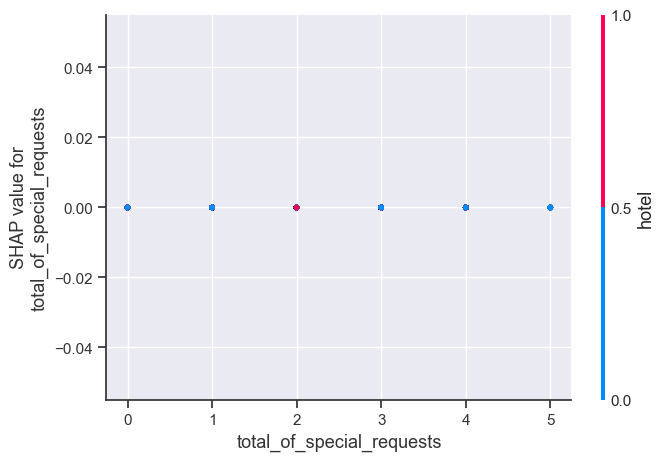

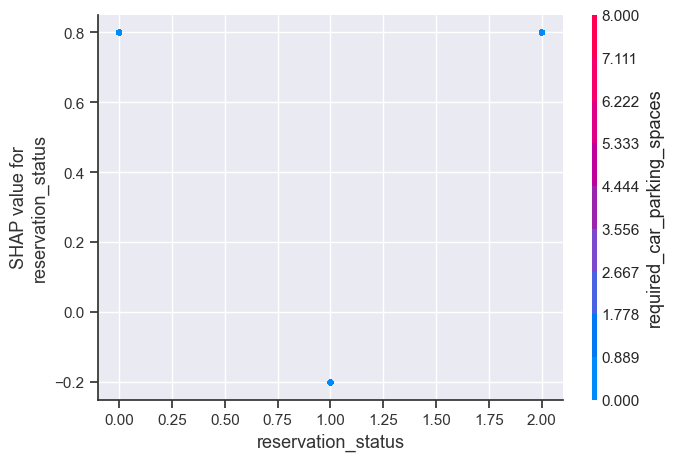

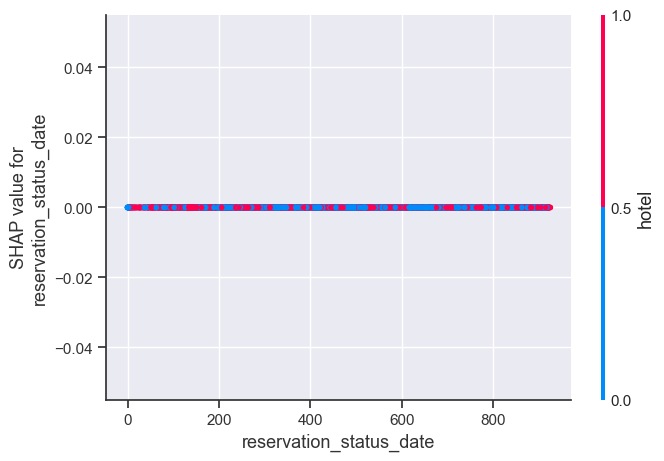

In [ ]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, X_train)

## SHAP Summary for a linear model

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

1. Each dot(both red and blue) represents a feature of a hotel booking
2. Red color represents high values whereas blue color represents low value
3. If a dot(a feature of wine) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
4. The position of a dot(a feature of wine) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

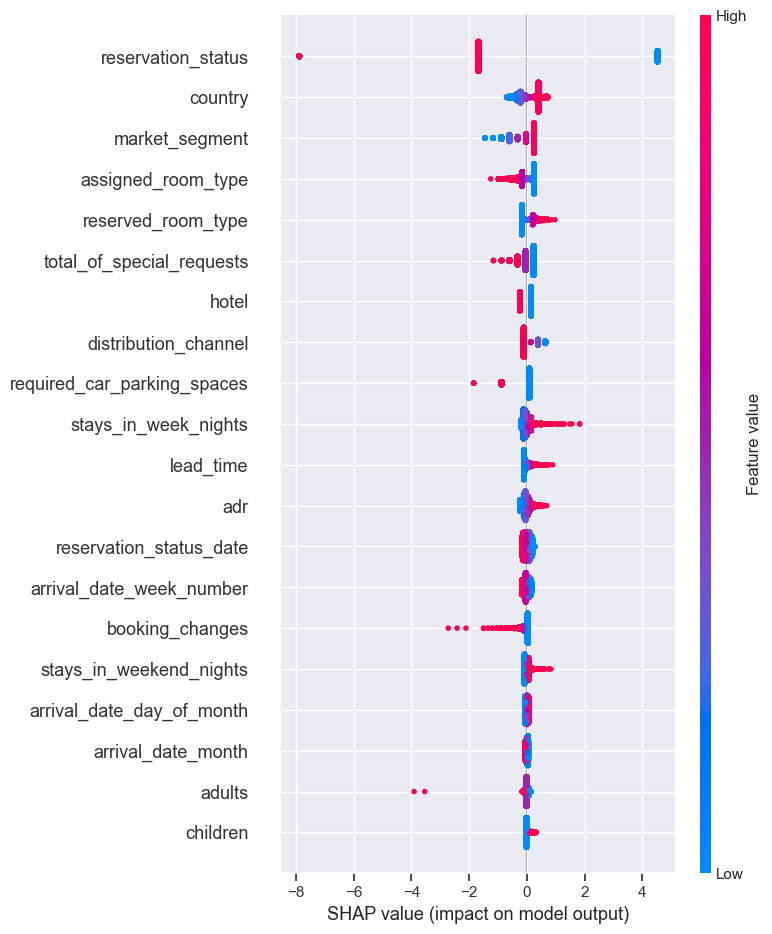

In [ ]:
explainer = shap.LinearExplainer(lr_model, X_test)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

## SHAP Analysis for Linear Model

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of reservation status

For the linear model the cross is made at approx E[f(x)] 0.38
So as the reservation status increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

Permutation explainer: 69532it [11:09, 102.39it/s]                              


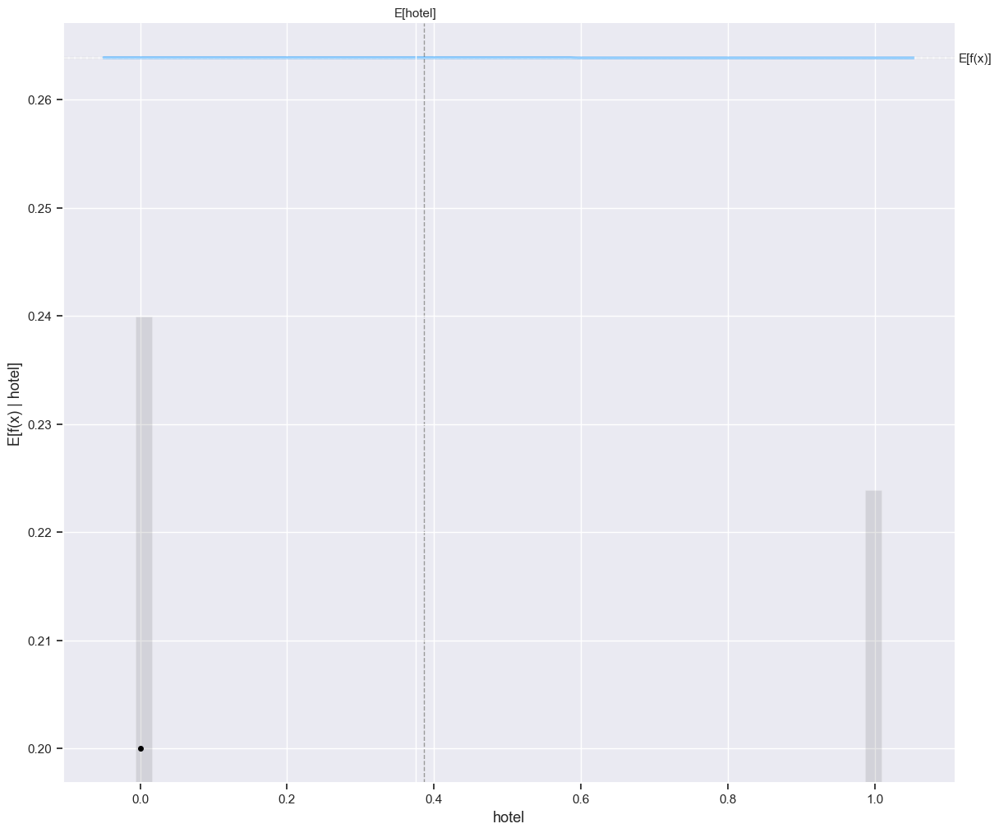

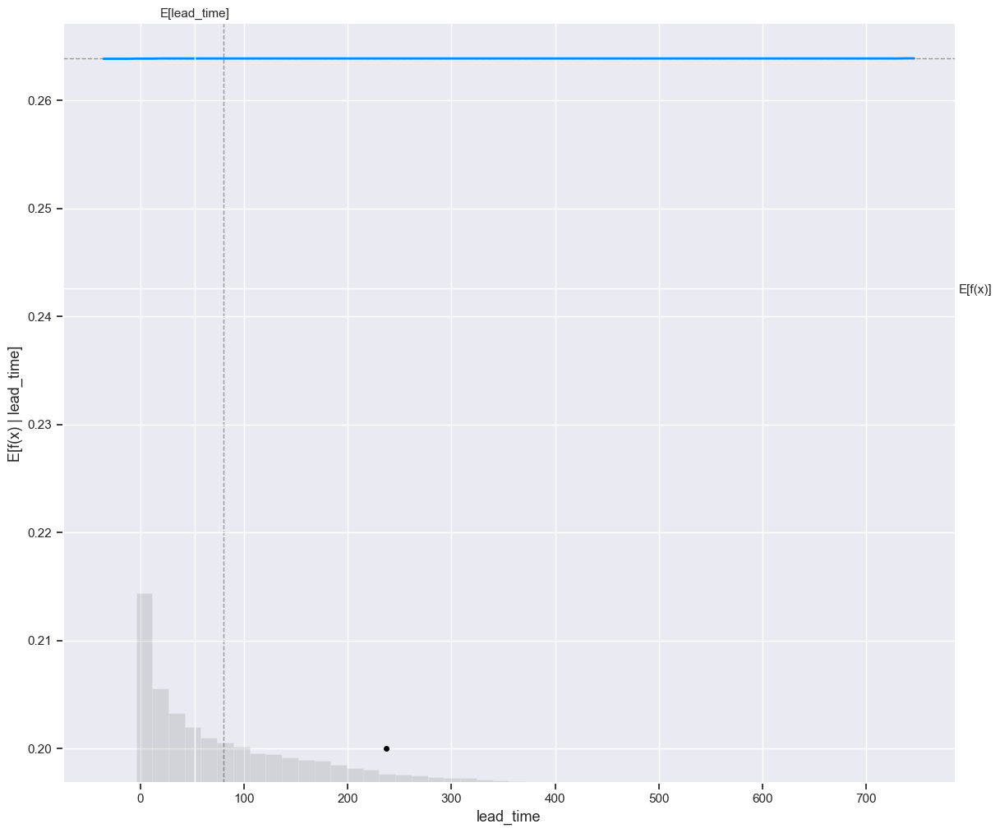

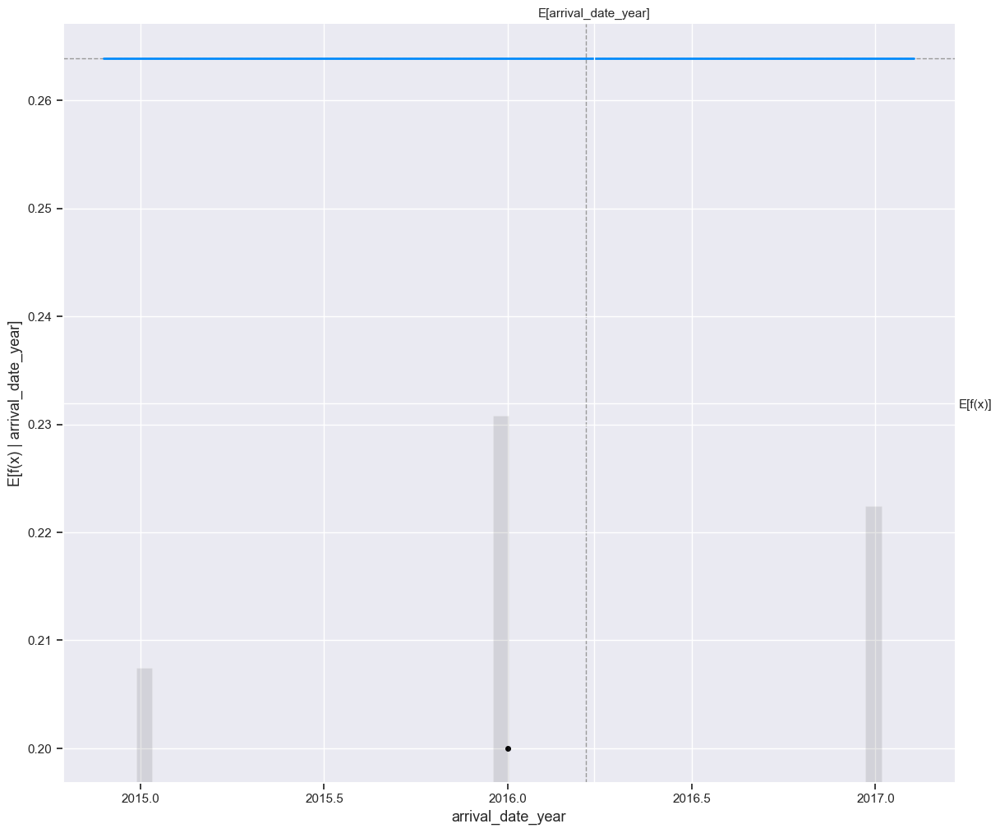

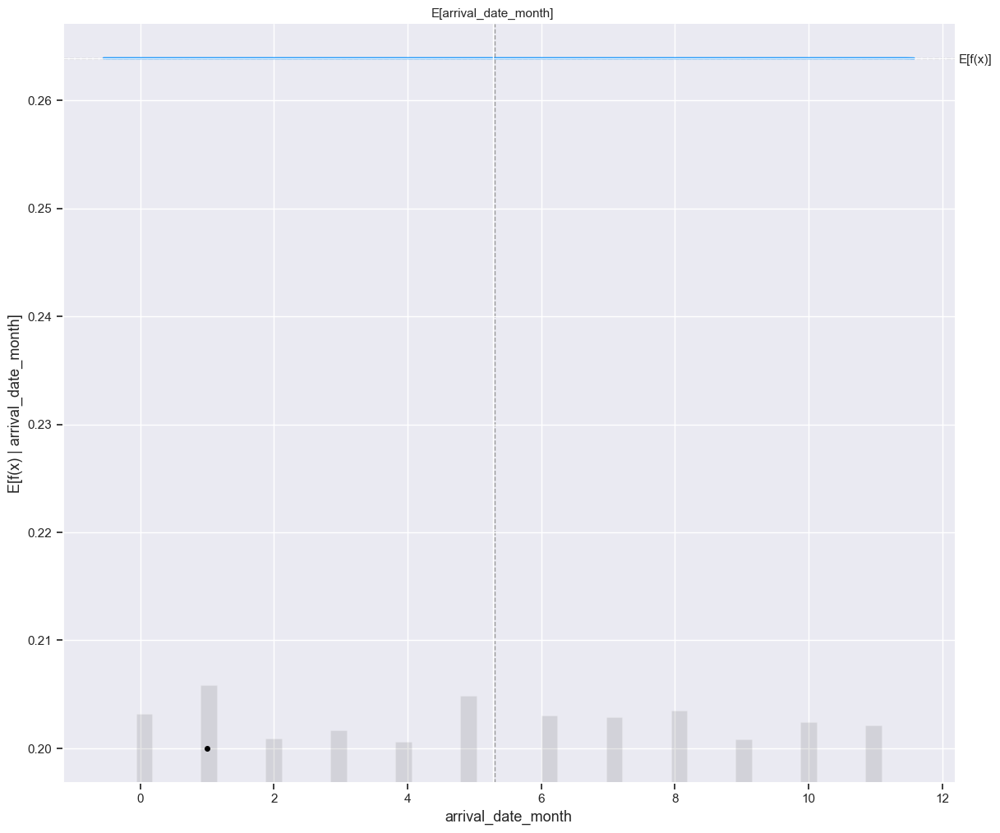

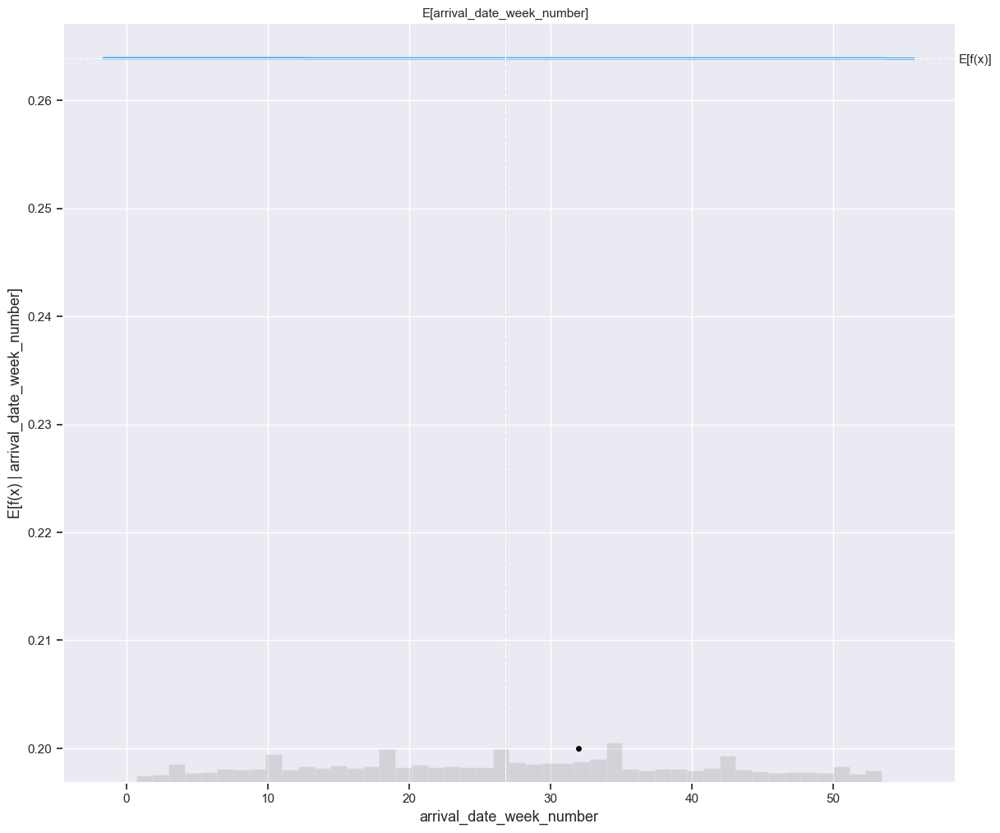

...

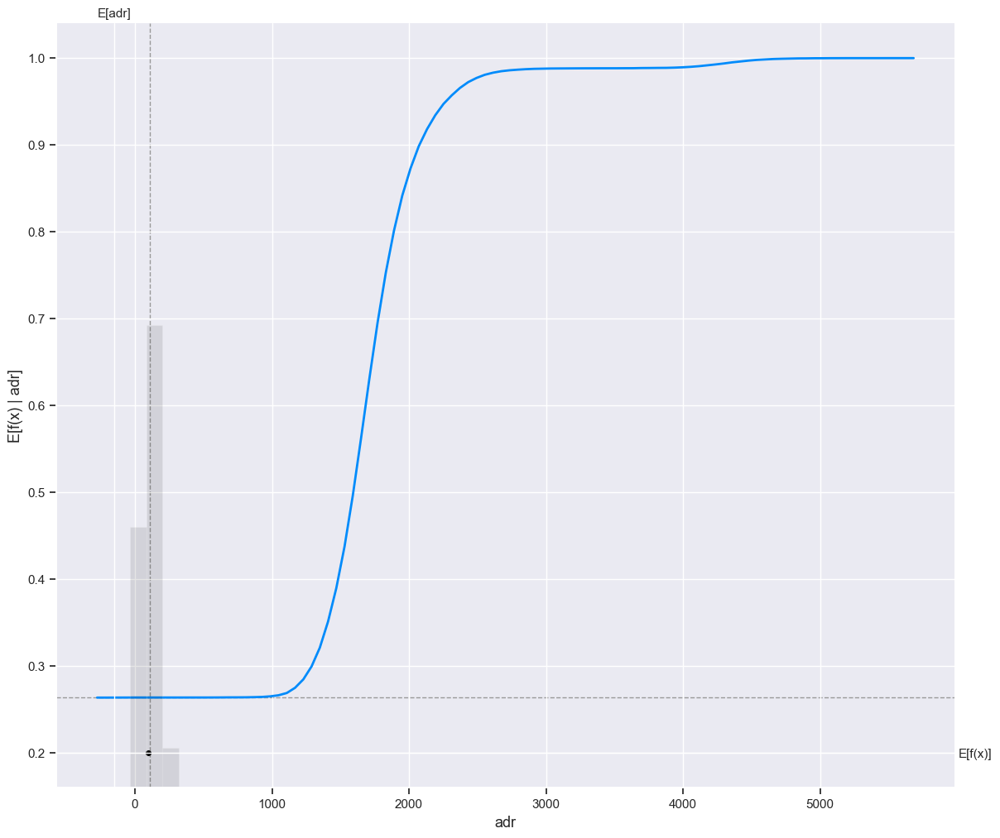

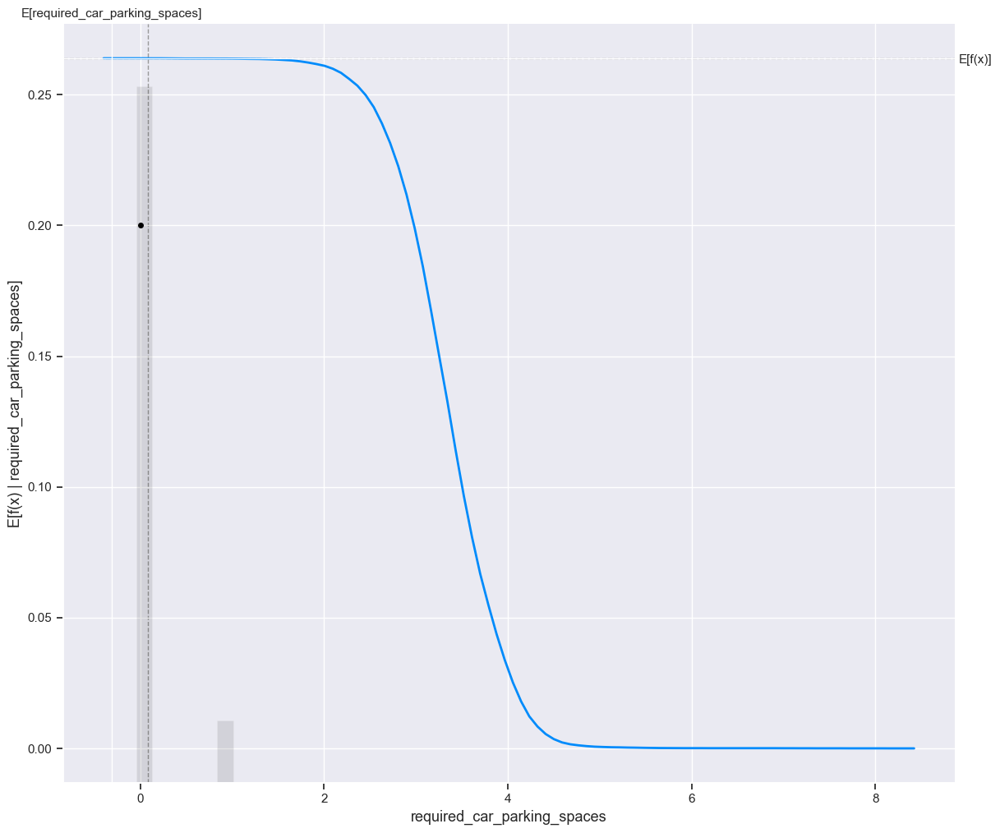

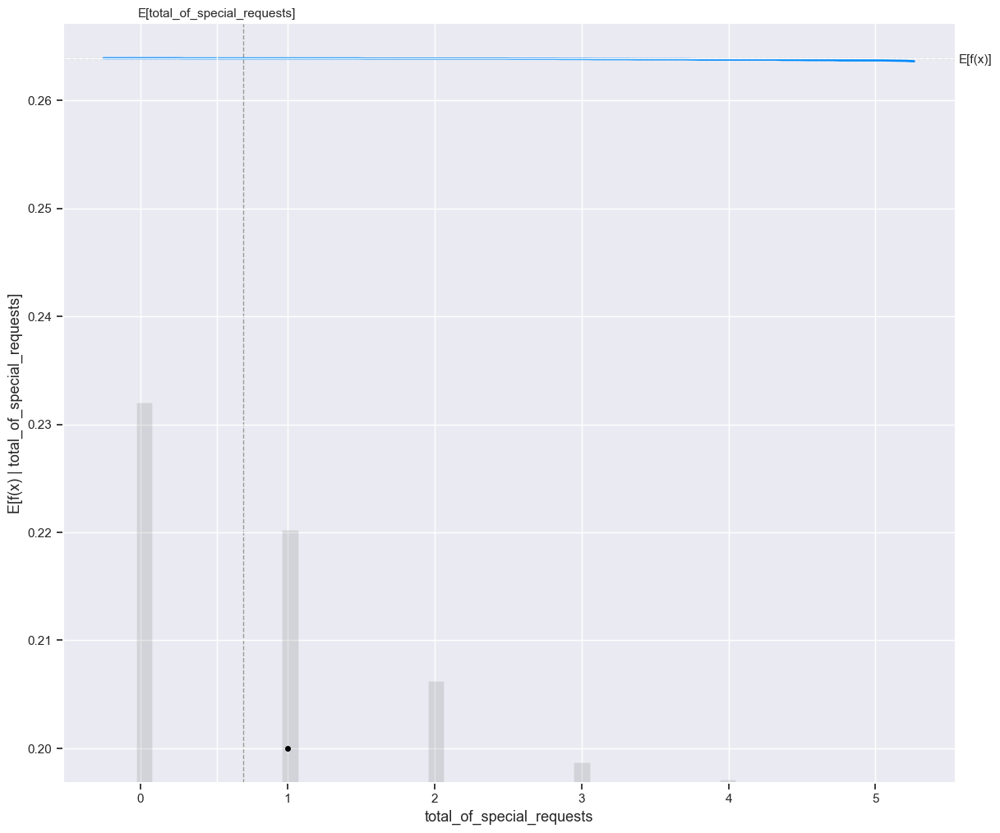

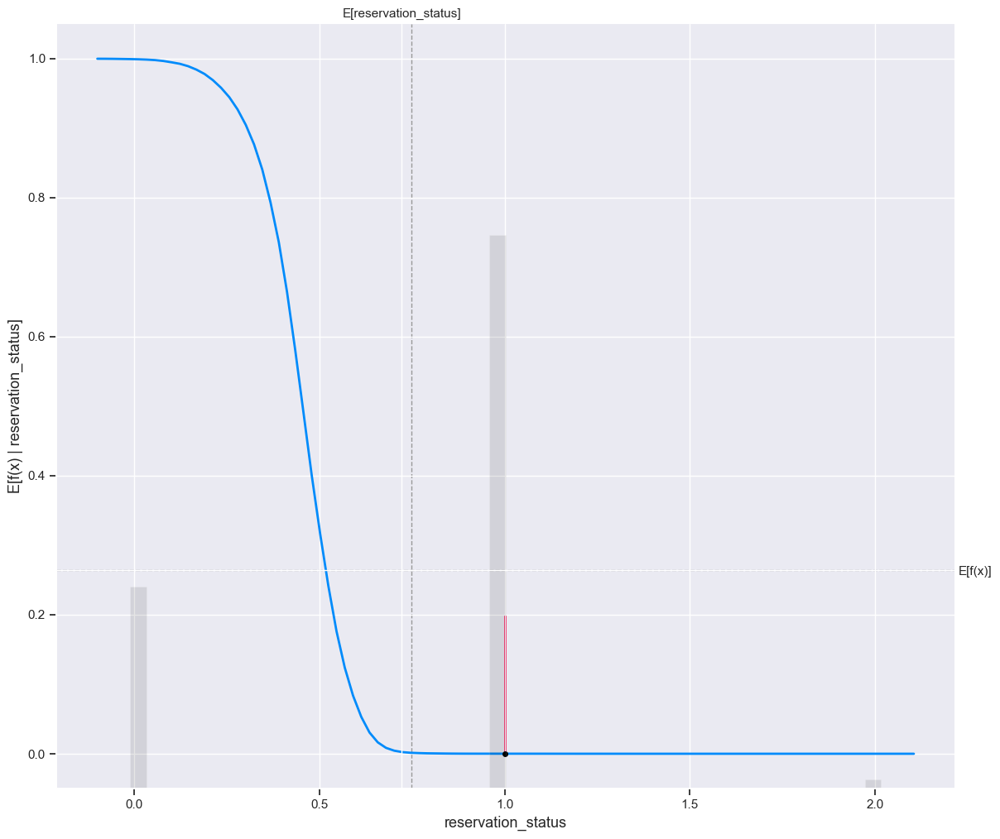

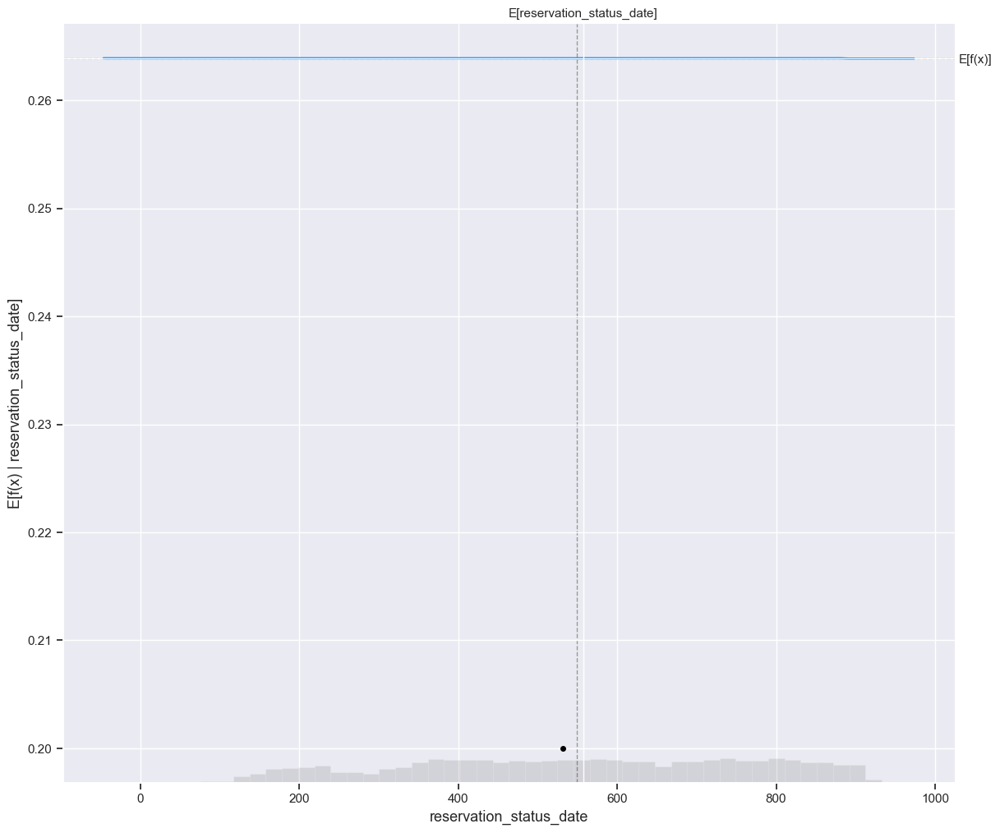

In [ ]:
# SHAP explanation of a Linear Model
logistic_explainer = shap.Explainer(lr_model.predict, X_train)
linear_shap_values = logistic_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        lr_model.predict,
        X_train,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

## Interpreting SHAP Feature Importance Plot for Linear model
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

SHAP feature importance for a linear model
As we can see below in the plots, there is a difference in feature importance for both the models

For the linear model, previous_cancellations is the second most important feature while reservation status is the most important feature

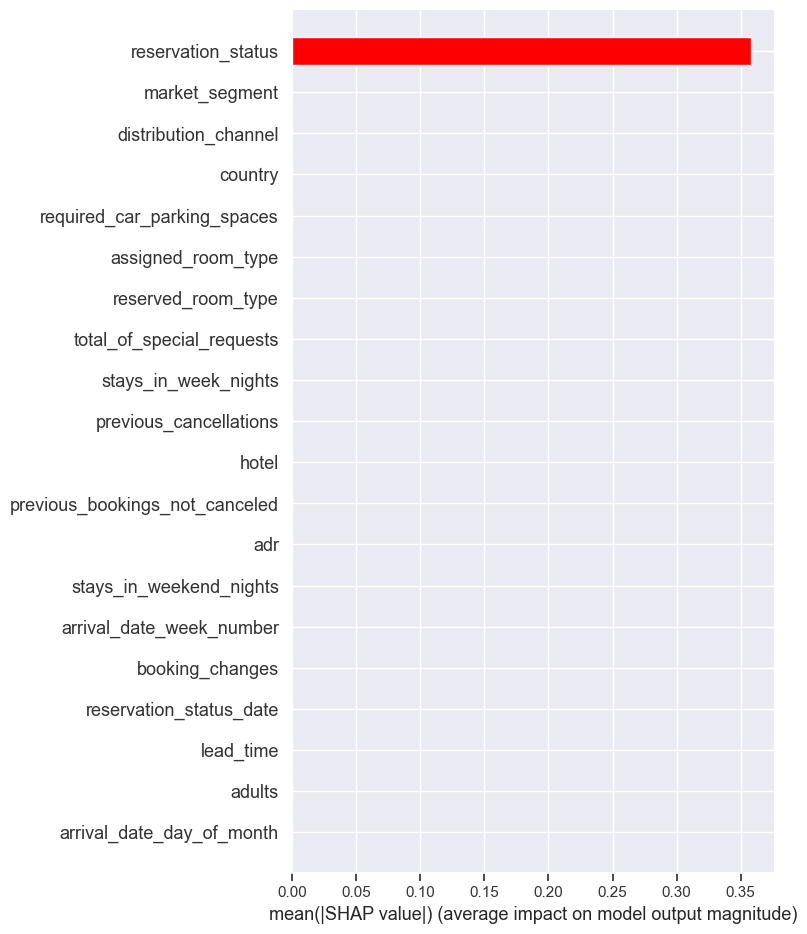

In [ ]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="red")

## Interpreting Waterfall SHAP visualization

Let's consider the same sample (sample_ind = 18)
Notice the value of reservation_status in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 0.58 is what we got as a model output and the expected output for this sample was 0.42. We came pretty close to determining it as the difference is only 0.16. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that reservation_status has the biggest and most positive impact in increasing hotel booking demand for this specific sample. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.42.

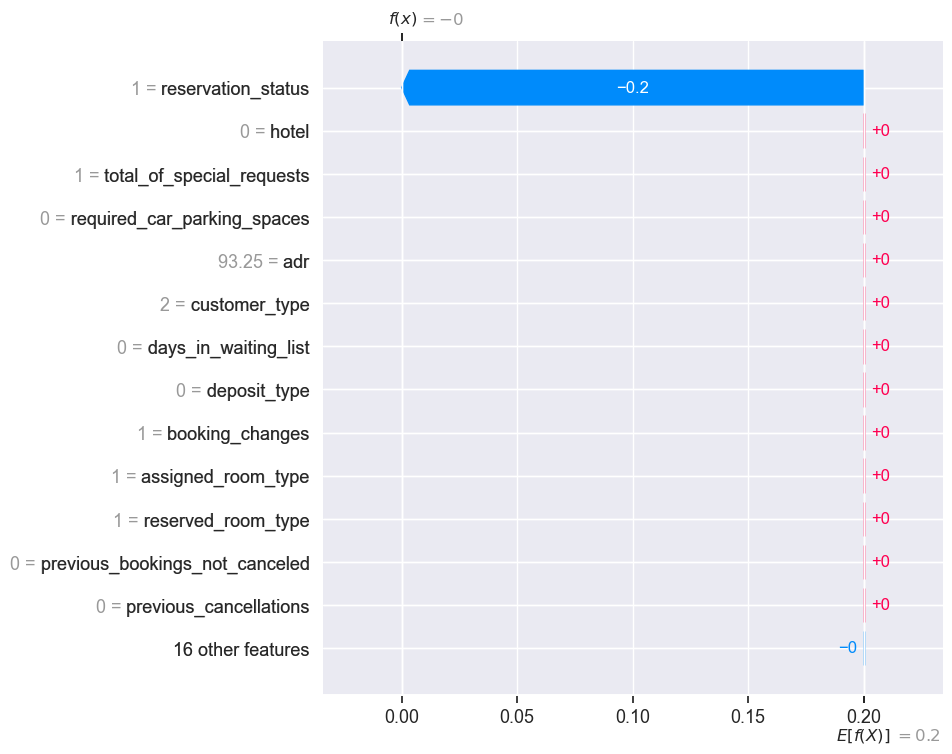

In [ ]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

## Interpreting SHAP dependence plot for Linear model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear models using the SHAP dependence plot. Here in these graphs, we get a dot for every wine in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the hotel booking demand (is_cancelled) then the relationship will be directly proportional e.g. reservation_status and deposit_type and if the feature harms hotel booking demand the relationship will be inversely proportional. e.g. adr and customer_type.

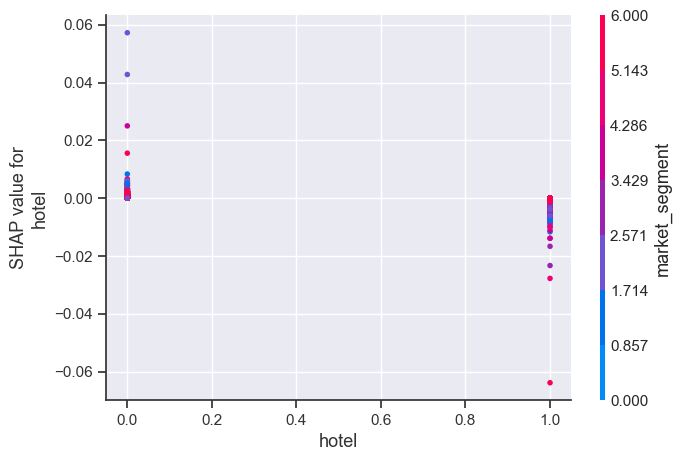

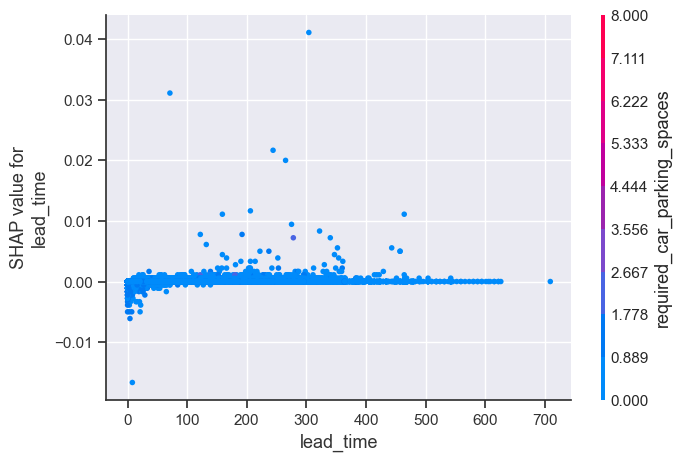

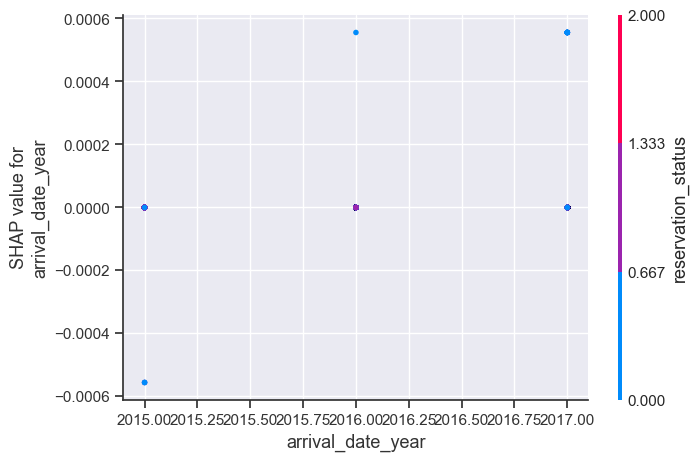

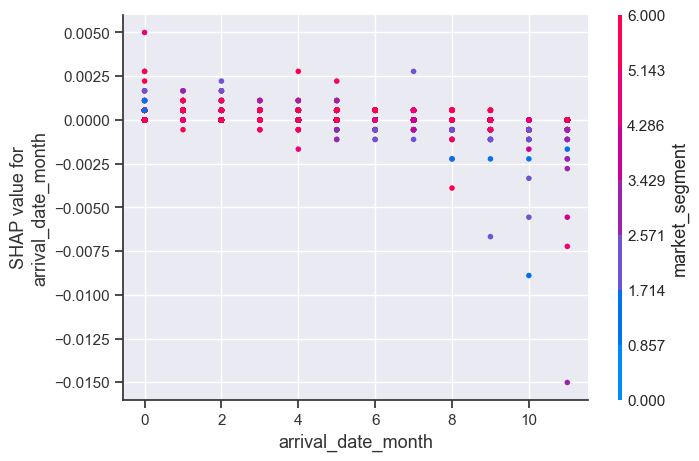

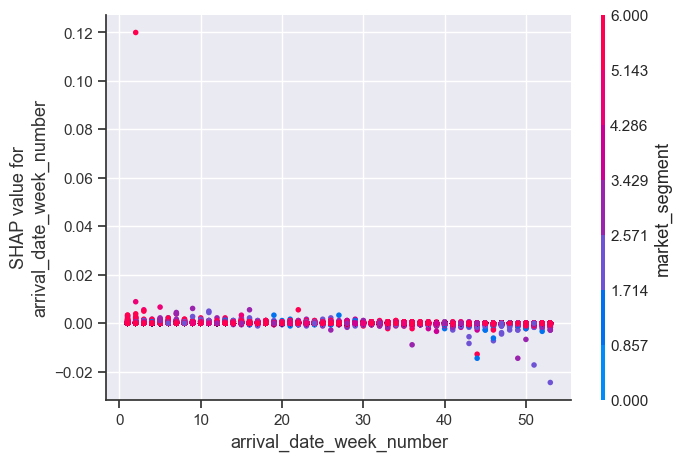

...

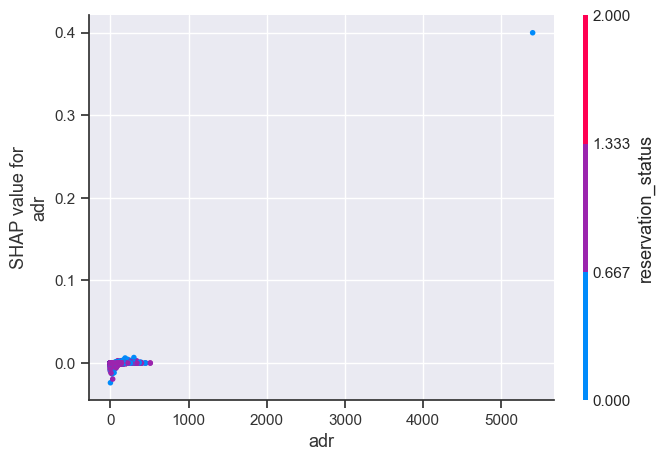

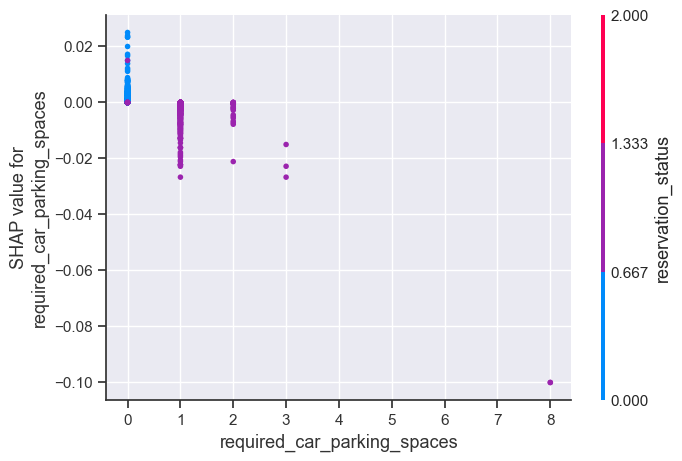

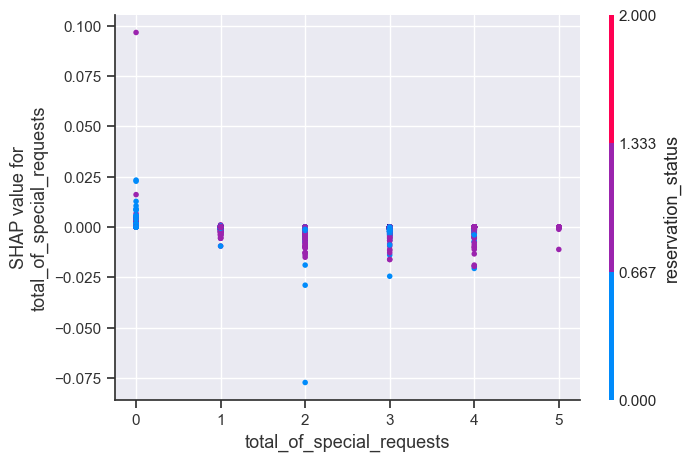

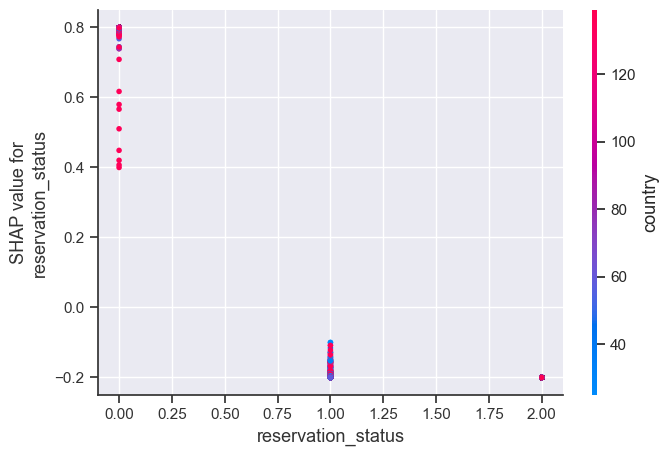

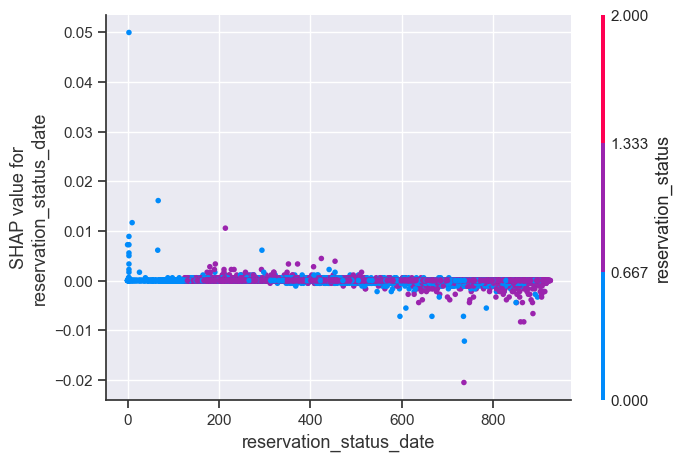

In [ ]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)

### Final Takeaways
The AutoML's best model with its Hyperparameter's tuned is the best model for this task as it has the highest accuracy compared to the other models tested in this excercise. Also, this model is interpretible i.e. we can actually get to the root of what made this prediction to come to.

1. What is the question?

2. What did you do?

3. How well did it work?

4. What did you learn?

### Learning Outcomes
I learned the complete lifecycle of a Data Science project right from data prepartion to hyperparameter tuning
Majority of the time should be invested in data preparation i.e. cleaning the data, normalizing, feature selection, imputation etc
Hyperparameter tuning is the second most important thing after data preparation, which most of the practioner's ignore. But the results are worth the time invested
Multiple models must be trained and the best models should be selected to be deployed, as some algorithms perform much better than the other's on specific tasks
Model Interpretation(Unboxing the Black Blox) is the best takeaway from the series of this assignments. SHAP, LIME and PDP have made it easier to understand what made a model to predict a outcome.

## References

1. [Regularization](https://harish-reddy.medium.com/regularization-in-python-699cfbad8622)
2. [SHAP Summary](https://towardsdatascience.com/introduction-to-shap-with-python-d27edc23c454)
3. [AutoML](https://towardsdatascience.com/python-automl-sklearn-fd85d3b3c5e)
4. [Correlation-Analysis](https://machinelearningmastery.com/how-to-use-correlation-to-understand-the-relationship-between-variables/)
5. [OLS](https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.html)
6. [AutoML](https://www.automl.org/automl/)

MIT License

Copyright (c) 2023 Naman Diwan

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.